### `📤 Import Libraries`.

In [4]:
import os
import io
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.ticker as tkr
import psycopg2
import xlsxwriter
import scipy.stats
import dataframe_image as dfi
import time
import tarfile # Read and write tar archives, including those using gzip, bz2 and lzma compression.
import zipfile # Read or write (.zip) files, or the higher-level functions in shutil
import urllib.request # Open and fetch data from URLs
import warnings
warnings.filterwarnings('ignore')

#==#

from io import BytesIO
from numpy import mean, absolute
from numpy import median, absolute
from sqlalchemy import create_engine
from matplotlib.ticker import FormatStrFormatter, StrMethodFormatter, FuncFormatter, PercentFormatter, MultipleLocator, AutoMinorLocator
from matplotlib import font_manager
from matplotlib import colormaps
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.cbook import boxplot_stats
from pandas.io.formats.style import Styler
from pandas.io.formats.excel import ExcelFormatter
from openpyxl import Workbook
from scipy import stats
from scipy.stats import norm # Normalisation of data
from scipy.stats import trim_mean
from statistics import variance
from statistics import stdev
from sklearn import metrics
from sklearn.linear_model import LinearRegression # Statistical method for predicting an outcome based on one or more influencing factors
from sklearn.linear_model import LogisticRegression # Statistical method for predicting binary classes
from sklearn.model_selection import train_test_split, GridSearchCV # Split arrays or matrices into random train and test subsets, Test multiple scenarios to get the best performing performace for the model
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler # Standardise data
from sklearn.neighbors import KNeighborsClassifier
from sklearn.compose import ColumnTransformer # Apply transformers to specific columns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE # Visualise complex high-dimensional data in a lower-dimensional space
from sklearn.cluster import KMeans # KMeans method from sklearn to build the K-Means model
from yellowbrick.cluster import KElbowVisualizer # KElbowVisualizer to visualise K-Means model performance
from fpdf import FPDF
from PIL import Image
from IPython.display import HTML, display
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from datetime import timedelta # Represent the difference between two datetime objects.
from pathlib import Path

#==#

# Time series and forecasting libraries
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose # Use for seasonal sales data
import statsmodels.api as sm

# For advanced forecasting
from prophet import Prophet  # Requires `pip install prophet`

# Model evaluation
from sklearn.metrics import confusion_matrix # Evaluate the accuracy of a classification.
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

#==#

import pmdarima as pm
from statsmodels.tsa.arima.model import ARIMA

#==#

# Apriori algorithm and association rule mining libraries
import networkx as nx # Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks.
from mlxtend.frequent_patterns import apriori, association_rules # Get frequent itemsets from a one-hot DataFrame, Generates a DataFrame of association rules including the metrics 'score', 'confidence', and 'lift'
from mlxtend.preprocessing import TransactionEncoder # Encoder class for transaction data in Python lists

#==#

from lifetimes import BetaGeoFitter, GammaGammaFitter # BG/NBD + Gamma-Gamma model for Predicting Customer Lifetime Value (CLTV)
from lifetimes.utils import summary_data_from_transaction_data

#==#

# pd.options.display.max_columns = 100
# pd.set_option('display.max_columns', 100)

# Show all columns
pd.set_option('display.max_columns', None)

# Show all rows
pd.set_option('display.max_rows', None)

# Prevent line wrapping of wide columns (for cleaner display)
pd.set_option('display.expand_frame_repr', False)

# Display nicely
pd.set_option('display.max_colwidth', None)

#==#

%matplotlib inline

### `📥 Load Dataframe`.

In [5]:
# Define path to california housing market data analysis file
file_path = os.path.expanduser("~/Python-Documents/os/CSV Files/California_Housing_Market_Data_Analysis_modified_1.csv")

# Read and copy data
read_csv = pd.read_csv(file_path)
housing = read_csv.copy()

# Display first 2 rows
housing.head(2)

#==#

# # Load the dataset
# file_path = r"\Users\tailb\Python-Documents\os\CSV Files\California_Housing_Market_Data_Analysis_modified_1.csv"

# # Read and copy data
# read_csv = pd.read_csv(file_path)
# housing = read_csv.copy()

# # Display first 2 rows
# housing_full.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY


In [6]:
# # Load dataframe and display first 5 rows.
# def load_housing_data():
#     tarball_path = Path("datasets/housing.tgz")
#     if not tarball_path.is_file():
#         Path("datasets").mkdir(parents=True, exist_ok=True)
#         # url = "https://github.com/ageron/data/raw/main/housing.tgz"
#         # url = "https://github.com/ageron/data/raw/refs/heads/main/housing.tgz"
#         url = "https://github.com/ageron/data/blob/main/housing/housing.tgz"
#         urllib.request.urlretrieve(url, tarball_path)
#         with tarfile.open(tarball_path) as housing_tarball:
#             housing_tarball.extractall(path="datasets", filter="data")
#     return pd.read_csv(Path("datasets/housing/housing.csv"))
# housing_full = load_housing_data()
# housing_full.head()

# # https://github.com/ageron/data/raw/refs/heads/main/housing.tgz

### `📶 Analyse Dataframe`.

#### `⚙️ Set Plot Context And Style`.

In [7]:
# Set plot context and style

# Step 1: Set font dictionaries
title_font = {'family':'trebuchet ms','color':'darkorchid','size':20,'style':'normal','weight':'bold'}
x_label_font = {'family':'verdana','color':'darkred','size':15,'style':'normal','weight':'bold'}
y_label_font = {'family':'verdana','color':'darkgreen','size':15,'style':'normal','weight':'bold'}
text_font = {'ha':'center','va':'bottom','family':'georgia','color':'green','size':8,'style':'normal','weight':'bold'}

# Step 2: Set styles
context = sns.set_context("notebook") # ('paper', 'notebook', 'talk', 'poster')
# style = sns.axes_style() # ('darkgrid', 'whitegrid', 'dark', 'white', 'ticks')
style = sns.axes_style("ticks",{
    # Figure
    'figure.figsize':(10, 6),'figure.dpi':100,   
    # Grid (grid.axis:'x', 'y', 'both', grid.which: 'major', 'minor', 'both')
    'axes.grid':True, 'grid.linestyle':'-.','grid.linewidth':0.2,'grid.color':'white', 'grid.alpha':0.2,'axes.grid.axis':'both', 'axes.grid.which':'major',
    # Axes Background
    'axes.facecolor':'white','figure.facecolor':'lightblue','axes.alpha':1.0, # lightblue
    # Axes Border (Spines)
    'axes.edgecolor':'cyan', 'axes.linewidth': 1.5, 'axes.spines.top': False,'axes.spines.right':False, 'axes.spines.left':True, 'axes.spines.bottom':True,
    # Axes Labels (x/y label color, x/y label font size)
    'axes.labelcolor':'black', 'axes.labelsize': 'medium', 'axes.labelweight':'normal', 'axes.labelpad':4.0,  
    # Tick Marks
    'xtick.bottom':True,'xtick.top':False, 'xtick.color':'darkgreen', 'xtick.labelcolor':'darkred', 'xtick.labelsize':7,
    'xtick.major.size':6, 'xtick.major.width':2,'xtick.major.pad':4, 'xtick.minor.size':3,'xtick.minor.width':0.5, 'xtick.direction':'out',
    'ytick.left':True, 'ytick.right':False, 'ytick.color':'darkblue', 'ytick.labelcolor':'darkgreen', 'ytick.labelsize':7,
    'ytick.major.size':6,'ytick.major.width':2, 'ytick.major.pad':4,'ytick.minor.size':3, 'ytick.minor.width':0.5,'ytick.direction':'out',
    # Lines (-, --, -., :, solid, dashed, dashdot, dotted)
    'lines.linewidth':1.5, 'lines.markersize':6, 'lines.linestyle':'-',
    # Font (global font family, global font size)
    'font.family': 'consolas', 'font.size':10, 'font.style':'normal', 'font.weight':'normal',
    # Legend(legend border box, legend transparency, legend border color & legend background)
    'legend.frameon':True, 'legend.framealpha':0.8, 'legend.edgecolor':'black', 'legend.facecolor':'white'})        

# Step 3: Set theme
sns.set_theme(context=context, style=style, palette='bright', font='tahoma', font_scale=None, color_codes=True)

#### `📈 Univariate Analysis`.

**`Examining a single variable at a time to identify patterns, central tendencies, and dispersion`**.

##### `📊 Histogram - Distribution Of California Housing Features`.

In [8]:
# # Univariate Analysis
# sns.displot(housing['median_house_value'])
# plt.ylabel('Density')

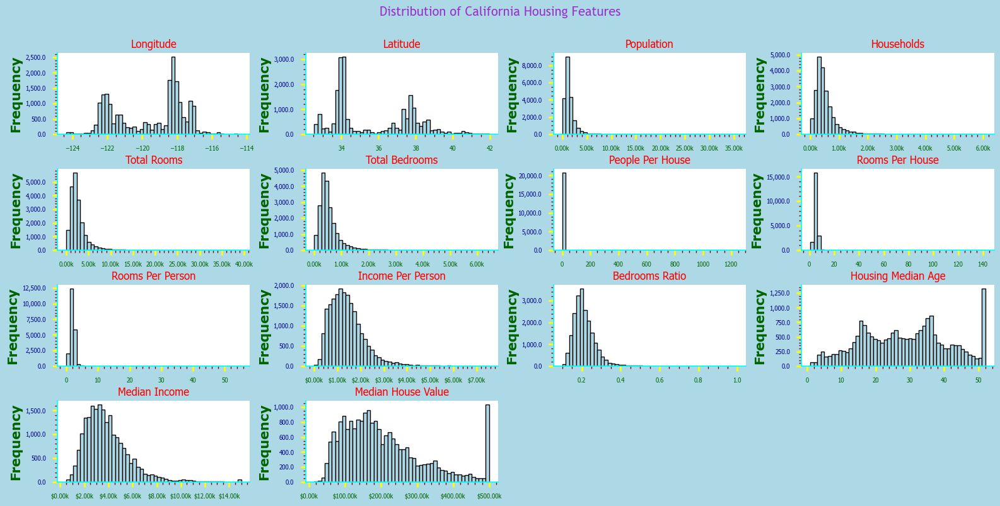

In [9]:
# Step 1: Plot histograms and capture the returned axes
axes = housing.hist(bins=50, figsize=(16, 8), color='lightblue', edgecolor='black')

# Step 2: Define $k formatter function
def dollar_k_formatter(x, pos):
    return f'${x/1000:,.2f}k'    # e.g. \$100k, \$200k

# Step 3: Define $k formatter function
def count_k_formatter(x, pos):
    return f'{x/1000:,.2f}k'    # e.g. \100k, \200k

# Step 4: Define specific columns and their formatters
currency_cols = ['median_income', 'median_house_value', 'income_per_person']   # $k format
# percent_cols  = [] # % format
non_currency_cols  = ['population', 'households', 'total_rooms', 'total_bedrooms'] # count k format

# Step 5: Add ylabel to each subplot
for hist in axes.flatten():
    col_name = hist.get_title()  # 👈 Get column name from subplot title
    if hist.has_data():
        hist.set_title(col_name.replace('_', ' ').title(), family='tahoma', color='red') # .upper(), .lower()
        # hist.set_xlabel(col_name.replace('_', ' ').title(), fontdict=x_label_font)
        hist.set_ylabel('Frequency', fontdict=y_label_font)
        hist.yaxis.set_major_formatter(StrMethodFormatter('{x:,}')) #
        hist.minorticks_on()
        hist.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
        hist.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
        hist.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
        hist.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
        # hist.autoscale()
        # hist.axis('equal')
        # hist.set_xlim(left=0)
        # hist.set_ylim(bottom=0)
        # hist.set_xscale('log')
        # hist.set_yscale('log')
        # hist.set_yscale('linear')  # Try removing log scale
    
    # Step 6: Apply specific x-axis formatters based on column name
    if col_name in currency_cols:
            # hist.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}'))   # $ format
            hist.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))  # $k format
    elif col_name in non_currency_cols:
            # hist.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))     # count format
            hist.xaxis.set_major_formatter(FuncFormatter(count_k_formatter))  # count k format

# Step 7: Plot subplot title
plt.suptitle("Distribution of California Housing Features", fontdict=title_font, x=0.5, y=1.00) # Overview of Housing Dataset Variables, Statistical Distribution of Housing Attributes

# Step 8: Adjust subplot params
plt.tight_layout(pad=1, h_pad=0.3, w_pad=0.3, rect=None)

#==#

# Step 9: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_01_Distribution_Of_CAL_Housing_Features_Histplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 10: Display plot
plt.show()

##### `✂️ Global Cutoff 1 — Pre Training Pipeline`.

In [10]:
# ═══════════════════════════════════════════
#   Global Cutoff 1 — Pre Training Pipeline
# ═══════════════════════════════════════════

# Step 1: Start With Raw Housing Data
print(f"Original Dataset Size : {len(housing):,}")

#==#

# Step 2: Define Global Cutoff Bounds
lower_cutoff = housing['median_house_value'].quantile(0.05)
upper_cutoff = housing['median_house_value'].quantile(0.95)

print(f"Lower Cutoff (5th pctl) : ${lower_cutoff:,.0f}")
print(f"Upper Cutoff (95th pctl): ${upper_cutoff:,.0f}")

#==#

# Step 3: Apply Global Cutoff
housing_clean_1 = housing[
    (housing['median_house_value'] >= lower_cutoff) &
    (housing['median_house_value'] <= upper_cutoff)
]

#==#

# Step 4: Summary
print(f"""
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
     Global Cutoff Summary
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
Original Size  : {len(housing):,.0f}
Clean Size     : {len(housing_clean_1):,}
Rows Removed   : {len(housing) - len(housing_clean_1):,.0f}
Lower Cutoff   : ${lower_cutoff:,.0f}
Upper Cutoff   : ${upper_cutoff:,.0f}
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
""")

Original Dataset Size : 20,640
Lower Cutoff (5th pctl) : $66,200
Upper Cutoff (95th pctl): $489,810

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
     Global Cutoff Summary
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
Original Size  : 20,640
Clean Size     : 18,577
Rows Removed   : 2,063
Lower Cutoff   : $66,200
Upper Cutoff   : $489,810
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━



In [11]:
# # Define Median House Value Global Cutoff Bounds
# lc = housing['median_house_value'].quantile(0.05)
# uc = housing['median_house_value'].quantile(0.95)

# # Display Median House Value Lower and Upper Cutoff Bounds
# print('Display Median House Value Lower and Upper Cutoff Bounds')
# print('-' * 87)
# print(f"Lower Cutoff (5th pctl) : ${lc:,.0f}")
# print(f"Upper Cutoff (95th pctl): ${uc:,.0f}")
# print('-' * 87)

# # Define capped Median House Values
# capped_1 = housing[(housing['median_house_value'] < lc) | (housing['median_house_value'] > uc)]

# # Display capped Median House Values by count and percentage
# print('\nDisplay capped Median House Values by count and percentage')
# print('-' * 87)
# print(f"Number of capped values: {len(capped_1)}")
# print(f"Percentage of dataset: {len(capped_1)/len(housing)*100:.2f}%")
# print('-' * 87)

# # Remove Median House Values that are below Lower Cutoff and above Upper Cutoff
# print('\nRemoving Median House Values that are below Lower Cutoff and above Upper Cutoff...')
# housing_clean_1 = housing[(housing['median_house_value'] > lc) & (housing['median_house_value'] < uc)]
# print('\nCleaning Summary')
# print('-' * 87)
# print(f"Original dataset size: {len(housing):,.0f}")
# print(f"Clean dataset size:    {len(housing_clean_1):,.0f}")
# print(f"Rows removed:          {len(housing) - len(housing_clean_1):,.0f}")

##### `⧉ Copy Dataframe To Preserve Changes`.

In [12]:
# Copy previous dataframe to preserve changes
housing = housing_clean_1.copy()

##### `✂️ Global Cutoff 2 — Pre Training Pipeline`.

In [13]:
# Remove Housing Median Age values capped at /51 years
housing_clean_2 = housing[housing['housing_median_age'] < 51]
# print(f"Rows removed (age == 52): {len(housing) - len(housing_clean_2):,}")
print('\nCleaning Summary')
print('-' * 30)
print(f"Original dataset size: {len(housing):,.0f}")
print(f"Clean dataset size:    {len(housing_clean_2):,.0f}")
print(f"Rows removed (age >= 52): {len(housing) - len(housing_clean_2):,.0f}")


Cleaning Summary
------------------------------
Original dataset size: 18,577
Clean dataset size:    17,488
Rows removed (age >= 52): 1,089


In [14]:
# # ═══════════════════════════════════════════
# #   Global Cutoff 2 — Pre Training Pipeline
# # ═══════════════════════════════════════════

# # Step 1: Start With Raw Housing Data
# print(f"Original Dataset Size : {len(housing):,}")

# #==#

# # Step 2: Define Global Cutoff Bounds
# lower_cutoff = housing['housing_median_age'].quantile(0.05)
# upper_cutoff = housing['housing_median_age'].quantile(0.95)

# print(f"Lower Cutoff (5th pctl) : {lower_cutoff:,.0f}")
# print(f"Upper Cutoff (95th pctl): {upper_cutoff:,.0f}")

# #==#

# # Step 3: Apply Global Cutoff
# housing_clean_2 = housing[
#     (housing['housing_median_age'] >= lower_cutoff) &
#     (housing['housing_median_age'] <= upper_cutoff)
# ]

# #==#

# # Step 4: Summary
# print(f"""
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
#      Global Cutoff Summary
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Original Size  : {len(housing):,.0f}
# Clean Size     : {len(housing_clean_2):,.0f}
# Rows Removed   : {len(housing) - len(housing_clean_2):,.0f}
# Lower Cutoff   : {lower_cutoff:,.0f}
# Upper Cutoff   : {upper_cutoff:,.0f}
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# """)

In [15]:
# # Define Housing Median Age Global Cutoff Bounds
# lc = housing['housing_median_age'].quantile(0.05)
# uc = housing['housing_median_age'].quantile(0.95)

# # Display Housing Median Age Lower and Upper Cutoff Bounds
# print('Display Housing Median Age Lower and Upper Cutoff Bounds')
# print('-' * 87)
# print(f"Lower Cutoff (5th pctl) : {lc:,.0f}")
# print(f"Upper Cutoff (95th pctl): {uc:,.0f}")
# print('-' * 87)

# # Define capped Housing Median Age values
# capped_2 = housing[(housing['housing_median_age'] < lc) | (housing['housing_median_age'] > uc)]

# # Display capped Housing Median Age values by count and percentage
# print('\nDisplay capped Housing Median Age values by count and percentage')
# print('-' * 87)
# print(f"Number of capped values: {len(capped_2)}")
# print(f"Percentage of dataset: {len(capped_2)/len(housing)*100:.2f}%")
# print('-' * 87)

# # Remove Housing Median Age values that are below Lower Cutoff and above Upper Cutoff
# print('\nRemoving Housing Median Age values that are below Lower Cutoff and above Upper Cutoff...')
# housing_clean_2 = housing[(housing['housing_median_age'] > lc) & (housing['housing_median_age'] < uc)]
# print('\nCleaning Summary')
# print('-' * 87)
# print(f"Original dataset size: {len(housing):,.0f}")
# print(f"Clean dataset size:    {len(housing_clean_2):,.0f}")
# print(f"Rows removed:          {len(housing) - len(housing_clean_2):,.0f}")

##### `⧉ Copy Dataframe To Preserve Changes`.

In [16]:
# Copy previous dataframe to preserve changes
housing = housing_clean_2.copy()

##### `👨‍👨‍👦‍👦 Group Numerical Values By 'ocean_proximity' And Analyse The Medians`.

In [17]:
# housing.groupby(['ocean_proximity'])[['median_house_value', 'median_income', 'income_per_person', 'rooms_per_person', 'rooms_per_house']].median()\
#     .sort_values(by='median_house_value', ascending=False).round(2).reset_index()

housing.groupby(['ocean_proximity'])[['population', 'households', 'total_rooms', 'total_bedrooms', 'housing_median_age', 
                                      'rooms_per_house', 'rooms_per_person', 'median_house_value', 'median_income', 'income_per_person', ]].median()\
    .sort_values(by='median_house_value', ascending=False).round(2).reset_index()

,ocean_proximity,population,households,total_rooms,total_bedrooms,housing_median_age,rooms_per_house,rooms_per_person,median_house_value,median_income,income_per_person
0,ISLAND,583.0,252.0,1195.5,367.5,28.0,4.60,1.97,368750.0,2381.05,1013.82
1,NEAR OCEAN,1191.0,443.0,2204.5,475.0,28.0,5.01,1.96,216100.0,3522.40,1375.70
2,<1H OCEAN,1291.0,428.0,2113.0,442.0,29.0,5.00,1.80,206500.0,3785.70,1362.79
3,NEAR BAY,1085.5,407.5,2104.0,433.0,34.0,5.12,2.02,204800.0,3836.80,1501.80
4,INLAND,1151.0,403.0,2314.0,442.0,20.0,5.62,2.02,118200.0,3203.10,1161.29


##### `✂️ Remove 'ISLAND' In 'ocean_proximity' Column As It May Skewer Clustering`.

In [18]:
# Consider removing ISLAND as it may be skewing your clustering
housing = housing[housing['ocean_proximity'] != 'ISLAND']

##### `⧉ Copy Dataframe To Preserve Changes`.

In [19]:
# Copy previous dataframe to preserve changes
housing = housing.copy()

##### `👨‍👨‍👦‍👦 Group Numerical Values By 'ocean_proximity' And Analyse The Medians`.

In [20]:
housing.groupby(['ocean_proximity'])[['population', 'households', 'total_rooms', 'total_bedrooms', 'housing_median_age', 
                                      'rooms_per_house', 'rooms_per_person', 'median_house_value', 'median_income', 'income_per_person', ]].median()\
    .sort_values(by='median_house_value', ascending=False).round(2).reset_index()

,ocean_proximity,population,households,total_rooms,total_bedrooms,housing_median_age,rooms_per_house,rooms_per_person,median_house_value,median_income,income_per_person
0,NEAR OCEAN,1191.0,443.0,2204.5,475.0,28.0,5.01,1.96,216100.0,3522.4,1375.70
1,<1H OCEAN,1291.0,428.0,2113.0,442.0,29.0,5.00,1.80,206500.0,3785.7,1362.79
2,NEAR BAY,1085.5,407.5,2104.0,433.0,34.0,5.12,2.02,204800.0,3836.8,1501.80
3,INLAND,1151.0,403.0,2314.0,442.0,20.0,5.62,2.02,118200.0,3203.1,1161.29


##### `📊 Histogram - Distribution Of California Housing Features (Excluding Capped Values)`.

In [21]:
# columns = ['median_house_value', 'income_per_person', 'median_income', 'rooms_per_person', 'total_rooms', 'housing_median_age']
# for i in columns:
#     plt.figure()
#     sns.displot(housing[i])

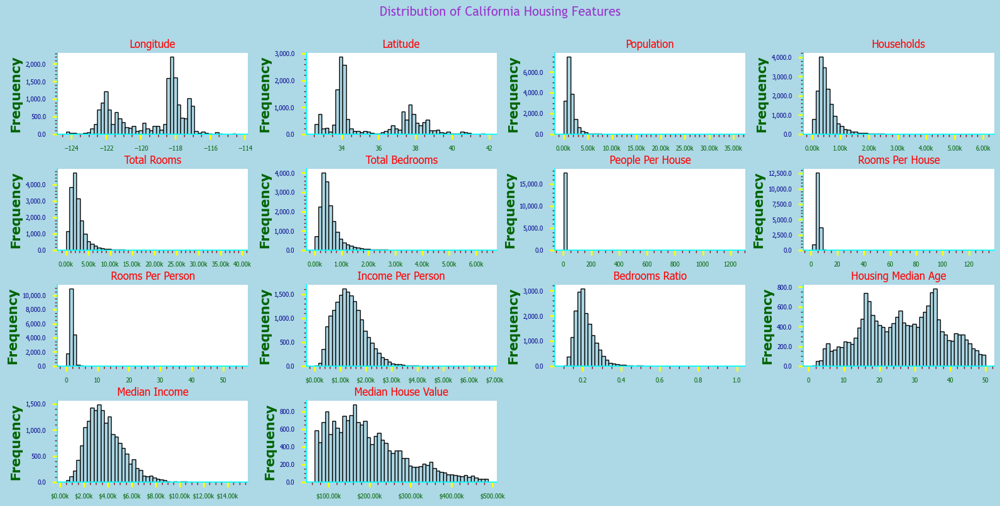

In [22]:
# Step 1: Plot histograms and capture the returned axes
axes = housing.hist(bins=50, figsize=(16, 8), color='lightblue', edgecolor='black')

# Step 2: Define $k formatter function
def dollar_k_formatter(x, pos):
    return f'${x/1000:,.2f}k'    # e.g. \$100k, \$200k

# Step 3: Define $k formatter function
def count_k_formatter(x, pos):
    return f'{x/1000:,.2f}k'    # e.g. \100k, \200k

# Step 4: Define specific columns and their formatters
currency_cols = ['median_income', 'median_house_value', 'income_per_person']   # $k format
# percent_cols  = [] # % format
non_currency_cols  = ['population', 'households', 'total_rooms', 'total_bedrooms'] # count k format

# Step 5: Add ylabel to each subplot
for hist in axes.flatten():
    col_name = hist.get_title()  # 👈 Get column name from subplot title
    if hist.has_data():
        hist.set_title(col_name.replace('_', ' ').title(), family='tahoma', color='red') # .upper(), .lower()
        # hist.set_xlabel(col_name.replace('_', ' ').title(), fontdict=x_label_font)
        hist.set_ylabel('Frequency', fontdict=y_label_font)
        hist.yaxis.set_major_formatter(StrMethodFormatter('{x:,}')) #
        hist.minorticks_on()
        hist.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
        hist.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
        hist.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
        hist.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
        # hist.autoscale()
        # hist.axis('equal')
        # hist.set_xlim(left=0)
        # hist.set_ylim(bottom=0)
        # hist.set_xscale('log')
        # hist.set_yscale('log')
        # hist.set_yscale('linear')  # Try removing log scale
    
    # Step 6: Apply specific x-axis formatters based on column name
    if col_name in currency_cols:
            # hist.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}'))   # $ format
            hist.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))  # $k format
    elif col_name in non_currency_cols:
            # hist.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))     # count format
            hist.xaxis.set_major_formatter(FuncFormatter(count_k_formatter))  # count k format

# Step 7: Plot subplot title
plt.suptitle("Distribution of California Housing Features", fontdict=title_font, x=0.5, y=1.00) # Overview of Housing Dataset Variables, Statistical Distribution of Housing Attributes

# Step 8: Adjust subplot params
plt.tight_layout(pad=1, h_pad=0.3, w_pad=0.3, rect=None)

#==#

# Step 9: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_02_Distribution_Of_CAL_Housing_Features_Final_Histplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 10: Display plot
plt.show()

##### `📊 Kdeplot - Distribution Of California Housing Key Features`.

In [23]:
# sns.kdeplot(data=housing, x='income_per_person', fill=True, hue='ocean_proximity')

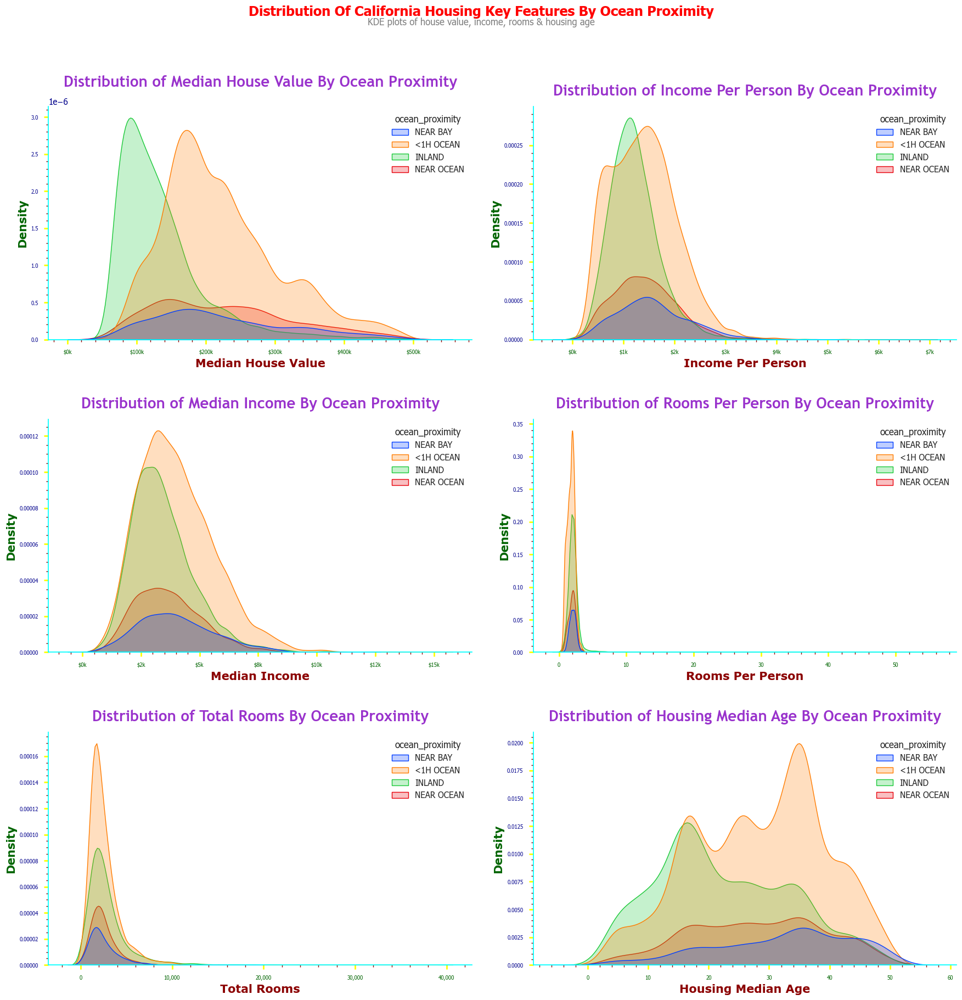

In [24]:
# ── Formatter Functions ───────────────────────────────────────────────────────
def dollar_k_formatter(x, pos):
    """e.g. \$100k, \$200k"""
    return f'${x/1000:,.0f}k'

def dollar_formatter(x, pos):
    """e.g. \$100, \$200"""
    return f'${x:,.0f}'

def count_k_formatter(x, pos):
    """e.g. 100k, 200k"""
    return f'{x/1000:,.0f}k'

def count_formatter(x, pos):
    """e.g. 100, 200"""
    return f'{x:,.0f}'

# ── Column Definitions ────────────────────────────────────────────────────────
columns        = ['median_house_value', 'income_per_person', 'median_income', 
                  'rooms_per_person', 'total_rooms', 'housing_median_age']
currency_cols  = ['median_income', 'median_house_value', 'income_per_person']
non_currency_cols = ['rooms_per_person', 'population', 'households', 
                     'total_rooms', 'total_bedrooms']


# ── Grid Layout ───────────────────────────────────────────────────────────────
ncols = 2
nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
                         figsize=(18, nrows * 6), # Dynamically scales figure height
                         facecolor='white', dpi=100)

# ── Main Title & Subtitle ─────────────────────────────────────────────────────
fig.suptitle(
    "Distribution Of California Housing Key Features By Ocean Proximity",
    fontsize=18, fontweight="bold", fontfamily="Tahoma", color="red",
    y=1.02,
)
fig.text(
    0.5, 1.00,
    "KDE plots of house value, income, rooms & housing age",
    fontsize=12, fontstyle="italic", fontfamily="Tahoma",
    color="grey", ha="center",
)
# ─────────────────────────────────────────────────────────────────────────────

axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# ── Main Loop ─────────────────────────────────────────────────────────────────
for idx, col in enumerate(columns):
    kde = axes[idx] # Each column gets its own subplot

    # ── Kde Plot ──────────────────────────────────────────────────────────────
    sns.kdeplot(data=housing, x=col, hue='ocean_proximity', fill=True, ax=kde)
    
    # ── Titles & Labels ───────────────────────────────────────────────────────
    kde.set_title(f'Distribution of {col.replace("_", " ").title()} By Ocean Proximity', # .upper(), .lower(), 'title()
                   fontdict=title_font, pad=15)
    kde.set_xlabel(col.replace('_', ' ').title(), fontdict=x_label_font) # .upper(), .lower(), 'title()
    kde.set_ylabel('Density', fontdict=y_label_font) # .upper(), .lower(), .title()
    
    # ── Tick Parameters ───────────────────────────────────────────────────────
    kde.minorticks_on()
    kde.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
    kde.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
    kde.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
    kde.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

    # ── X-Axis Formatter ──────────────────────────────────────────────────────
    if col in currency_cols:
        kde.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))
    elif col in non_currency_cols:
        kde.xaxis.set_major_formatter(FuncFormatter(count_formatter))

# ── Hide Unused Subplots ──────────────────────────────────────────────────────
for j in range(len(columns), len(axes)):
    axes[j].set_visible(False)

# ── Adjust subplot params ──────────────────────────────────────────────────────
plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots

# ── Save plot as png ──────────────────────────────────────────────────────
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_03_Distribution_Of_CAL_Housing_Key_Features_Kdeplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# ── Display plot as png ──────────────────────────────────────────────────────
plt.show()

##### `📊 Ecdfplot - Distribution Of California Housing Key Features`.

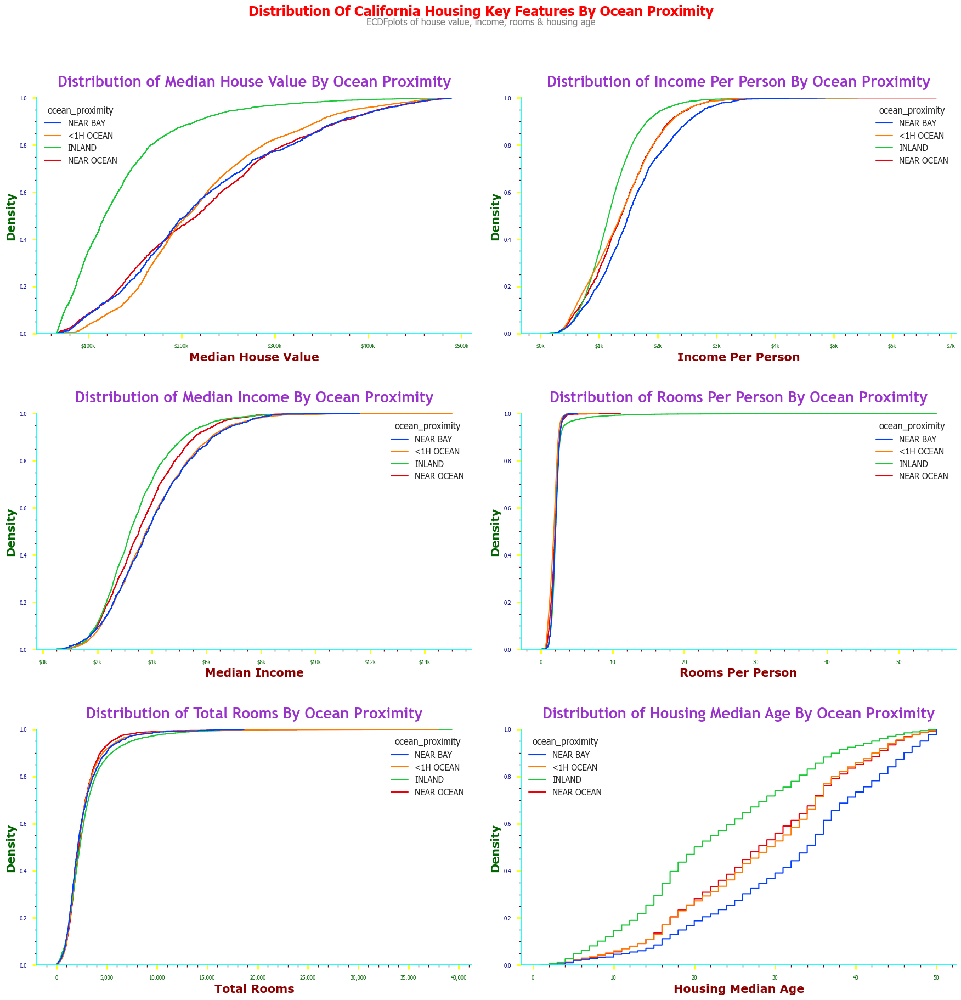

In [25]:
# ── Formatter Functions ───────────────────────────────────────────────────────
def dollar_k_formatter(x, pos):
    """e.g. \$100k, \$200k"""
    return f'${x/1000:,.0f}k'

def dollar_formatter(x, pos):
    """e.g. \$100, \$200"""
    return f'${x:,.0f}'

def count_k_formatter(x, pos):
    """e.g. 100k, 200k"""
    return f'{x/1000:,.0f}k'

def count_formatter(x, pos):
    """e.g. 100, 200"""
    return f'{x:,.0f}'

# ── Column Definitions ────────────────────────────────────────────────────────
columns        = ['median_house_value', 'income_per_person', 'median_income', 
                  'rooms_per_person', 'total_rooms', 'housing_median_age']
currency_cols  = ['median_income', 'median_house_value', 'income_per_person']
non_currency_cols = ['rooms_per_person', 'population', 'households', 
                     'total_rooms', 'total_bedrooms']


# ── Grid Layout ───────────────────────────────────────────────────────────────
ncols = 2
nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
                         figsize=(18, nrows * 6), # Dynamically scales figure height
                         facecolor='white', dpi=100)

# ── Main Title & Subtitle ─────────────────────────────────────────────────────
fig.suptitle(
    "Distribution Of California Housing Key Features By Ocean Proximity",
    fontsize=18, fontweight="bold", fontfamily="Tahoma", color="red",
    y=1.02,
)
fig.text(
    0.5, 1.00,
    "ECDFplots of house value, income, rooms & housing age",
    fontsize=12, fontstyle="italic", fontfamily="Tahoma",
    color="grey", ha="center",
)
# ─────────────────────────────────────────────────────────────────────────────

axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# ── Main Loop ─────────────────────────────────────────────────────────────────
for idx, col in enumerate(columns):
    ecdf = axes[idx] # Each column gets its own subplot

    # ── Kde Plot ──────────────────────────────────────────────────────────────
    sns.ecdfplot(data=housing, x=col, hue='ocean_proximity', ax=ecdf)
    
    # ── Titles & Labels ───────────────────────────────────────────────────────
    ecdf.set_title(f'Distribution of {col.replace("_", " ").title()} By Ocean Proximity', # .upper(), .lower(), 'title()
                   fontdict=title_font, pad=15)
    ecdf.set_xlabel(col.replace('_', ' ').title(), fontdict=x_label_font) # .upper(), .lower(), 'title()
    ecdf.set_ylabel('Density', fontdict=y_label_font) # .upper(), .lower(), .title()
    
    # ── Tick Parameters ───────────────────────────────────────────────────────
    ecdf.minorticks_on()
    ecdf.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
    ecdf.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
    ecdf.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
    ecdf.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

    # ── X-Axis Formatter ──────────────────────────────────────────────────────
    if col in currency_cols:
        ecdf.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))
    elif col in non_currency_cols:
        ecdf.xaxis.set_major_formatter(FuncFormatter(count_formatter))

# ── Hide Unused Subplots ──────────────────────────────────────────────────────
for j in range(len(columns), len(axes)):
    axes[j].set_visible(False)
    
# ── Adjust subplot params ──────────────────────────────────────────────────────
plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots

# ── Save plot as png ──────────────────────────────────────────────────────
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_04_Distribution_Of_CAL_Housing_Key_Features_Ecdfplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# ── Display plot as png ──────────────────────────────────────────────────────
plt.show()

##### `📊 Boxplot - Distribution Of California Housing Key Features`.

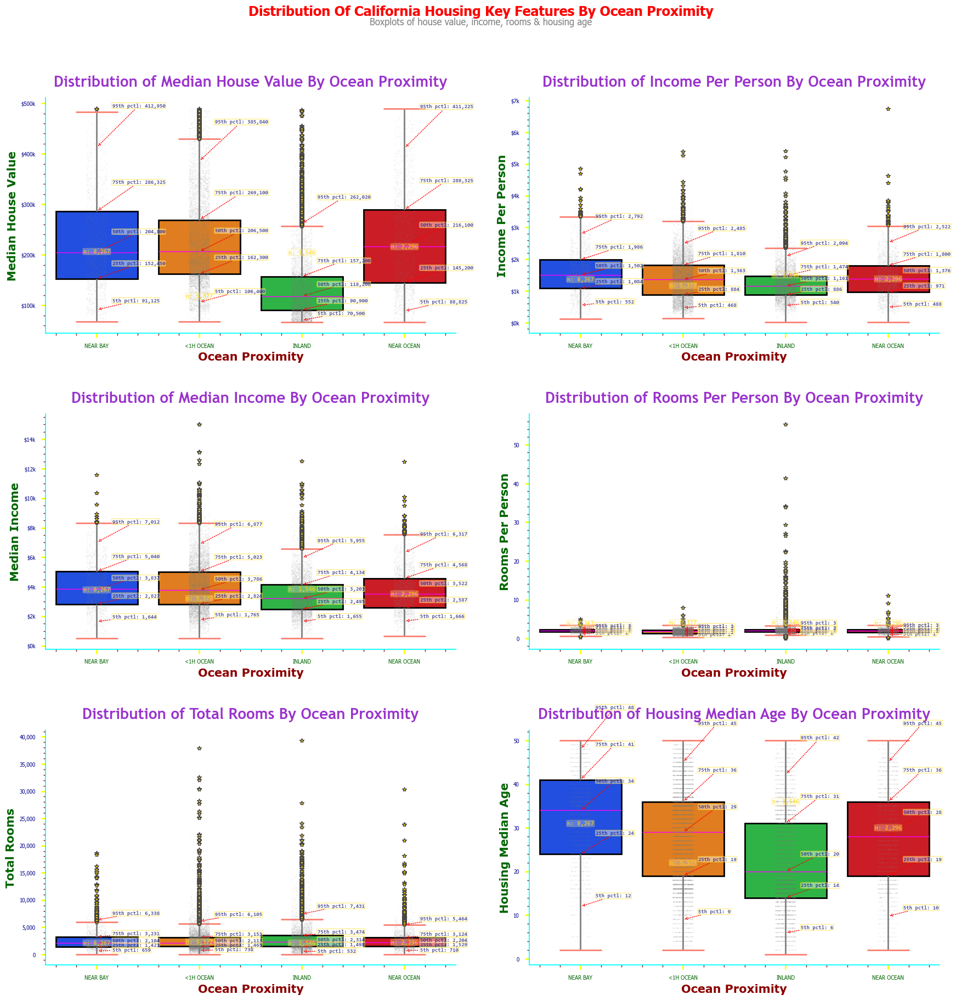

In [26]:
# ── Formatter Functions ───────────────────────────────────────────────────────
def dollar_k_formatter(x, pos):
    """e.g. \$100k, \$200k"""
    return f'${x/1000:,.0f}k'

def dollar_formatter(x, pos):
    """e.g. \$100, \$200"""
    return f'${x:,.0f}'

def count_k_formatter(x, pos):
    """e.g. 100k, 200k"""
    return f'{x/1000:,.0f}k'

def count_formatter(x, pos):
    """e.g. 100, 200"""
    return f'{x:,.0f}'

# ── Column Definitions ────────────────────────────────────────────────────────
columns        = ['median_house_value', 'income_per_person', 'median_income', 
                  'rooms_per_person', 'total_rooms', 'housing_median_age']
currency_cols  = ['median_income', 'median_house_value', 'income_per_person']
non_currency_cols = ['rooms_per_person', 'population', 'households', 
                     'total_rooms', 'total_bedrooms']

# ── Boxplot Style ─────────────────────────────────────────────────────────────
boxplot_style = {
    'flierprops'   : {'marker': '*', 'markerfacecolor': 'gold', 'markersize': 6},
    'capprops'     : {'color': 'salmon', 'linewidth': 2},
    'whiskerprops' : {'color': 'grey', 'linewidth': 2},
    'medianprops'  : {'color': 'magenta', 'linewidth': 1},
    'boxprops'     : {'edgecolor': 'black', 'linewidth': 2},
}
 
# ── Annotation Style Properties ───────────────────────────────────────────────
arrow_props = dict(
    arrowstyle       = "->",
    color            = 'red',
    linewidth        = 1,
    linestyle        = 'dotted',
    alpha            = 1,
    connectionstyle  = 'arc3,rad=0'
)
bbox_props = dict(
    boxstyle   = "round4",
    pad        = 0.1,
    facecolor  = 'white',
    alpha      = 0.45,
    edgecolor  = 'gold'
)
nobs_bbox = dict(
    boxstyle   = "round4",
    pad        = 0.1,
    facecolor  = 'white',
    alpha      = 0.25,
    edgecolor  = 'gold'
)

percentiles = [5, 25, 50, 75, 95]

# ── Grid Layout ───────────────────────────────────────────────────────────────
ncols = 2
nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
                         figsize=(18, nrows * 6), # Dynamically scales figure height
                         facecolor='white', dpi=100)

# ── Main Title & Subtitle ─────────────────────────────────────────────────────
fig.suptitle(
    "Distribution Of California Housing Key Features By Ocean Proximity",
    fontsize=18, fontweight="bold", fontfamily="Tahoma", color="red",
    y=1.02,
)
fig.text(
    0.5, 1.00,
    "Boxplots of house value, income, rooms & housing age",
    fontsize=12, fontstyle="italic", fontfamily="Tahoma",
    color="grey", ha="center",
)
# ─────────────────────────────────────────────────────────────────────────────

axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# ── Main Loop ─────────────────────────────────────────────────────────────────
for idx, col in enumerate(columns):
    bp = axes[idx] # Each column gets its own subplot

    # ── Box Plot ──────────────────────────────────────────────────────────────
    sns.boxplot(data=housing, x='ocean_proximity', y=col, 
                palette='bright', ax=bp, **boxplot_style)
    
    # ── Swarmplot (Beeswarm) ──────────────────────────────────────────────────────────────
    # sns.swarmplot(data=housing, x='ocean_proximity', y=col, hue='ocean_proximity', dodge=False,
    #             palette="dark", size=1, edgecolor="black", linewidth=1, marker='*', alpha=0.75, ax=bp)
    
    # ── Stripplot (Jitter) ──────────────────────────────────────────────────────────────
    sns.stripplot(data=housing, x='ocean_proximity', y=col, hue='ocean_proximity', jitter=True, dodge=False, 
                palette="dark", size=0.10, edgecolor="grey", linewidth=1, marker='.', alpha=0.75, ax=bp)

    # ── Titles & Labels ───────────────────────────────────────────────────────
    bp.set_title(f'Distribution of {col.replace("_", " ").title()} By Ocean Proximity', # .upper(), .lower(), 'title()
                   fontdict=title_font, pad=15)
    bp.set_xlabel('Ocean Proximity', fontdict=x_label_font)
    bp.set_ylabel(col.replace('_', ' ').title(), fontdict=y_label_font) # .upper(), .lower(), .title()

    # ── Tick Parameters ───────────────────────────────────────────────────────
    bp.minorticks_on()
    bp.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
    bp.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
    bp.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
    bp.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

    # ── Y-Axis Formatter ──────────────────────────────────────────────────────
    if col in currency_cols:
        bp.yaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))
    elif col in non_currency_cols:
        bp.yaxis.set_major_formatter(FuncFormatter(count_formatter))

    # ── Percentile Annotations ────────────────────────────────────────────────
    categories = housing['ocean_proximity'].unique()

    for i, category in enumerate(categories):
        subset = housing[housing['ocean_proximity'] == category][col]

        for percentile in percentiles:
            value = np.percentile(subset, percentile)

            bp.annotate(
                f'{percentile}th pctl: {value:,.0f}',
                xy       = (i, value),
                xytext   = (i + 0.15, value + 0.2 * value),
                ha       = 'left',
                va       = 'center',
                family   = 'consolas',
                fontstyle= 'normal',
                fontsize = 7,
                fontweight = 'bold',
                color    = 'midnightblue',
                alpha    = 0.75,
                rotation = None,
                arrowprops = arrow_props,
                bbox       = bbox_props
            )

    # ── Median & Observation Count Annotations ────────────────────────────────
    medians = housing.groupby('ocean_proximity')[col].median()
    nobs    = housing['ocean_proximity'].value_counts().sort_index()

    for op in medians.index:
        pos        = list(medians.index).index(op)
        median_val = medians[op]
        nobs_val   = nobs[op]

        bp.text(
            pos, median_val + 2,
            f"n: {nobs_val:,.0f}",
            ha         = 'center',
            va         = 'center',
            family     = 'consolas',
            fontstyle  = 'normal',
            fontsize   = 8,
            fontweight = 'bold',
            color      = 'gold',
            alpha      = 0.75,
            rotation   = None,
            bbox       = nobs_bbox
        )

# ── Hide Unused Subplots ──────────────────────────────────────────────────────
for j in range(len(columns), len(axes)):
    axes[j].set_visible(False)

# ── Adjust subplot params ──────────────────────────────────────────────────────
plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots

# ── Save plot as png ──────────────────────────────────────────────────────
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_05_Distribution_Of_CAL_Housing_Key_Features_Boxplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# ── Display plot as png ──────────────────────────────────────────────────────
plt.show()

In [27]:
# # ── Column Definitions ────────────────────────────────────────────────────────
# columns        = ['median_house_value', 'income_per_person', 'median_income', 
#                   'rooms_per_person', 'total_rooms', 'housing_median_age']

# # ── Grid Layout ───────────────────────────────────────────────────────────────
# ncols = 2
# nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

# fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
#                          figsize=(18, nrows * 6), # Dynamically scales figure height
#                          facecolor='white', dpi=100)

# axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# # ── Main Loop ─────────────────────────────────────────────────────────────────
# for idx, col in enumerate(columns):
#     bp = axes[idx] # Each column gets its own subplot
    
#     # ── Box Plot ──────────────────────────────────────────────────────────────
#     sns.boxplot(data=housing, x='ocean_proximity', y=col, palette='bright', ax=bp)

#     # ── Titles & Labels ───────────────────────────────────────────────────────
#     bp.set_title(f'Distribution of {(col.replace('_', ' ').title())} by Ocean Proximity',fontdict=title_font, pad=10) # .upper(), .lower(), 'title()
#     bp.set_xlabel('Ocean Proximity', fontdict=x_label_font)
#     bp.set_ylabel(col.replace('_', ' ').title(), fontdict=y_label_font) # .upper(), .lower(), .title()

#     # ── Tick Parameters ───────────────────────────────────────────────────────
#     bp.minorticks_on()
#     bp.tick_params(axis='x', labelsize=7.5, labelrotation=0)
#     bp.tick_params(axis='y', labelrotation=0)
#     bp.tick_params(axis='x', which='minor', bottom=True, length=3, width=1, color='darkred')
#     bp.tick_params(axis='y', which='minor', left=True,   length=3, width=1, color='darkred')

# # ── Hide Unused Subplots ──────────────────────────────────────────────────────
# for j in range(len(columns), len(axes)):
#     axes[j].set_visible(False)

# plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots    
# plt.show()

##### `📊 Stripplot - Distribution Of California Housing Key Features`.

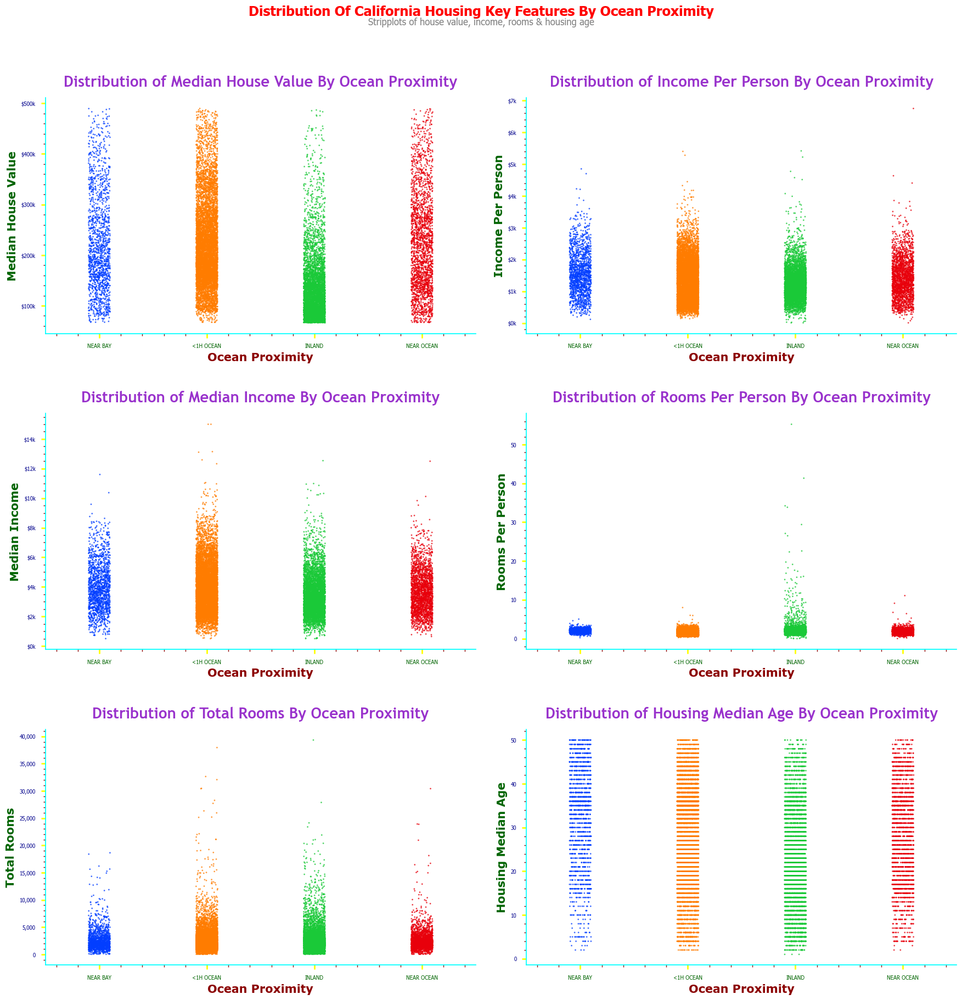

In [28]:
# ── Formatter Functions ───────────────────────────────────────────────────────
def dollar_k_formatter(x, pos):
    """e.g. \$100k, \$200k"""
    return f'${x/1000:,.0f}k'

def dollar_formatter(x, pos):
    """e.g. \$100, \$200"""
    return f'${x:,.0f}'

def count_k_formatter(x, pos):
    """e.g. 100k, 200k"""
    return f'{x/1000:,.0f}k'

def count_formatter(x, pos):
    """e.g. 100, 200"""
    return f'{x:,.0f}'

# ── Column Definitions ────────────────────────────────────────────────────────
columns        = ['median_house_value', 'income_per_person', 'median_income', 
                  'rooms_per_person', 'total_rooms', 'housing_median_age']
currency_cols  = ['median_income', 'median_house_value', 'income_per_person']
non_currency_cols = ['rooms_per_person', 'population', 'households', 
                     'total_rooms', 'total_bedrooms']

# # ── Boxplot Style ─────────────────────────────────────────────────────────────
# boxplot_style = {
#     'flierprops'   : {'marker': '*', 'markerfacecolor': 'gold', 'markersize': 6},
#     'capprops'     : {'color': 'salmon', 'linewidth': 2},
#     'whiskerprops' : {'color': 'grey', 'linewidth': 2},
#     'medianprops'  : {'color': 'magenta', 'linewidth': 1},
#     'boxprops'     : {'edgecolor': 'black', 'linewidth': 2},
# }
 
# # ── Annotation Style Properties ───────────────────────────────────────────────
# arrow_props = dict(
#     arrowstyle       = "->",
#     color            = 'red',
#     linewidth        = 1,
#     linestyle        = 'dotted',
#     alpha            = 1,
#     connectionstyle  = 'arc3,rad=0'
# )
# bbox_props = dict(
#     boxstyle   = "round4",
#     pad        = 0.1,
#     facecolor  = 'white',
#     alpha      = 0.45,
#     edgecolor  = 'gold'
# )
# nobs_bbox = dict(
#     boxstyle   = "round4",
#     pad        = 0.1,
#     facecolor  = 'white',
#     alpha      = 0.25,
#     edgecolor  = 'gold'
# )

# percentiles = [5, 25, 50, 75, 95]

# ── Grid Layout ───────────────────────────────────────────────────────────────
ncols = 2
nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
                         figsize=(18, nrows * 6), # Dynamically scales figure height
                         facecolor='white', dpi=100)

# ── Main Title & Subtitle ─────────────────────────────────────────────────────
fig.suptitle(
    "Distribution Of California Housing Key Features By Ocean Proximity",
    fontsize=18, fontweight="bold", fontfamily="Tahoma", color="red",
    y=1.02,
)
fig.text(
    0.5, 1.00,
    "Stripplots of house value, income, rooms & housing age",
    fontsize=12, fontstyle="italic", fontfamily="Tahoma",
    color="grey", ha="center",
)
# ─────────────────────────────────────────────────────────────────────────────

axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# ── Main Loop ─────────────────────────────────────────────────────────────────
for idx, col in enumerate(columns):
    stripplot = axes[idx] # Each column gets its own subplot

    # ── Stripplot ──────────────────────────────────────────────────────────────
    sns.stripplot(data=housing, x='ocean_proximity', y=col, hue='ocean_proximity', jitter=True, dodge=False, 
                  palette='bright', size=4, marker='.', alpha=0.75, ax=stripplot)

    # ── Titles & Labels ───────────────────────────────────────────────────────
    stripplot.set_title(f'Distribution of {col.replace("_", " ").title()} By Ocean Proximity', # .upper(), .lower(), 'title()
                   fontdict=title_font, pad=15)
    stripplot.set_xlabel('Ocean Proximity', fontdict=x_label_font)
    stripplot.set_ylabel(col.replace('_', ' ').title(), fontdict=y_label_font) # .upper(), .lower(), .title()

    # ── Tick Parameters ───────────────────────────────────────────────────────
    stripplot.minorticks_on()
    stripplot.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
    stripplot.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
    stripplot.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
    stripplot.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

    # ── Y-Axis Formatter ──────────────────────────────────────────────────────
    if col in currency_cols:
        stripplot.yaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))
    elif col in non_currency_cols:
        stripplot.yaxis.set_major_formatter(FuncFormatter(count_formatter))

    # # ── Percentile Annotations ────────────────────────────────────────────────
    # categories = housing['ocean_proximity'].unique()

    # for i, category in enumerate(categories):
    #     subset = housing[housing['ocean_proximity'] == category][col]

    #     for percentile in percentiles:
    #         value = np.percentile(subset, percentile)

    #         stripplot.annotate(
    #             f'{percentile}th pctl: {value:,.0f}',
    #             xy       = (i, value),
    #             xytext   = (i + 0.15, value + 0.2 * value),
    #             ha       = 'left',
    #             va       = 'center',
    #             family   = 'consolas',
    #             fontstyle= 'normal',
    #             fontsize = 7,
    #             fontweight = 'bold',
    #             color    = 'midnightblue',
    #             alpha    = 0.75,
    #             rotation = None,
    #             arrowprops = arrow_props,
    #             bbox       = bbox_props
    #         )

    # # ── Median & Observation Count Annotations ────────────────────────────────
    # medians = housing.groupby('ocean_proximity')[col].median()
    # nobs    = housing['ocean_proximity'].value_counts().sort_index()

    # for op in medians.index:
    #     pos        = list(medians.index).index(op)
    #     median_val = medians[op]
    #     nobs_val   = nobs[op]

    #     stripplot.text(
    #         pos, median_val + 2,
    #         f"n: {nobs_val:,.0f}",
    #         ha         = 'center',
    #         va         = 'center',
    #         family     = 'consolas',
    #         fontstyle  = 'normal',
    #         fontsize   = 8,
    #         fontweight = 'bold',
    #         color      = 'gold',
    #         alpha      = 0.75,
    #         rotation   = None,
    #         bbox       = nobs_bbox
    #     )

# ── Hide Unused Subplots ──────────────────────────────────────────────────────
for j in range(len(columns), len(axes)):
    axes[j].set_visible(False)

# ── Adjust subplot params ──────────────────────────────────────────────────────
plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots

# ── Save plot as png ──────────────────────────────────────────────────────
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_06_Distribution_Of_CAL_Housing_Key_Features_Stripplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# ── Display plot as png ──────────────────────────────────────────────────────
plt.show()

##### `📊 Barplot - Ocean Proximity Statistics`.

**`Calculate Statistics`**.

In [29]:
ln = (housing["ocean_proximity"].value_counts().to_frame("count").reset_index()\
.assign(proportion=lambda x: x["count"] / x["count"].sum())
)
ln

# # Styled - Not for plotting
# ln = (housing["ocean_proximity"].value_counts().to_frame("count").reset_index()\
# .assign(proportion=lambda x: x["count"] / x["count"].sum())\
# .style.format({"count": "{:,.0f}","proportion": "{:.2%}"})
# )
# ln

# opp = housing_full["ocean_proximity"].value_counts(normalize=True).to_frame().reset_index().style.format({"proportion": "{:,.2%}"})
# opp

# housing_full["ocean_proximity"].value_counts().reset_index()

,ocean_proximity,count,proportion
0,<1H OCEAN,8267,0.472778
1,INLAND,5377,0.307503
2,NEAR OCEAN,2296,0.131305
3,NEAR BAY,1546,0.088414


**`Barplot - Ocean Proximity Statistics`**.

'<1H OCEAN' - 1st, 8,267, 47.28%
'INLAND' - 2nd, 5,377, 30.75%
'NEAR OCEAN' - 3rd, 2,296, 13.13%


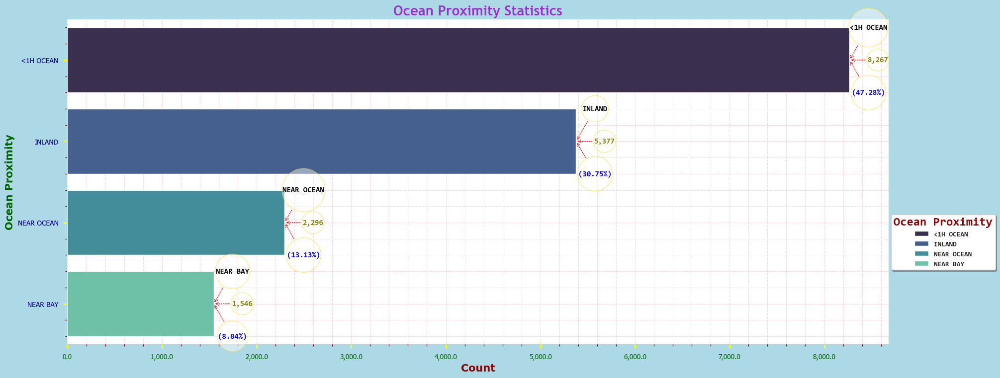

In [30]:
# Barplot - Ocean Proximity Statistics.

# Step 1: Prepare plot
fig, bplot = plt.subplots(ncols=1,nrows=1,figsize=(5,5),layout='constrained',facecolor='lightblue',dpi=100)

#==#


# Step 2: Plot 'count  ' vs 'category'
sns.barplot(data=ln,x=ln['count'],y=ln['ocean_proximity'],
hue=ln['ocean_proximity'],order=ln['ocean_proximity'],hue_order=ln['ocean_proximity'], 
estimator='mean',errorbar=('ci', 95),n_boot=1000,seed=None,units=None,weights=None,orient=None,color=None, 
palette='mako',saturation=0.75,fill=True,hue_norm=None,width=0.8,dodge=None,gap=0,log_scale=None,native_scale=False, 
formatter=None,legend='full',capsize=0,err_kws=None,ci='deprecated',errcolor=None,ax=bplot) # palette: mako, viridis, rocket, plasma, inferno, flare_r, cubehelix display big data with more visual variety

#==#

# Step 3: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
bplot.figure.set_size_inches(20,7.5)
bplot.set_title('Ocean Proximity Statistics',loc='center',fontdict=title_font)
bplot.set_xlabel('Count',loc='center',fontdict=x_label_font)
bplot.set_ylabel('Ocean Proximity',loc='center',fontdict=y_label_font)
bplot.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
# bplot.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0%}'))

bplot.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
bplot.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
bplot.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
bplot.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

bplot.minorticks_on()

bplot.spines[['top','right']].set_visible(False)
bplot.spines[['bottom','left']].set_visible(False)

bplot.set_facecolor('white')

bplot.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# bplot.autoscale()
# bplot.axis('equal')
# bplot.set_xlim(left=0)
# bplot.set_ylim(bottom=0)
# bplot.set_ylim(0,355000)
# bplot.set_xscale('log')
# bplot.set_yscale('log')
# bplot.set_yscale('linear')  # Try removing log scale

title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='consolas',style='normal',weight='bold',size='small')
legend = bplot.legend(loc='best',bbox_to_anchor=(1.13, 0.4),borderaxespad=0,title='Ocean Proximity',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("darkred")

#==#

# Step 4: Annotate ocean_proximity, count & percentage share in arrow & bbox circle format - Category, Count & %

# Annotation format properties
arrow = dict(arrowstyle="->",color='red',mutation_aspect=1,linewidth=1,linestyle='dotted',capstyle='round',joinstyle='round',alpha=1,connectionstyle='arc3,rad=0')
box=dict(boxstyle="circle",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold')

# Unique item categories
items = ln['ocean_proximity'].unique().tolist()

# Annotate ocean_proximity in arrow & bbox circle format - Category
for index, row in ln.iloc[:].iterrows(): # Use [:-1] to skip last row if needed
    item = row['ocean_proximity'] # Extract item name
    if item in items:
        y_coord = items.index(item) # map item to y coordinate
        bplot.annotate(text=f"{item}",
        xy=(row['count'], y_coord), xytext=(row['count'] + 200, y_coord - 0.40), # (row['count'] + > 1 for right, < 1 for left), (y_coord + > 1 for down, < 1 for up) 
        color='black',
        ha='center', va='center', family='consolas', fontstyle='normal',
        fontsize=11, fontweight='bold', rotation=0,
        bbox=box, arrowprops=arrow)

# Annotate count in arrow & bbox circle format - Count
for index, row in ln.iloc[:].iterrows(): # Use [:-1] to exclude last row if needed
    if not pd.isna(row['count']): # Only annotate if count is not NaN
        item = row['ocean_proximity'] # Extract item name
        if item in items:
            y_coord = items.index(item) # map item to y coordinate
            bplot.annotate(text=f'{row['count']:,.0f}', 
            xy=(row['count'], y_coord), xytext=(row['count'] + 300 , y_coord + 0.0), # (row['count'] + > 1 for right, < 1 for left), (y_coord + > 1 for down, < 1 for up) 
            color='olive' if row['count'] >= 0 else 'red',
            ha='center', va='center',
            family='consolas', fontstyle='normal',
            fontsize=11, fontweight='bold', rotation=0,
            bbox=box, arrowprops=arrow)

# Annotate proportion in arrow & bbox circle format - %
for index, row in ln.iloc[:].iterrows(): # [:-1] - Exclude last row ('Total')
    if not pd.isna(row['proportion']): # Only annotate if pct_total_sales is not NaN
        item = row['ocean_proximity'] # Extract item name
        if item in items:
            y_coord = items.index(item) # map item to y coordinate
            bplot.annotate(text=f'({row['proportion']:,.2%})', 
            xy=(row['count'], y_coord), xytext=(row['count'] + 200 , y_coord + 0.40), # (row['count'] + > 1 for right, < 1 for left), (y_coord + > 1 for down, < 1 for up) 
            color='blue' if row['proportion']>=0 else 'red',
            ha='center', va='center', family='consolas', fontstyle='normal', 
            fontsize=11, fontweight='bold',rotation=0,
            bbox=box, arrowprops=arrow)

#==#

# Step 5: Annotate rank, count & category of top sales in arrow & bbox round format - Rank, Count & Category

# Remove rows where 'ocean_proximity' or 'count' is NaN
df_clean = ln.dropna(subset=['ocean_proximity', 'count', 'proportion'])

# Sort by count in descending order and select top 3
top_counts = df_clean.sort_values(by='count', ascending=False).head(3)

# Display the top 3 highest counts
for i, row in top_counts.iterrows():
    rank = ['1st', '2nd', '3rd'][top_counts.index.get_loc(i)]
    print(f"'{row['ocean_proximity']}' - {rank}, {row['count']:,.0f}, {row['proportion']:,.2%}")

# Build the annotation string by joining multiple lines with newline characters
annotation_text = '\n'.join([
    f"{['1st', '2nd', '3rd'][i]} | {row['ocean_proximity']} | {row['count']:,.0f} | {row['proportion']:,.2%}" # select ranking label, count & category
    for i, row in top_counts.reset_index(drop=True).iterrows()]) # Reset the index to 0, 1, 2 so i aligns with '1st', '2nd', '3rd'.

# Annotate text to axes in arrow format
bplot.annotate(annotation_text,xy=(8000, 4),xytext=(8000, 4),
            ha='center',va='bottom', 
            family='consolas',fontstyle='italic',fontsize=14,fontweight='bold', 
            color='brown',rotation=0,
            bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'),arrowprops=dict(facecolor='red',shrink=0.05))  

#==#

# Step 6: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_07_Ocean_Proximity_Statistics_Barplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 7: Display plot
plt.show()

#### `📈📉 Bivariate Analysis`.

- **`The analysis of two variables, for the purpose of determining the empirical relationship between them`**. 
- **`It can be helpful in testing simple hypotheses of association`**.
- --

**`👁️⃤ Correlation Matix` - `Correlation Analysis Of Key Metrics`**.
- --
- **`We use a correlation matrix to`**:
  - **`Identify patterns and trends in your data`**.
  - **`Understand the relationships between variables`**.
  - **`Test hypotheses about the relationships between variables`**.
  - **`Build predictive models`**.
- --

**`Step 1`: Display dataframe statistics to identify our `target variable`**.

In [31]:
housing.describe()

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value
count,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000,17486.000000
mean,-119.468584,35.522203,1488.418277,517.083495,2721.463971,555.034428,3.102326,5.413937,1.951797,1357.644599,0.212732,26.815567,3789.650606,196250.834954
std,1.982896,2.128515,1177.738147,395.446199,2259.724625,433.754835,11.138634,2.390350,1.143317,612.549741,0.055756,11.450667,1543.864477,91528.751420
min,-124.300000,32.540000,3.000000,2.000000,2.000000,2.000000,0.692308,0.846154,0.002547,8.224987,0.100000,1.000000,499.900000,66200.000000
25%,-121.607500,33.910000,820.000000,287.000000,1477.000000,305.000000,2.463209,4.441299,1.516712,908.022281,0.175978,17.000000,2653.800000,125700.000000
50%,-118.410000,34.190000,1217.000000,423.000000,2190.000000,444.000000,2.847587,5.245136,1.919506,1293.730828,0.202423,27.000000,3564.500000,177350.000000
75%,-117.960000,37.660000,1804.000000,624.000000,3247.000000,665.000000,3.297798,6.022719,2.248139,1726.250273,0.238422,36.000000,4687.500000,247800.000000
max,-114.310000,41.950000,35682.000000,6082.000000,39320.000000,6445.000000,1243.333333,132.533333,55.222222,6750.000000,1.000000,50.000000,15000.100000,489800.000000


**`Step 2`: Then compare all key metrics to the target variable - `median_house_value`**.

In [32]:
corr_matrix = housing.corr(numeric_only=True)
corr_matrix["median_house_value"].sort_values(ascending=False) # Sorted from highest to lowest.
# corr_matrix # Unsorted.

median_house_value    1.000000
income_per_person     0.678724
median_income         0.633507
rooms_per_person      0.142786
total_rooms           0.131859
rooms_per_house       0.104409
households            0.078368
total_bedrooms        0.058790
housing_median_age    0.027232
population            0.005813
people_per_house     -0.019845
longitude            -0.037015
latitude             -0.137564
bedrooms_ratio       -0.216277
Name: median_house_value, dtype: float64

**`📊 Key Insights`**:
- --
- **`Strong Positive Correlations`**
  - **income_per_person `(0.6850)` is by far the `strongest predictor` of house value followed by **median_income `(0.6362)`** — `higher income areas` tend to have `significantly more expensive homes`. This is your most important feature**.
- --
- **`Weak Positive Correlations`**
  - **total_rooms `(0.1423)` — `More rooms` suggests `marginally higher value`**.
  - **rooms_per_person `(0.1380)` - `More rooms per person ` suggests `less overcrowding`, marginally linked to `higher value`**.
  - **rooms_per_house `(0.0973)`, households `(0.0804)`, total_bedrooms `(0.0579)`, housing_median_age `(0.0386)` — `Negligible positive relationships`**.
  - **population `(-0.0018)`, people_per_house `(-0.0198)`**.
- --
- **`Negative Correlations`**
  - **population `(-0.0018)` — `Negligible negative relationship`, essentially `no linear correlation` with house prices**.
  - **people_per_house `(-0.0198)` — `More people per house` suggests `overcrowding`, weakly linked to `lower values`**.
  - **longitude `(-0.0386)` - `Moving east` correlates with `slightly lower prices`**.
  - **latitude `(-0.1372)` — `Moving north` correlates with `lower prices` (likely reflects California geography)**.
  - **longitude, population, bedroom_ratio — `Very weak negative relationships`**.
  - **bedrooms_ratio `(-0.2150)` — `Higher bedroom ratio` correlates with `lower value`**.
    - **(`more bedrooms relative to rooms` = `smaller, cheaper properties`)**.
---
- **`🎯 Conclusion`**
  - **income_per_person `dominates` — `Our anchor feature`**.
  - **population, people_per_house and longitude have `correlations close to 0`, meaning they have `negligible negative relationships` with house prices**.
  - **latitude `(-0.1372)` is the `2nd strongest negative predictor` in the dataset**.
  - **bedrooms_ratio `(-0.2150)` is the `1st strongest negative predictor` in the dataset**. 
  - **Geographic features `(latitude/longitude)` show `weak linear correlations` individually. However, `combined together` they represent `location` which is a `powerful predictor` of house prices**.

##### `📊 Pairplot - Exploratory Pairwise Analysis - Median House Value, Median Income & Income Per Person by Ocean Proximity`.

- `Scatter matrix of median_house_value, median_income & income_per_person by Ocean Proximity`.

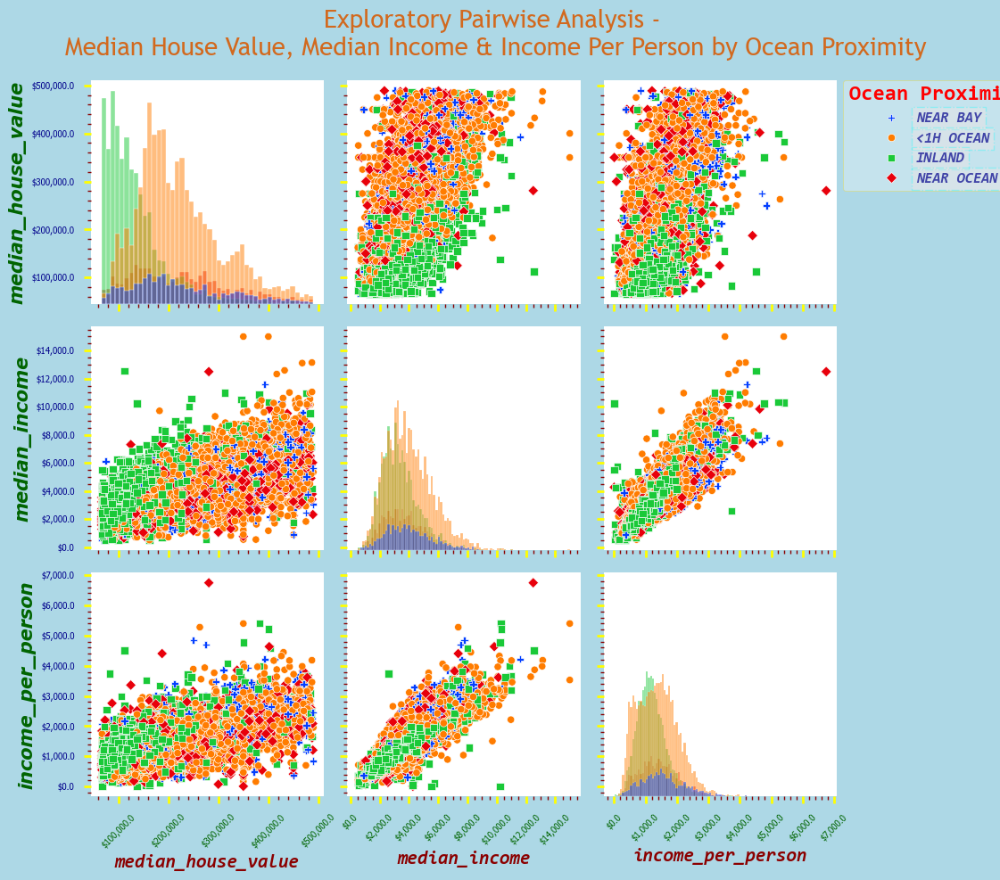

In [33]:
# Pairplot - Exploratory Pairwise Analysis - Median House Value, Median Income & Income Per Person by Ocean Proximity

# Define numerical values
x_var = ['median_house_value', 'median_income', 'income_per_person']
y_var = ['median_house_value', 'median_income', 'income_per_person']

# Define makers
markers = ["P", "o", "s", "D"]

# Plot pairplot
g = sns.pairplot(data = housing, x_vars=x_var, y_vars=y_var, hue='ocean_proximity', hue_order=None, palette='bright',
kind='scatter', diag_kind='hist', markers=markers, height=2.5, aspect=1, corner=False, dropna=False, plot_kws=None, diag_kws=None, grid_kws=None, size=None)
# diag_kind='auto', 'hist'

# Customize figure size
g.figure.set_size_inches(12, 10)

# Customize suplot positioning & spacing
g.figure.subplots_adjust(left=None,bottom=None,right=None,top=0.9,wspace=0.1,hspace=0.1)

# # Customize figure layout
# g.figure.tight_layout(pad=5,h_pad=1.5,w_pad=1.5,rect=(0, 0, 1, 1)) # ('left','bottom','right','top'))

# Customize suptitle
suptitle_font = {'family':'trebuchet ms','color':'chocolate','style':'normal','weight':'bold'}
g.figure.suptitle("Exploratory Pairwise Analysis - "+"\nMedian House Value, Median Income & Income Per Person by Ocean Proximity",size=20,fontdict=suptitle_font)

#==#

# Loop through axes in the pairplot to apply additional settings
for pplot in g.axes.flatten():
    if pplot is not None:  # Check if ax exists (to avoid errors in corner plots)
        
        # Turn on minor ticks
        pplot.minorticks_on()
        
        # Apply the formatter to both axes
        pplot.xaxis.set_major_formatter(StrMethodFormatter('${x:,}'))
        pplot.yaxis.set_major_formatter(StrMethodFormatter('${x:,}'))

        # Set axis label fonts (xlabel)
        pplot.xaxis.label.set_family('consolas')  # Set x-axis label font family
        pplot.xaxis.label.set_style('italic')  # Set x-axis label font style
        pplot.xaxis.label.set_weight('bold')  # Set x-axis label font weight
        pplot.xaxis.label.set_size(15)  # Set x-axis label font size
        pplot.xaxis.label.set_color('darkred')  # Set x-axis label color
        
         # Set axis label fonts (ylabel)
        pplot.yaxis.label.set_family('verdana')  # Set y-axis label font family
        pplot.yaxis.label.set_style('italic')  # Set y-axis label font style
        pplot.yaxis.label.set_weight('bold')  # Set y-axis label font weight
        pplot.yaxis.label.set_size(15)  # Set y-axis label font size
        pplot.yaxis.label.set_color('darkgreen')  # Set y-axis label color
       
        # Major tick settings
        # pplot.tick_params(axis='both',length=13,width=5,colors='chocolate',direction='out',
        # labelfontfamily='tahoma',labelsize='medium',labelcolor='darkblue',labelrotation=None)#grid_linewidth=1)
        pplot.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=45)
        pplot.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
        
        # Minor tick settings
        pplot.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
        pplot.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

        # Hide spines
        pplot.spines['top'].set_visible(False)
        pplot.spines['right'].set_visible(False)
        pplot.spines['bottom'].set_visible(False)
        pplot.spines['left'].set_visible(False)
        
        # Grid settings
        pplot.grid(which='minor',linestyle='dotted',color='white',linewidth=0.5)
        # pplot.autoscale()
        # pplot.axis('equal')
        # pplot.set_xlim(left=0)
        # pplot.set_ylim(bottom=0)
        # pplot.set_xscale('log')
        # pplot.set_yscale('log')

#==#

# Customize the legend
legend = g.legend # Assign variable to legend
legend.set_bbox_to_anchor((0.97, 0.835)) # Set location of bbox_to_anchor [subplots adjust]
# legend.set_bbox_to_anchor((1.06, 0.765)) # Set location of bbox_to_anchor [tight_layout]
# legend.set_bbox_to_anchor((1.06, 0.765)) # Set location of bbox_to_anchor [tight_layout & subplots adjust]
legend.set_title("Ocean Proximity",prop=dict(family='consolas',style='normal',weight='bold',size='x-large')) # Set title & properties
legend.get_title().set_color('red') # Change the color of the legend title separately
legend.get_title().set_alpha(1) # Change alpha of the title appearance
legend.set_frame_on(True) # Set frame
legend.get_frame().set_color('white')  # Set frame color
legend.get_frame().set_edgecolor('gold') # Set frame edgecolor
legend.get_frame().set_linewidth(0.7) # Set frame width
legend.get_frame().set_alpha(0.3)  # Makes the frame opaque (0-1)

# Apply legend properties for the labels
for text in legend.get_texts():
    text.set_fontfamily('consolas') # Set text font family
    text.set_fontstyle('italic') # Set text font style
    text.set_fontweight('bold') # Set text font weight
    text.set_fontsize('medium') # Set text font size
    text.set_color('darkblue') # Set text color
    text.set_alpha(0.7) # Set text alpha
    text.set_bbox(dict(boxstyle='square',fc='mistyrose',ec='cyan',ls='dashdot',lw=1,alpha=0.3)) # Set bbox properties

# Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_08_MHV_MI_And_IPP_By_Ocean_Proximity_Pairplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# Display plot as png
plt.show()

##### `📊 Scatterplot - Feature Correlation Analysis Against Median House Value`.

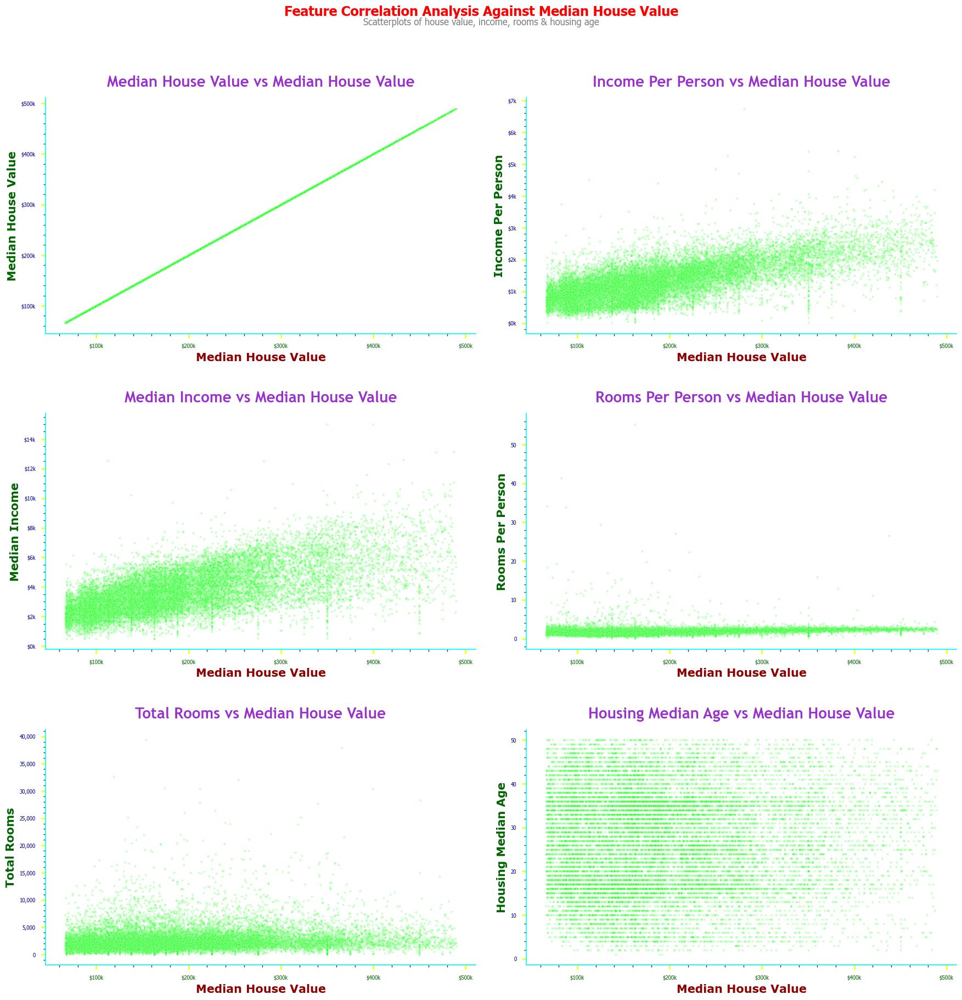

In [34]:
# ── Formatter Functions ───────────────────────────────────────────────────────
def dollar_k_formatter(x, pos):
    """e.g. \$100k, \$200k"""
    return f'${x/1000:,.0f}k'

def dollar_formatter(x, pos):
    """e.g. \$100, \$200"""
    return f'${x:,.0f}'

def count_k_formatter(x, pos):
    """e.g. 100k, 200k"""
    return f'{x/1000:,.0f}k'

def count_formatter(x, pos):
    """e.g. 100, 200"""
    return f'{x:,.0f}'

# ── Column Definitions ────────────────────────────────────────────────────────
columns        = ['median_house_value', 'income_per_person', 'median_income', 
                  'rooms_per_person', 'total_rooms', 'housing_median_age']
currency_cols  = ['median_income', 'median_house_value', 'income_per_person']
non_currency_cols = ['rooms_per_person', 'population', 'households', 
                     'total_rooms', 'total_bedrooms']

# # ── Boxplot Style ─────────────────────────────────────────────────────────────
# boxplot_style = {
#     'flierprops'   : {'marker': '*', 'markerfacecolor': 'gold', 'markersize': 6},
#     'capprops'     : {'color': 'salmon', 'linewidth': 2},
#     'whiskerprops' : {'color': 'grey', 'linewidth': 2},
#     'medianprops'  : {'color': 'magenta', 'linewidth': 1},
#     'boxprops'     : {'edgecolor': 'black', 'linewidth': 2},
# }
 
# # ── Annotation Style Properties ───────────────────────────────────────────────
# arrow_props = dict(
#     arrowstyle       = "->",
#     color            = 'red',
#     linewidth        = 1,
#     linestyle        = 'dotted',
#     alpha            = 1,
#     connectionstyle  = 'arc3,rad=0'
# )
# bbox_props = dict(
#     boxstyle   = "round4",
#     pad        = 0.1,
#     facecolor  = 'white',
#     alpha      = 0.45,
#     edgecolor  = 'gold'
# )
# nobs_bbox = dict(
#     boxstyle   = "round4",
#     pad        = 0.1,
#     facecolor  = 'white',
#     alpha      = 0.25,
#     edgecolor  = 'gold'
# )

# percentiles = [5, 25, 50, 75, 95]

# ── Grid Layout ───────────────────────────────────────────────────────────────
ncols = 2
nrows = 3   # 3 rows x 2 cols = 6 subplots (one per column)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, 
                         figsize=(18, nrows * 6), # Dynamically scales figure height
                         facecolor='white', dpi=100)

# ── Main Title & Subtitle ─────────────────────────────────────────────────────
fig.suptitle(
    "Feature Correlation Analysis Against Median House Value",
    fontsize=18, fontweight="bold", fontfamily="Tahoma", color="red",
    y=1.02,
)
fig.text(
    0.5, 1.00,
    "Scatterplots of house value, income, rooms & housing age",
    fontsize=12, fontstyle="italic", fontfamily="Tahoma",
    color="grey", ha="center",
)
# ─────────────────────────────────────────────────────────────────────────────

axes = axes.flatten()  # Flatten 2D array → 1D for easy iteration

# ── Main Loop ─────────────────────────────────────────────────────────────────
for idx, col in enumerate(columns):
    scatterplot = axes[idx] # Each column gets its own subplot

    # ── Box Plot ──────────────────────────────────────────────────────────────
    sns.scatterplot(data=housing, x=housing['median_house_value'], y=col,
                    marker='.', sizes=(1, 100), color='lime', ec='white', alpha=0.2, ax=scatterplot)

    # ── Titles & Labels ───────────────────────────────────────────────────────
    scatterplot.set_title(f'{col.replace("_", " ").title()} vs Median House Value', # .upper(), .lower(), 'title()
                   fontdict=title_font, pad=15)
    scatterplot.set_xlabel('Median House Value', fontdict=x_label_font)
    scatterplot.set_ylabel(col.replace('_', ' ').title(), fontdict=y_label_font) # .upper(), .lower(), .title()

    # ── Tick Parameters ───────────────────────────────────────────────────────
    scatterplot.minorticks_on()
    scatterplot.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
    scatterplot.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
    scatterplot.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
    scatterplot.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

    # ── X-Axis Formatter ──────────────────────────────────────────────────────
    # X is always 'median_house_value' → always use dollar_k_formatter
    scatterplot.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))

    # ── Y-Axis Formatter ──────────────────────────────────────────────────────
    if col in currency_cols:
        scatterplot.yaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))
    elif col in non_currency_cols:
        scatterplot.yaxis.set_major_formatter(FuncFormatter(count_formatter))

    # # ── Percentile Annotations ────────────────────────────────────────────────
    # categories = housing['ocean_proximity'].unique()

    # for i, category in enumerate(categories):
    #     subset = housing[housing['ocean_proximity'] == category][col]

    #     for percentile in percentiles:
    #         value = np.percentile(subset, percentile)

    #         scatterplot.annotate(
    #             f'{percentile}th pctl: {value:,.0f}',
    #             xy       = (i, value),
    #             xytext   = (i + 0.15, value + 0.2 * value),
    #             ha       = 'left',
    #             va       = 'center',
    #             family   = 'consolas',
    #             fontstyle= 'normal',
    #             fontsize = 7,
    #             fontweight = 'bold',
    #             color    = 'midnightblue',
    #             alpha    = 0.75,
    #             rotation = None,
    #             arrowprops = arrow_props,
    #             bbox       = bbox_props
    #         )

    # # ── Median & Observation Count Annotations ────────────────────────────────
    # medians = housing.groupby('ocean_proximity')[col].median()
    # nobs    = housing['ocean_proximity'].value_counts().sort_index()

    # for op in medians.index:
    #     pos        = list(medians.index).index(op)
    #     median_val = medians[op]
    #     nobs_val   = nobs[op]

    #     scatterplot.text(
    #         pos, median_val + 2,
    #         f"n: {nobs_val:,.0f}",
    #         ha         = 'center',
    #         va         = 'center',
    #         family     = 'consolas',
    #         fontstyle  = 'normal',
    #         fontsize   = 8,
    #         fontweight = 'bold',
    #         color      = 'gold',
    #         alpha      = 0.75,
    #         rotation   = None,
    #         bbox       = nobs_bbox
    #     )

# ── Hide Unused Subplots ──────────────────────────────────────────────────────
for j in range(len(columns), len(axes)):
    axes[j].set_visible(False)

# ── Adjust subplot params ──────────────────────────────────────────────────────
plt.tight_layout(pad=2, h_pad=3, w_pad=2) # Adds breathing room between subplots

# ── Save plot as png ──────────────────────────────────────────────────────
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_09_Feature_Correlation_Analysis_Against_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

# ── Display plot as png ──────────────────────────────────────────────────────
plt.show()

#### `🤹‍♂️ Multivariate Analysis`.

`Examining three or more variables to understand complex, simultaneous relationships`.

**`📊 1. Heatmap` - `Correlation analysis of key metrics`**.

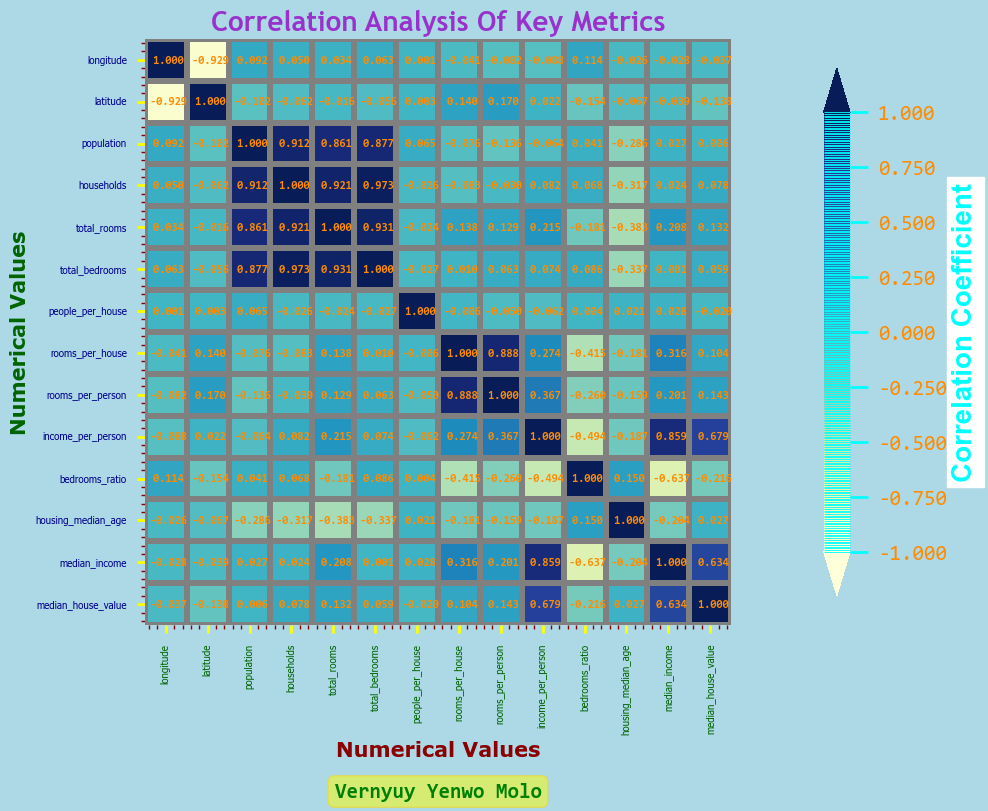

In [35]:
# Heatmap - Correlation analysis of key metrics.

# Correlation Matrix of Numerical Features
correlation_matrix = housing.select_dtypes(include='number').corr() # housing.corr(numeric_only=True)
correlation_matrix

# Figure properties
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(21,8),layout='constrained',facecolor='lightblue',dpi=100)

#==#

# Format colobar value
# fmt = lambda x,pos: ' £{:,.0f}'.format(x) # £
# fmt = lambda x,pos: ' ${:,.0f}'.format(x) # $
fmt = lambda x,pos: '{:,.3f}'.format(x) # Count

#==#

# Keyword arguements for plot appearance
annot_kws = dict(family='consolas',size=8,style='normal',weight='bold',color='darkorange',alpha=1,rotation=0,ha='center',va='center',) # backgroundcolor='pink')
cbar_kws = {"orientation":"vertical","shrink":0.9,'extend':'both','extendfrac':0.1,"drawedges":True,'label':'Correlation Coefficient','format':fmt,}
kwargs = {'linewidths':4,'linecolor':'gray','linestyle':'dashed','alpha':1,}#'rasterized':True,'edgecolor':'pink',"capstyle":'projecting','linewidth':2}

#==#

# Create a mask using numpy's triu function
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

#==#

# Create heatmap of the correlation matrix. ['copper_r',summer','Blues','Oranges,'pink_r','YlGn','YlOrBr','YlGnBu','hot_r','GnBu_r']
ax = sns.heatmap(correlation_matrix,vmin=-1,vmax=1,cmap='YlGnBu',center=None,robust=True,annot=True,fmt='.3f',annot_kws=annot_kws,
cbar=True,cbar_kws=cbar_kws,cbar_ax=None,square=True,xticklabels='auto',yticklabels='auto',mask=None,ax=ax,**kwargs) # fmt must be in string format. # centre=True (No gradient)

#==#

# ax.figure.set_size_inches(40, 20)
ax.figure.set_size_inches(21, 8)
# ax.figure.set_size_inches(15, 7.5)
# ax.figure.set_size_inches(10, 10)
# ax.figure.set_size_inches(8, 11)
ax.set_title('Correlation Analysis Of Key Metrics',loc='center',fontdict=title_font)
ax.set_xlabel('Numerical Values',loc='center',fontdict=x_label_font)
ax.set_ylabel('Numerical Values',loc='center',fontdict=y_label_font)
ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=90)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
ax.minorticks_on()

#==#

# Change colobar font properties

# Use matplotlib.colorbar.Colorbar object
cbar = ax.collections[0].colorbar
# here to set the labelsize by 15
cbar.ax.tick_params(axis='y',length=13,width=2,color='cyan',direction='out',labelsize=15,labelcolor='darkorange',labelfontfamily='consolas',labelrotation=None)

# Change colobar label properties
ax.figure.axes[-1].yaxis.label.set_fontname('sans serif')
ax.figure.axes[-1].yaxis.label.set_fontsize(20)
ax.figure.axes[-1].yaxis.label.set_fontstyle('normal')
ax.figure.axes[-1].yaxis.label.set_fontweight('bold')
ax.figure.axes[-1].yaxis.label.set_color('cyan')
ax.figure.axes[-1].yaxis.label.set_backgroundcolor('white')

#==#

# Manually format the annotations with £/$/Count
for text in ax.texts:
    # text.set_text(f"£ {float(text.get_text()):,.0f}") # £
    # text.set_text(f" ${float(text.get_text()):,.0f}") # $
    text.set_text(f" {float(text.get_text()):,.3f}") # Count
    # text.set_fontsize(10)
    # text.set_fontweight('bold')

#==#

# Add signature to figure in bbox round format
ax.text(0.50, -0.30,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_10_Strategic_Insights_Correlation_Analysis_Of_Key_Metrics_Heatmap.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

plt.show()

**`📊 2. Scatter Matrix`**.

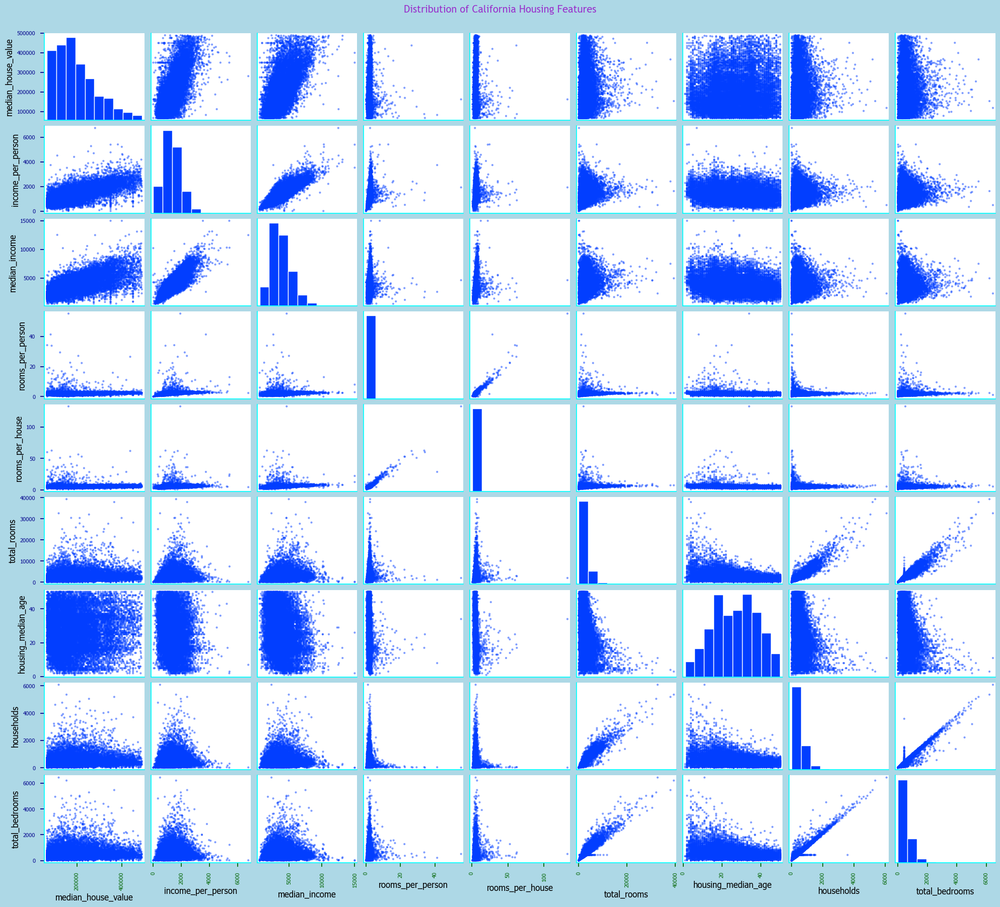

In [36]:
from pandas.plotting import scatter_matrix

attributes = ['median_house_value', 'income_per_person', 'median_income', 'rooms_per_person', 'rooms_per_house', 'total_rooms', 'housing_median_age', 'households', 'total_bedrooms']

# Plot histograms and capture the returned axes
scatter_matrix(housing[attributes], figsize=(20, 18))

# # Plot histograms and capture the returned axes
# axes = scatter_matrix(housing[attributes], figsize=(20, 18))

# # Define $k formatter function
# def dollar_k_formatter(x, pos):
#     return f'${x/1000:,.2f}k'    # e.g. \$100k, \$200k

# # Define $k formatter function
# def count_k_formatter(x, pos):
#     return f'{x/1000:,.2f}k'    # e.g. \100k, \200k

# # Define specific columns and their formatters
# currency_cols = ['median_income', 'median_house_value', 'income_per_person']   # $ format
# # percent_cols  = []                                         # % format
# non_currency_cols  = ['population', 'households', 'total_rooms', 'total_bedrooms'] # , format

# # Add ylabel to each subplot
# for axsp in axes.flatten():
#     col_name = axsp.get_title()  # 👈 Get column name from subplot title
#     if axsp.has_data():
#         # ax.set_ylabel('Frequency', fontdict=y_label_font)
#         axsp.yaxis.set_major_formatter(StrMethodFormatter('{x:,}')) #
#         axsp.minorticks_on()
#         axsp.tick_params(axis='x', labelsize=7.5, labelrotation=None)
#         axsp.tick_params(axis='y', labelrotation=None)
#         axsp.tick_params(axis='x', which='minor', bottom=True, length=3, width=1, color='darkred')
#         axsp.tick_params(axis='y', which='minor', bottom=True, length=3, width=1, color='darkred')
#         # axsp.autoscale()
#         # asp.axis('equal')
#         # axsp.set_xlim(left=0)
#         # axsp.set_ylim(bottom=0)
#         # axsp.set_xscale('log')
#         # axsp.set_yscale('log')
#         # axsp.set_yscale('linear')  # Try removing log scale
    
#     # Apply specific x-axis formatters based on column name
#     if col_name in currency_cols:
#             # ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}'))   # $ format
#             axsp.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))  # $k format
#     elif col_name in non_currency_cols:
#             # ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))     # format
#             axsp.xaxis.set_major_formatter(FuncFormatter(count_k_formatter))  # k format

plt.suptitle("Distribution of California Housing Features", fontdict=title_font, x=0.5, y=1.00) # Overview of Housing Dataset Variables, Statistical Distribution of Housing Attributes
plt.tight_layout(pad=1, h_pad=0.3, w_pad=0.3, rect=None)

#==#

my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_11_Distribution_Of_CAL_Housing_Features_Scatter_Matrix.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

plt.show()

In [37]:
# from sklearn.model_selection import train_test_split
# import numpy as np

# train_set, test_set = train_test_split(housing_full, test_size=0.2,random_state=42)

# # Create a unique ID for each row in the based on its geographic coordinates.
# # housing_with_id["id"] = (housing_full["longitude"] * 1000 + housing_full["latitude"])

# housing["income_cat"] = pd.cut(housing["median_income"],
# bins=[0., 2000., 4000., 6000., 8000., np.inf],
# labels=[1, 2, 3, 4, 5])
# cat_counts = housing["income_cat"].value_counts().sort_index()
# cat_counts.plot.bar(rot=0, grid=True)
# plt.xlabel("Income category")
# plt.ylabel("Count")
# plt.show()

### `💾 Save Modified DataFrame To Python Docs Folder`.

In [38]:
# 📁 Define base CSV directory
csv_files_dir = os.path.expanduser("~/Python-Documents/os/CSV Files")

# 🧱 Create directory if it doesn't exist
os.makedirs(csv_files_dir, exist_ok=True)

# 📄 Define full CSV file path
csv_path = os.path.join(csv_files_dir, "California_Housing_Market_Data_Analysis_modified_2.csv")

# 💾 Save modified dataset to CSV file
housing.to_csv(csv_path, index=False)

print("Modified CSV file saved to:", csv_path)

Modified CSV file saved to: C:\Users\tailb/Python-Documents/os/CSV Files\California_Housing_Market_Data_Analysis_modified_2.csv


In [39]:
# # Styling (ONLY for display)
# # Apply thousand seperator and format row values in specified columns
# cols = housing.loc[:,"housing_median_age":"median_house_value"]
# housing_styled = housing.head(2).style.format({col: "{:,.0f}" for col in cols})
# housing_styled

### `🤖📌 Machine Learning Project Objectives`.

**`What are the objectives of the machine learning project?`**:
- --
  - **1 `📌 To predict median house values based on features like income, room ratios, housing age and location`**.

  - **2 `📌 To identify and analyse the distribution of housing values across key California locations`**.
     
  - **3 `📌 To segment California housing markets into meaningful clusters using KMeans clustering`**.
     
  - **4 `📌 To determine the best housing investment strategy (PB&H, F&F or AFD) per geographic location`**.
  
  - **4 `📌 To visualise geographic housing patterns across California using geospatial mapping`**.
     
  - **5 `📌 To explore the relationship between ocean proximity, median income and median house value`**.
     
  - **6 `📌 To provide data-driven prescriptive recommendations for housing strategy selection by location`**.

### `🎓 Unsupervised Learning — Median House Price Clustering: A K-Means Approach Across Univariate, Bivariate & Multivariate Analysis`.

##### `🤔✨ What Is K-Means Clustering?`.

- **📌`K-Means Clustering is a popular unsupervised machine learning algorithm that partitions a dataset into a pre-defined number of clusters, grouping similar data points together to discover underlying patterns or structures within the data`**. 

- **📌`It is a centroid-based (distance-based) algorithm, where distances are calculated to assign each point to its nearest cluster`**. 

- **📌`Each cluster is associated with a centroid, and the main objective is to minimise the sum of distances between the data points and their respective cluster centroid.`**.

- --

- **`⚙️ How Does It Work?`**

- **`The K-Means algorithm follows an iterative process`**:

   - **1. `The algorithm randomly assigns k initial centers (k specified by the user), either by randomly choosing points in the Euclidean space defined by all n variables, or by sampling k points of all available observations to serve as initial centers`**.
   
   - **2. `It then iteratively assigns each observation to the nearest center, and calculates the new center for each cluster as the centroid mean of the clustering variables for each cluster's new set of observations`**.
   
   - **3.`This process repeats until a new iteration no longer re-assigns any observations to a new cluster — at this point, the algorithm is considered to have converged, and the final cluster assignments constitute the clustering solution`**.
- --

##### `🧠 The Three Levels Of Analysis`.

**`1. 📈 Univariate Analysis`**:

- --

  - **`Univariate K-Means clustering examines a single variable in isolation — in this case, median_house_value`**. 
    - **`K-Means applied to univariate data is also known as Jenks Natural Breaks Optimisation`**. 

  - **`This approach allows us to identify natural price breakpoints and segment houses into distinct price tiers (e.g., Low, Medium, High) based on price alone — serving as the simplest baseline clustering view`**.

  - **`🟢 Objective`**: **`Identify natural price tiers`**.

- --

**`2. 📈📉 Bivariate Analysis`**:

- --

  - **`Bivariate K-Means clustering uses two variables simultaneously — for example, median_house_value and median_income, or median_house_value and housing_median_age`**. 
    - **`✨ Clusters are often easy to spot when using only 2 or 3 features.`**. 

  - **`This level of analysis reveals how price interacts with another key feature and helps identify whether income levels or house age meaningfully distinguish property clusters`**.

  - **`🟢 Objective`**: **`Explore price vs. one key driver`**.

- --

**`3. 🤹‍♂️ Multivariate Analysis`**:

- --

  - **`Multivariate K-Means clustering uses multiple variables simultaneously, capturing the full complexity of housing data`**. 
    
  - **`It looks for a solution where all the features within each cluster are as similar as possible, and all the clusters themselves are as different as possible — with feature similarity based on the set of attributes specified for the analysis, and clusters created using the K-Means algorithm`**.

  - **`🟢 Objective`**: **`Discover complex housing market segments`**.

- --

##### `🤔✨🏠 Why Apply K-Means To Housing Data?`.

- **`🟢 The primary objective is to cluster housing data and uncover hidden market segments that pure regression cannot reveal`**.

- **`✨ When paired with supervised learning models, clustering algorithms can unearth invaluable insights and optimise overall performance`**.

##### `👨‍👨‍👦‍👦 Group Numerical Values By Categorical Value (Ocean Proximity)`.

In [40]:
housing.groupby(['ocean_proximity'])[['population', 'households', 'total_rooms', 'total_bedrooms', 'housing_median_age', 
                                      'rooms_per_house', 'rooms_per_person', 'median_house_value', 'median_income', 'income_per_person', ]].mean()\
    .sort_values(by='median_house_value', ascending=False).round(2).reset_index()

,ocean_proximity,population,households,total_rooms,total_bedrooms,housing_median_age,rooms_per_house,rooms_per_person,median_house_value,median_income,income_per_person
0,NEAR OCEAN,1399.56,514.57,2586.79,551.16,28.04,5.06,1.94,226125.13,3677.55,1416.37
1,NEAR BAY,1327.41,512.50,2646.10,536.47,32.20,5.22,2.03,224496.51,4012.46,1569.73
2,<1H OCEAN,1567.35,526.50,2636.99,553.53,28.31,5.06,1.75,222564.41,4012.57,1392.23
3,INLAND,1451.30,505.00,2930.51,564.34,22.45,6.16,2.25,134916.72,3430.72,1218.42


##### `📥 Load Dataframe`.

In [41]:
# Define path to california housing market data analysis file
file_path = os.path.expanduser("~/Python-Documents/os/CSV Files/California_Housing_Market_Data_Analysis_modified_2.csv")

# Read and copy data
read_csv = pd.read_csv(file_path)
housing = read_csv.copy()

# Display first 2 rows
housing.head(2)

#==#

# # Load the dataset
# file_path = r"\Users\tailb\Python-Documents\os\CSV Files\California_Housing_Market_Data_Analysis_modified_2.csv"

# # Read and copy data
# read_csv = pd.read_csv(file_path)
# housing = read_csv.copy()

# # Display first 2 rows
# housing.head(3)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY


##### `⧉ Copy Dataframe To Preserve Changes`.

In [42]:
# Copy dataframe to preserve changes
housing_clustering = housing.copy()

##### `Cluster 1 - 📈 ✨ Univariate Clustering - Median House Value`.

**`Use elbow method to determing optimal number of clusters`**.

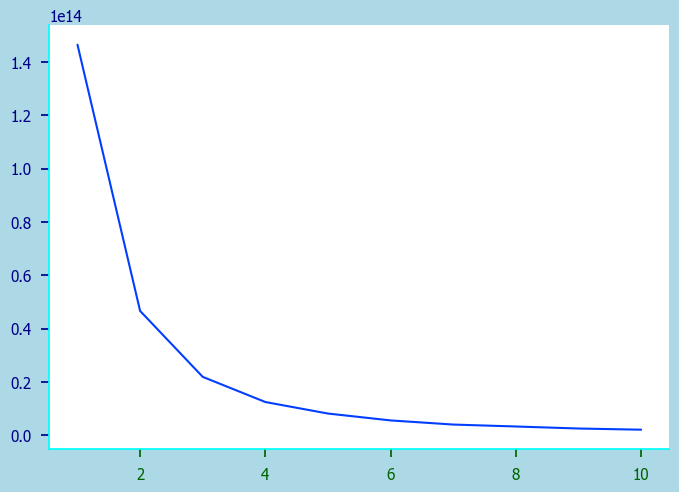

In [43]:
# Use elbow method to determing optimal number of clusters.
inertia_scores_1=[]
for i in range (1, 11):
    kmeans_1 = KMeans(n_clusters=i)
    kmeans_1.fit(housing_clustering[['median_house_value']])
    inertia_scores_1.append(kmeans_1.inertia_)
inertia_scores_1
plt.plot(range(1, 11), inertia_scores_1) # Elbow starts at 3. Update number of clusters to n_clusters = 3

**`Univariate clustering - Median House Value`**.

In [44]:
# Univariate clustering - Median House Value.
clustering_1 = KMeans(n_clusters=3, random_state=42) # Ideal clusters via from elbow method
clustering_1.fit(housing_clustering[['median_house_value']])
clustering_1.labels_
housing_clustering['MHV_cluster'] = clustering_1.labels_ # Add clusters under new column
housing_clustering.head() # Preview first 5 rows
housing_clustering['MHV_cluster'].value_counts() # View clusters by count.
# clustering_1.inertia_  # Result is the distance from the centroids

MHV_cluster
0    8629
2    6318
1    2539
Name: count, dtype: int64

**`Analyse cluster statistics`**.

In [45]:
# Analyse cluster statistics.
housing_clustering.groupby(['MHV_cluster'])['median_house_value'].agg(['min', 'median', 'mean', 'size']).sort_values(by='mean', ascending=False).round(2).reset_index()

,MHV_cluster,min,median,mean,size
0,1,296900.0,353600.0,366267.07,2539
1,2,175700.0,223900.0,226860.87,6318
2,0,66200.0,125000.0,123813.07,8629


**`Define MHV_cluster function`**.

In [46]:
# Define MHV_cluster function.
def mhv_cluster(row):
    if row['MHV_cluster'] == 1:
        return '🏆 Premium'  # Premium
    elif row['MHV_cluster'] == 2:
        return '🏡 Mid Range'  # Mid 
    elif row['MHV_cluster'] == 0:
        return '🏘️ Budget'  # Budget 
    else:
        return ''

housing_clustering['MHV_cluster_name'] = housing_clustering.apply(mhv_cluster, axis=1)

**`Preview first two rows`**.

In [47]:
# Preview first two rows.
housing_clustering.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium


##### `Cluster 2 - 📈📉✨ Bivariate Clustering - Price Cluster`.

**`Copy dataframe to preserve changes`**.

In [48]:
# Copy dataframe to preserve changes.
housing_clustering_2 = housing_clustering.copy()

**`Use elbow method to determing optimal number of clusters`**.

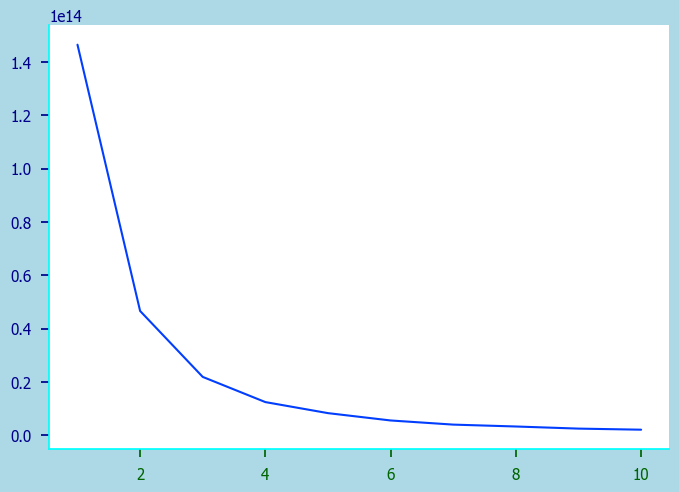

In [49]:
# Use elbow method to determing optimal number of clusters.
inertia_scores_2=[] # Empty list to collect scores
for i in range(1, 11):
    kmeans_2 = KMeans(n_clusters=i)
    kmeans_2.fit(housing_clustering_2[['median_house_value', 'median_income']])
    inertia_scores_2.append(kmeans_2.inertia_) # ← Scores get added here
plt.plot(range(1, 11), inertia_scores_2)

**`Bivariate Clustering — Price Cluster`**.

In [50]:
# Bivariate Clustering — Price Cluster.
clustering_2 = KMeans(n_clusters=3, random_state=42) # Ideal clusters via from elbow method
clustering_2.fit(housing_clustering_2[['median_house_value', 'median_income']])
clustering_2.labels_
housing_clustering_2['price_cluster'] = clustering_2.labels_ # Add clusters under new column
housing_clustering_2.head()  # Preview first 5 rows
housing_clustering_2['price_cluster'].value_counts() # View clusters by count
# clustering_2.inertia_  # Result is the distance from the centroids

price_cluster
0    8617
2    6324
1    2545
Name: count, dtype: int64

**`Analyse cluster statistics`**.

In [51]:
# Analyse cluster statistics.
housing_clustering_2.groupby(['price_cluster'])['median_house_value'].agg(['min', 'median', 'mean', 'size']).sort_values(by='median', ascending=False).round(2).reset_index()

,price_cluster,min,median,mean,size
0,1,296600.0,353600.0,366103.03,2545
1,2,175400.0,223800.0,226697.11,6324
2,0,66200.0,125000.0,123741.14,8617


**`Define price_cluster function`**.

In [52]:
# Define price_cluster function.
def price_cluster(row):
    if row['price_cluster'] == 1:
        return '🏆 Affluent Districts'       # Premium - High (income + house value)
    elif row['price_cluster'] == 2:
        return '🏡 Middle Class Suburbs'     # Mid Range - Mid (income + house value)
    elif row['price_cluster'] == 0:
        return '🏘️ Affordable Neighborhoods' # Budget - Low (income + house value) 
    else:
        return ''

housing_clustering_2['price_cluster_name'] = housing_clustering_2.apply(price_cluster, axis=1)

**`Preview first two rows`**.

In [53]:
# Preview first two rows.
housing_clustering_2.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts


##### `Cluster 3 - 📈📉✨ Bivariate Clustering - Wealth Cluster`.

**`Create a copy of the previous dataframe`**.

In [54]:
# Create a copy of the previous dataframe.
housing_clustering_3 = housing_clustering_2.copy()

**`Use elbow method to determing optimal number of clusters`**.

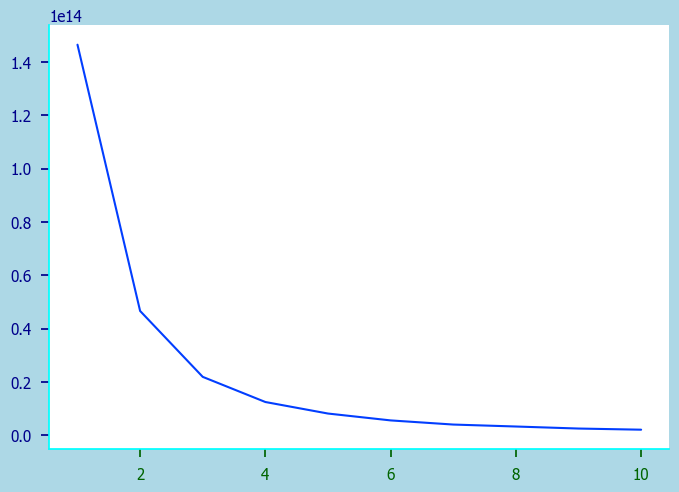

In [55]:
# Use elbow method to determing optimal number of clusters.
inertia_scores_3=[]
for i in range(1, 11):
    kmeans_3 = KMeans(n_clusters=i)
    kmeans_3.fit(housing_clustering_3[['median_house_value', 'income_per_person']])
    inertia_scores_3.append(kmeans_3.inertia_)
plt.plot(range(1, 11), inertia_scores_3)

**`Bivariate Clustering - Wealth Cluster`**.

In [56]:
# Bivariate Clustering - Wealth Cluster.
clustering_3 = KMeans(n_clusters=3, random_state=42) # Ideal clusters via from elbow method
clustering_3.fit(housing_clustering_3[['median_house_value', 'income_per_person']])
clustering_3.labels_
housing_clustering_3['wealth_cluster'] = clustering_3.labels_ # Add clusters under new column
housing_clustering_3.head() # Preview first 5 rows
housing_clustering_3['wealth_cluster'].value_counts() # View clusters by count
# clustering_3.inertia_  # Result is the distance from the centroids

wealth_cluster
0    8617
2    6324
1    2545
Name: count, dtype: int64

**`Analyse cluster statistics`**.

In [57]:
# Analyse cluster statistics.
housing_clustering_3.groupby(['wealth_cluster'])['median_house_value'].agg(['min', 'median', 'mean', 'size']).sort_values(by='mean', ascending=False).round(2).reset_index()

,wealth_cluster,min,median,mean,size
0,1,296600.0,353600.0,366103.03,2545
1,2,175400.0,223800.0,226697.11,6324
2,0,66200.0,125000.0,123741.14,8617


**`Define wealth_cluster function`**.

In [58]:
# Define wealth_cluster function.
def wealth_cluster(row):
    if row['wealth_cluster'] == 1:
        return '🏰 Luxury Zones'       # High wealth — High income per person, High value
    elif row['wealth_cluster'] == 2:
        return '🏠 Comfortable Living' # Mid wealth — Mid income per person, Mid value
    elif row['wealth_cluster'] == 0:
        return '🏘️ Budget Communities' # Low wealth — Low income per person, Low value
    else:
        return ''

housing_clustering_3['wealth_cluster_name'] = housing_clustering_3.apply(wealth_cluster, axis=1)

**`Preview first two rows`**.

In [59]:
# Preview first two rows.
housing_clustering_3.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name,wealth_cluster,wealth_cluster_name
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones


##### `Cluster 4 - 📈📉✨ Bivariate Clustering - Geo Cluster`.

**`Copy dataframe to preserve changes`**.

In [60]:
# Copy dataframe to preserve changes.
housing_clustering_4  = housing_clustering_3.copy()

**`Use elbow method to determing optimal number of clusters`**.

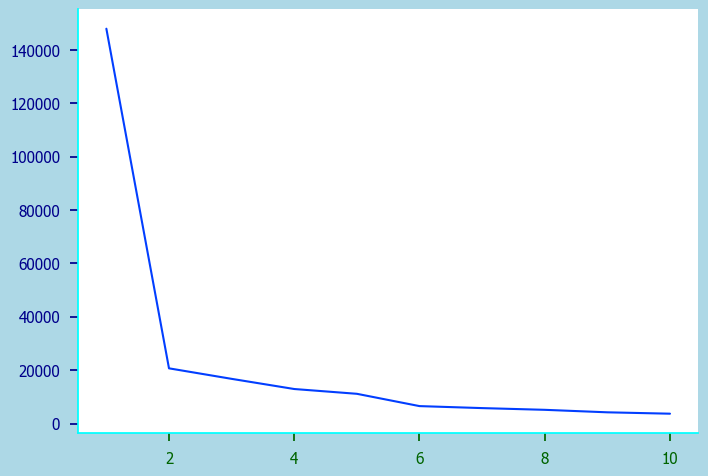

In [61]:
# Use elbow method to determing optimal number of clusters.
inertia_scores_4=[]
for i in range(1, 11):
    kmeans_4 = KMeans(n_clusters=i)
    kmeans_4.fit(housing_clustering_4[['latitude', 'longitude']])
    inertia_scores_4.append(kmeans_4.inertia_)
plt.plot(range(1, 11), inertia_scores_4)

**`Bivariate Clustering - Geo Cluster`**.

In [62]:
# Bivariate Clustering - Geo Cluster.
clustering_4 = KMeans(n_clusters=2, random_state=42) # Ideal clusters via from elbow method
clustering_4.fit(housing_clustering_4[['latitude', 'longitude']])
clustering_4.labels_
housing_clustering_4['geo_cluster'] = clustering_4.labels_ # Add clusters under new column
housing_clustering_4.head() # Preview first 5 rows
housing_clustering_4['geo_cluster'].value_counts() # View clusters by count
# clustering_4.inertia_  # Result is the distance from the centroids

geo_cluster
1    10510
0     6976
Name: count, dtype: int64

**`Analyse cluster statistics`**.

In [63]:
# Analyse cluster statistics.
housing_clustering_4.groupby(['geo_cluster'])[['longitude', 'latitude']].agg(['min', 'median', 'mean', 'size']).round(2).reset_index()

geo_cluster longitude                        latitude                     
                    min  median    mean   size      min median   mean   size
0           0    -124.3 -121.91 -121.70   6976    35.19  37.80  37.96   6976
1           1    -120.7 -118.08 -117.98  10510    32.54  33.97  33.90  10510

**`Define geo_cluster function`**.

In [64]:
# Define geo_cluster function.
def geo_cluster(row):
    if row['geo_cluster'] == 0:
        return 'Northern California' # NoCal - # Mean lat 37.96 ✅
    elif row['geo_cluster'] == 1:
        return 'Southern California' # SoCal - # Mean lat 33.94 ✅
    else:
        return ''

housing_clustering_4['geo_cluster_name'] = housing_clustering_4.apply(geo_cluster, axis=1)

**`Preview first two rows`**.

In [65]:
# Preview first two rows.
housing_clustering_4.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name,wealth_cluster,wealth_cluster_name,geo_cluster,geo_cluster_name
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California


##### `Cluster 5 - 🤹‍♂️✨ Multivariate Clustering - Market Segment Cluster`.

**`⧉ Copy Dataframe To Preserve Changes`**.

In [66]:
# Copy dataframe to preserve changes.
housing_clustering_5 = housing_clustering_4.copy()

**`📊 Scatterplot - Elbow Method - Optimal K `**.

In [67]:
# Scatterplot - Elbow Method - Optimal K.

# Import libraries
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
# ── Imports ──────────────────────────────────────────────────────────────────
# import plotly.io as pio                                 # 👈 Add this
# pio.renderers.default = "plotly_mimetype+notebook"     # 👈 Add this
# # ─────────────────────────────────────────────────────────────────────────────

# Seperate features
num_features = ['population', 'households', 'total_rooms', 'total_bedrooms', 'people_per_house', 'rooms_per_house', 
                'rooms_per_person', 'income_per_person', 'bedrooms_ratio','housing_median_age', 'median_income', 'median_house_value',
                'longitude', 'latitude']
cat_features = ['ocean_proximity']

# Preprocessing Pipleline
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_features),  # Scale numerical feature
    ('cat', OneHotEncoder(sparse_output=False), cat_features)  # Encode categorical features
])

X_processed = preprocessor.fit_transform(housing_clustering_5) # Shape: (20640, 15)

# Elbow method to find optimal k
inertia = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(
        n_clusters=k, 
        random_state=42, 
        n_init=3,           # Reduced from 10 → 3 (fewer restarts)
        max_iter=100,       # Reduced from 300 → 100 (fewer iterations)
        algorithm = 'elkan' # Faster algorithm for dense data
    )
    kmeans.fit(X_processed) # Full 20,640 rows — accurate elbow curve
    inertia.append(kmeans.inertia_)

# Plot elbow curve
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=list(k_range),
    y=inertia,
    mode='lines+markers',
    marker=dict(size=10, color='blue'),
    line=dict(width=2)
))
fig.update_layout(
    title={
    "text": "<b><u>Elbow Method - Optimal k</u></b>"
        "<br><sup>(Scatterplot labels represent Optimal k)</sup>", 
        "x": 0.5,
        "xanchor": "center",
        "font": {"family": "Tahoma", "size": 18, "color": "red"}
    },
    xaxis_title='<b>Number of Clusters (k)</b>',
    xaxis=dict(
        color="blue",
        tickformat=",.0f",
        # tickformat="$,.0f",
        tickangle=0,
        tickfont=dict(family="Tahoma", size=14, color="blue"),
        showgrid=True,           # ✅ Vertical gridlines
        gridcolor="mistyrose",
        gridwidth=0.5,
    ),
    yaxis_title='<b>Inertia (Within-Cluster Sum of Squares)</b>',
    yaxis=dict(
        color="green",
        tickformat=",.0f",
        #tickformat="$,.0f",
        tickangle=0,
        tickfont=dict(family="Tahoma", size=14, color="green"),
        showgrid=True,           # ✅ Horizontal gridlines
        gridcolor="mistyrose",
        gridwidth=0.5,
    ),
    legend_title={
        "text": "<u><b>Optimal K</b></u>",
        "font": {"family": "Tahoma", "size": 16, "color": "purple"},
    },
    legend=dict(
        bgcolor="white",
        bordercolor="black",
        borderwidth=2,
    ),
    plot_bgcolor="white",
    hoverlabel=dict(             # ✅ Styled hover box
        #bgcolor="white",
        font_size=14,
        font_family="Tahoma",
    )
)
fig.show()

**`What is Principal Component Analysis (PCA)?`**.

  - **`📌 It is an unsupervised linear technique that works best with data that has a linear structure`**.
    
    - **`📌 It seeks to identify the underlying principal components in the data by projecting onto lower dimensions, minimising variance, and preserving large pairwise distances`** .
    
    - **`📌 In our scenario, PCA would pick three characteristics X`**
    
    - **`📌 In summary, PCA preserves the variance in the data`**.
    
    - **https://www.datacamp.com/tutorial/principal-component-analysis-in-python**

**`📊 Scatterplot - Five Faces Of The California Housing Market: KMeans + PCA Segmentation Story`**.

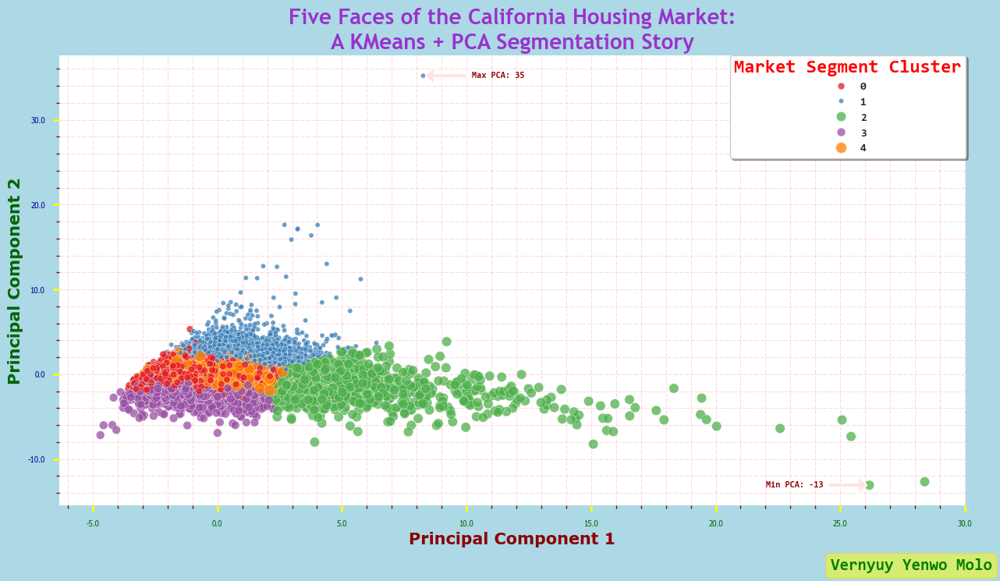

In [68]:
# Scatterplot - Five Faces Of The California Housing Market: A KMeans + PCA Segmentation Story.

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px

# Step 1: Create a copy to preserve rfm_df
pca_df1 = housing_clustering_5.copy()

#==#

# Step 2: Select only numerical features
num_features = pca_df1[['population', 'households', 'total_rooms', 'total_bedrooms', 'people_per_house', 'rooms_per_house', 'rooms_per_person', 
                        'income_per_person', 'bedrooms_ratio', 'housing_median_age', 'median_income', 'median_house_value', 'longitude', 'latitude']]
#==#

# Step 3: Standardise/Scale the data
scaler = StandardScaler()
pca_df1_scaled = scaler.fit_transform(num_features)

#==#

# Step 4: Apply/Fit KMeans with optimal k
optimal_k = 5  # change this if a different number looks better on the Elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
pca_df1['market_segment_cluster'] = kmeans.fit_predict(pca_df1_scaled) # .astype(str)

#==#

# Step 5: Rename the cluster column to something intuitive (optional)
pca_df1['market_segment_cluster'] = pca_df1['market_segment_cluster'].astype(str)  # convert to string for plotting

#==#

# Step 6: Reduce marketing strategy features to 2D & visualize with PCA
pca_reducer = PCA(n_components=2)
market_strategy_pca = pca_reducer.fit_transform(pca_df1_scaled)
pca_df1['PCA1'] = market_strategy_pca[:, 0]
pca_df1['PCA2'] = market_strategy_pca[:, 1]

#==#

# Step 7 Prepare plot
fig, pca1 = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# Step  8: Define cluster order
# cluster_order = ['0','1','2','3'] # hot_r
# cluster_order = ['1','0','2','3'] # hot_r
# cluster_order = ['3','2','0','1'] # Set1
cluster_order = [str(i) for i in range(optimal_k)]

# Step 9: Plot 'PCA1' vs 'PCA2'
sns.scatterplot(data=pca_df1,x='PCA1',y='PCA2',hue='market_segment_cluster',size='market_segment_cluster',style=None,palette='Set1',
hue_order=cluster_order,hue_norm=None,sizes=(100,20),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=pca1,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 10: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
pca1.figure.set_size_inches(15, 7.5)
# pca1.figure.set_size_inches(20, 7.5)
pca1.set_title('Five Faces of the California Housing Market:\nA KMeans + PCA Segmentation Story',loc='center',fontdict=title_font)
pca1.set_xlabel('Principal Component 1',loc='center',fontdict=x_label_font)
pca1.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
# pca1.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# pca1.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# pca1.set_xticks([,])
pca1.set_ylabel('Principal Component 2',loc='center',fontdict=y_label_font)
pca1.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
# pca1.yaxis.set_major_formatter(StrMethodFormatter(' £ {x:,}')) # £/$
# pca1.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# pca1.set_yticks([,])

# pca1.tick_params(axis='both',colors='chocolate',direction='out',length=13,width=5,labelsize='medium',labelcolor='darkblue',labelfontfamily='tahoma',labelrotation=None,grid_linewidth=1)
pca1.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
pca1.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
pca1.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
pca1.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

pca1.minorticks_on()

pca1.spines[['top','right']].set_visible(False)
pca1.spines[['bottom','left']].set_visible(False)

pca1.set_facecolor('white')

pca1.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# pca1.autoscale()
# pca1.axis('equal')
# pca1.set_xlim(left=0)
# pca1.set_ylim(bottom=0)
# pca1.set_xscale('log')
# pca1.set_yscale('log')
# pca1.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='consolas',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = pca1.legend(loc='best',bbox_to_anchor=(1, 1),borderaxespad=0,title='Market Segment Cluster',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 11: Automatically Annotate The Minumum & Maximum Value

# PCA1 and PCA2 Extraction
xvalues = pca_df1['PCA1'].values    # or use .iloc below
yvalues = pca_df1['PCA2'].values

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
pca1.annotate(f'Min PCA: {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-3.0,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
pca1.annotate(f'Max PCA: {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+3.0,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 12: Add signature to figure in bbox round format
pca1.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=pca1.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 13: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_12_CAL_Housing_Segments_KMeans_PCA_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 14: Display the plot
plt.show()

**`Fit KMeans With ✨ k=5 And 🔍 Analyse Market Cluster Profiles`**.

In [69]:
# Fit fKMeans with k=5
kmeans_final = KMeans(n_clusters=5, random_state=42, n_init=3, max_iter=100, algorithm='elkan')
housing_clustering_5['market_segment_cluster'] = kmeans_final.fit_predict(X_processed)

# Analyse market segment cluster profiles
cluster_profile_1 = housing_clustering_5.groupby('market_segment_cluster').agg(
    mean_pop                   = ('population', 'mean'),
    mean_h                     = ('households', 'mean'),
    mean_h_val                 = ('median_house_value', 'mean'),
    mean_h_age                 = ('housing_median_age', 'mean'),
    mean_inc                   = ('median_income', 'mean'),
    mean_inc_pers              = ('income_per_person', 'mean'),
    mean_rooms                 = ('total_rooms', 'mean'),
    mean_bdrooms               = ('total_bedrooms', 'mean'),
    mean_rooms_ph              = ('rooms_per_house', 'mean'),
    mean_ppl_ph                = ('people_per_house', 'mean'),
    mean_bdroom_rat            = ('bedrooms_ratio', 'mean'),
    mean_lt                    = ('latitude', 'mean'),
    mean_lg                    = ('longitude', 'mean'),
    ocean_prox                 = ('ocean_proximity', lambda x: x.value_counts().index[0]),  # Most common
    count                      = ('median_income', 'count')
).round(2)#.reset_index()

print(cluster_profile_1)

                        mean_pop   mean_h  mean_h_val  mean_h_age  mean_inc  mean_inc_pers  mean_rooms  mean_bdrooms  mean_rooms_ph  mean_ppl_ph  mean_bdroom_rat  mean_lt  mean_lg ocean_prox  count
market_segment_cluster                                                                                                                                                                               
0                        1195.06   436.60   295273.56       25.13   5672.18        2091.40     2768.34        466.43           6.74         2.76             0.17    35.00  -119.20  <1H OCEAN   4210
1                        1151.93   418.52   153716.34       26.74   3250.21        1195.96     2190.32        450.24           5.38         2.82             0.21    37.98  -121.58     INLAND   5435
2                        1418.76   455.05   166631.62       30.17   2977.59         994.73     2040.25        484.04           4.56         3.26             0.24    33.86  -117.95  <1H OCEAN   6588
3         

**`Cluster Profile - Mean Values Per Segment`**.

In [70]:
# Build profile (mean of each feature per cluster)
num_values = ['population', 'households', 'median_house_value', 'housing_median_age', 'median_income', 'income_per_person', 
            'total_rooms', 'total_bedrooms', 'rooms_per_house', 'rooms_per_person', 'people_per_house',  'bedrooms_ratio', 'longitude', 'latitude']

# num_values = ['median_income', 'median_house_value', 'housing_median_age','population', 'households', 'total_rooms', 'total_bedrooms',
#                 'people_per_house', 'rooms_per_house', 'rooms_per_person', 'income_per_person', 'bedrooms_ratio', 'longitude', 'latitude']

profile_features = num_values

cluster_profile_2 = housing_clustering_5.groupby('market_segment_cluster')[profile_features].mean().round(2)
cluster_profile_2['count'] = housing_clustering_5['market_segment_cluster'].value_counts().sort_index()
cluster_profile_2['pct_of_total'] = (cluster_profile_2['count'] / len(pca_df1) * 100).round(1)

print("=" * 90)
print("CLUSTER PROFILE — Mean Values Per Segment")
print("=" * 90)
print(cluster_profile_2.T)   # Transpose for easier reading

CLUSTER PROFILE — Mean Values Per Segment
market_segment_cluster          0          1          2          3          4
population                1195.06    1151.93    1418.76    4295.65    6063.33
households                 436.60     418.52     455.05    1544.86       8.67
median_house_value      295273.56  153716.34  166631.62  203814.40  185000.00
housing_median_age          25.13      26.74      30.17      15.10      42.33
median_income             5672.18    3250.21    2977.59    4067.74    6669.40
income_per_person         2091.40    1195.96     994.73    1505.33       8.64
total_rooms               2768.34    2190.32    2040.25    8469.63      57.67
total_bedrooms             466.43     450.24     484.04    1684.57      10.00
rooms_per_house              6.74       5.38       4.56       5.56       5.80
rooms_per_person             2.53       2.00       1.53       2.06       0.01
people_per_house             2.76       2.82       3.26       2.79     781.84
bedrooms_ratio        

**`📊 Heatmap - Market Segment Cluster Feature Profiles (Standardized) Red = Above Average | Blue = Below Average`**

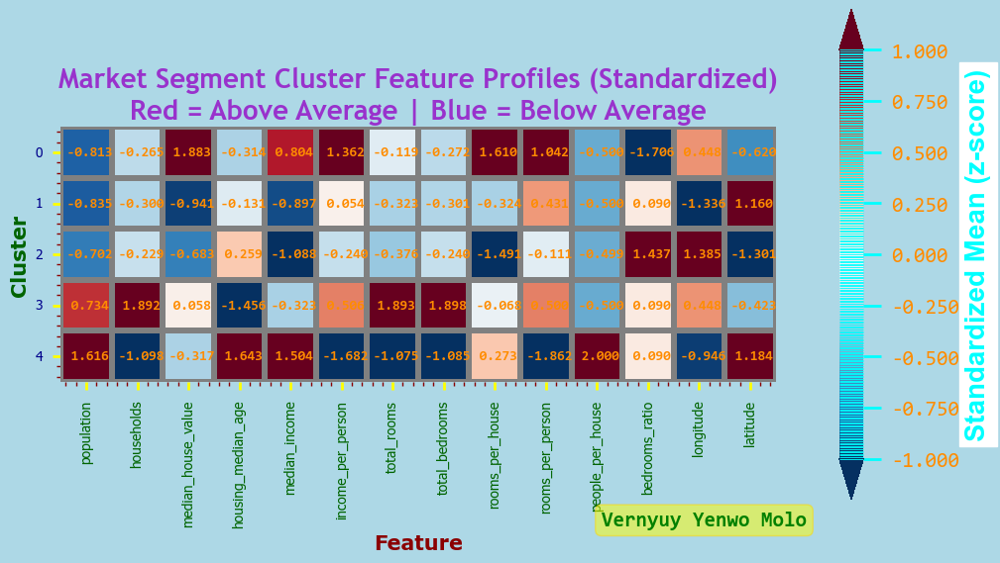

In [71]:
# Heatmap - Market Segment Cluster Feature Profiles (Standardized) Red = Above Average | Blue = Below Average

# Import library
from sklearn.preprocessing import StandardScaler

# Build profile (mean of each feature per cluster)

# Define numerical features
num_values = ['population', 'households', 'median_house_value', 'housing_median_age', 'median_income', 'income_per_person', 
            'total_rooms', 'total_bedrooms', 'rooms_per_house', 'rooms_per_person', 'people_per_house',  'bedrooms_ratio', 'longitude', 'latitude']

# Call numerical feautues under new name
profile_features = num_values

# Standardize the cluster means so we can compare on the same scale
scaler = StandardScaler()
heatmap_data = pd.DataFrame(
    scaler.fit_transform(cluster_profile_2[profile_features]),
    index=cluster_profile_2.index,
    columns=profile_features
)

#==#

# Figure properties
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(21,8),layout='constrained',facecolor='lightblue',dpi=100)

#==#

# Format colobar value
# fmt = lambda x,pos: ' £{:,.0f}'.format(x) # £
# fmt = lambda x,pos: ' ${:,.0f}'.format(x) # $
fmt = lambda x,pos: '{:,.3f}'.format(x) # Count

#==#

# Keyword arguements for plot appearance
annot_kws = dict(family='consolas',size=10,style='normal',weight='bold',color='darkorange',alpha=1,rotation=0,ha='center',va='center',) # backgroundcolor='pink')
cbar_kws = {"orientation":"vertical","shrink":0.5,'extend':'both','extendfrac':0.1,"drawedges":True,'label':'Standardized Mean (z-score)','format':fmt,}
kwargs = {'linewidths':4,'linecolor':'gray','linestyle':'dashed','alpha':1,}#'rasterized':True,'edgecolor':'pink',"capstyle":'projecting','linewidth':2}

#==#

# Create a mask using numpy's triu function
mask = np.triu(np.ones_like(heatmap_data, dtype=bool))

#==#

# Create heatmap of 'features' vs 'cluster' By 'mean'. ['copper_r',summer','Blues','Oranges,'pink_r','YlGn','YlOrBr','YlGnBu','hot_r','GnBu_r', 'RdBu_r]
ax = sns.heatmap(heatmap_data,vmin=-1,vmax=1,cmap='RdBu_r',center=None,robust=True,annot=True,fmt='.3f',annot_kws=annot_kws,
cbar=True,cbar_kws=cbar_kws,cbar_ax=None,square=True,xticklabels='auto',yticklabels='auto',mask=None,ax=ax,**kwargs) # fmt must be in string format. # centre=True (No gradient)#

#==#

# ax.figure.set_size_inches(40, 20)
# ax.figure.set_size_inches(21, 8) # cbar_kws("shrink":0.9)
# ax.figure.set_size_inches(15, 7.5)
ax.figure.set_size_inches(10, 10) # cbar_kws("shrink":0.5)
# ax.figure.set_size_inches(8, 11)
ax.set_title('Market Segment Cluster Feature Profiles (Standardized)\nRed = Above Average | Blue = Below Average', loc='center', fontdict=title_font)
ax.set_xlabel('Feature', loc='center', fontdict=x_label_font)
ax.set_ylabel('Cluster', loc='center', fontdict=y_label_font)
ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=90)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
ax.minorticks_on()
plt.tight_layout

#==#

# Change colobar font properties

# Use matplotlib.colorbar.Colorbar object
cbar = ax.collections[0].colorbar
# here to set the labelsize by 15
cbar.ax.tick_params(axis='y',length=13,width=2,color='cyan',direction='out',labelsize=15,labelcolor='darkorange',labelfontfamily='consolas',labelrotation=None)

# Change colobar label properties
ax.figure.axes[-1].yaxis.label.set_fontname('sans serif')
ax.figure.axes[-1].yaxis.label.set_fontsize(20)
ax.figure.axes[-1].yaxis.label.set_fontstyle('normal')
ax.figure.axes[-1].yaxis.label.set_fontweight('bold')
ax.figure.axes[-1].yaxis.label.set_color('cyan')
ax.figure.axes[-1].yaxis.label.set_backgroundcolor('white')

#==#

# Manually format the annotations with £/$/Count
for text in ax.texts:
    # text.set_text(f"£ {float(text.get_text()):,.0f}") # £
    # text.set_text(f" ${float(text.get_text()):,.0f}") # $
    text.set_text(f" {float(text.get_text()):,.3f}") # Count
    # text.set_fontsize(10)
    # text.set_fontweight('bold')

#==#

# Add signature to figure in bbox round format
ax.text(0.90, -0.58,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_13_Market_Segment_Cluster_Feature_Profiles_(Standardized)_Heatmap.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Display the plot
plt.show()

**`✂️ Isolate Outliers Cluster 4 And Cluster 5`**.

In [72]:
# ---- Isolate Outlier Clusters ----
cluster_4 = housing_clustering_5[housing_clustering_5['market_segment_cluster'] == 4]
# cluster_5 = housing_clustering_5[housing_clustering_5['market_segment_cluster'] == 5]

**`🧾 Display Breakdown Of Ocean Proximity Per Outlier Cluster`**.

In [73]:
# ---- Cluster 4: ocean_proximity breakdown ----
print("=" * 60)
print("🌲 Cluster 4 - Ocean Proximity Breakdown:")
print("=" * 60)
print(cluster_4['ocean_proximity'].value_counts())

# # ---- Cluster 5: ocean_proximity breakdown ----
# print("=" * 60)
# print("⚠️  Cluster 5 - Ocean Proximity Breakdown:")
# print("=" * 60)
# print(cluster_5['ocean_proximity'].value_counts())

🌲 Cluster 4 - Ocean Proximity Breakdown:
ocean_proximity
INLAND        2
NEAR OCEAN    1
Name: count, dtype: int64


**`🧾 Display Geographic Spread Per Outlier Cluster`**.

In [74]:
# ---- Cluster 4: Lat/Long Range [Geographic Spread] ----
print("=" * 60)
print("🌲 Cluster 4 - Lat/Long Range:")
print("=" * 60)
print(f"  Latitude:  {cluster_4['latitude'].min()} → {cluster_4['latitude'].max()}")
print(f"  Longitude: {cluster_4['longitude'].min()} → {cluster_4['longitude'].max()}")
print("=" * 60)

# # ---- Cluster 5: Lat/Long Range [Geographic Spread] ----
# print("\n⚠️  Cluster 5 - Lat/Long Range:")
# print("=" * 60)
# print(f"  Latitude:  {cluster_5['latitude'].min()} → {cluster_5['latitude'].max()}")
# print(f"  Longitude: {cluster_5['longitude'].min()} → {cluster_5['longitude'].max()}")
# print("=" * 60)

🌲 Cluster 4 - Lat/Long Range:
  Latitude:  35.32 → 40.41
  Longitude: -121.98 → -120.51


**`🧾 Display Rooms Per House Statistics Per Outlier Cluster`**.

In [75]:
# ---- Cluster 4: rooms_per_house statistics ----
print("=" * 60)
print("🌲 Cluster 4 - Rooms Per House Statistics:")
print("=" * 60)
print(cluster_4['rooms_per_house'].describe().round(2))
print("=" * 60)
print(f"  Max rooms_per_house: {cluster_4['rooms_per_house'].max().round(2)}")
print(f"  Min rooms_per_house: {cluster_4['rooms_per_house'].min().round(2)}")
print("=" * 60)

# # ---- Cluster 5: rooms_per_house statistics ----
# print("\n🌲 Cluster 5 - Rooms Per House Statistics:")
# print("=" * 60)
# print(cluster_5['rooms_per_house'].describe().round(2))
# print("=" * 60)
# print(f"  Max rooms_per_house: {cluster_5['rooms_per_house'].max().round(2)}")
# print(f"  Min rooms_per_house: {cluster_5['rooms_per_house'].min().round(2)}")
# print("=" * 60)

🌲 Cluster 4 - Rooms Per House Statistics:
count    3.00
mean     5.80
std      3.01
min      3.17
25%      4.15
50%      5.14
75%      7.11
max      9.08
Name: rooms_per_house, dtype: float64
  Max rooms_per_house: 9.08
  Min rooms_per_house: 3.17


**`🧾 Display People Per House Statistics Per Outlier Cluster`**.

In [76]:
# ---- Cluster 4: people_per_house statistics ----
print("=" * 60)
print("🌲 Cluster 4 - People Per House Statistics:")
print("=" * 60)
print(cluster_4['rooms_per_house'].describe().round(2))
print("=" * 60)
print(f"  Max people_per_house: {cluster_4['people_per_house'].max().round(2)}")
print(f"  Min people_per_house: {cluster_4['people_per_house'].min().round(2)}")
print("=" * 60)

# # ---- Cluster 5: people_per_house statistics ----
# print("\n🌲 Cluster 5 - People Per House Statistics:")
# print("=" * 60)
# print(cluster_5['rooms_per_house'].describe().round(2))
# print("=" * 60)
# print(f"  Max people_per_house: {cluster_5['people_per_house'].max().round(2)}")
# print(f"  Min people_per_house: {cluster_5['people_per_house'].min().round(2)}")
# print("=" * 60)

🌲 Cluster 4 - People Per House Statistics:
count    3.00
mean     5.80
std      3.01
min      3.17
25%      4.15
50%      5.14
75%      7.11
max      9.08
Name: rooms_per_house, dtype: float64
  Max people_per_house: 1243.33
  Min people_per_house: 502.46


**`🧾 Display Full Stats/All Records Of Outlier Clusters`**.

In [77]:
# ---- Cluster 4: Full Profile ----
print("=" * 60)
print("🌲 CLUSTER 4 - Full Statistics")
print("=" * 60)
print(cluster_4.describe().round(2)) # Remove .describe() to display all records.

print("=" * 60)
print("🌲 CLUSTER 4 - Full Records")
print("=" * 60)
print(cluster_4.round(2)) # Remove .describe() to display all records.

# # ---- Cluster 5: Full Profile ----
# print("\n")
# print("=" * 60)
# print("⚠️  CLUSTER 5 - Full Statistics")
# print("=" * 60)
# print(cluster_5.describe().round(2)) # Remove .describe() to display all records.

# # ---- Cluster 5: Full Profile ----
# print("\n")
# print("=" * 60)
# print("⚠️  CLUSTER 5 - Full Statistics")
# print("=" * 60)
# print(cluster_5.round(2)) # Remove .describe() to display all records.

🌲 CLUSTER 4 - Full Statistics
       longitude  latitude  population  households  total_rooms  total_bedrooms  people_per_house  rooms_per_house  rooms_per_person  income_per_person  bedrooms_ratio  housing_median_age  median_income  median_house_value  MHV_cluster  price_cluster  wealth_cluster  geo_cluster  market_segment_cluster
count       3.00      3.00        3.00        3.00         3.00            3.00              3.00             3.00              3.00               3.00            3.00                3.00           3.00                3.00         3.00           3.00            3.00          3.0                     3.0
mean     -121.06     38.02     6063.33        8.67        57.67           10.00            781.84             5.80              0.01               8.64            0.21               42.33        6669.40           185000.00         0.33           0.33            0.33          0.0                     4.0
std         0.80      2.56     1680.74        3.79        

**`🗺️ Key Insights`**:
- --
 - **`⚠️ Cluster 4`**:
   - **`‼️people_per_house of 500-1,243 are clearly prisons, military bases or institutions`**. 
   - **`Not real housing market data`**.
   - **`❌ Drop these 3 records`**.

- --

 - **`🌲 Cluster X`**:
   - **`‼️Mean rooms_per_house of 30.83`**.
   - **`These are genuine mountain/resort communities (Yosemite, Lake Tahoe, Sierra Nevada)`**. 
   - **`Small but real market segment`**.
   - **`🚩 Keep but flag — `**.
- -- 

**`🪓 Drop Cluster 4 (Institutional Anomalies)`**.

In [78]:
# Drop Cluster 4 (Institutional Anomalies)
housing_clustering_5 = housing_clustering_5[housing_clustering_5['market_segment_cluster'] != 4]
print(f"Rows after dropping Cluster 4: {len(housing_clustering_5)}")

Rows after dropping Cluster 4: 17483


**`🪓 Drop Cluster 5 (Institutional Anomalies)`**.

In [79]:
# # Drop Cluster 5 (Institutional Anomalies)
# housing_clustering_5 = housing_clustering_5[housing_clustering_5['market_segment_cluster'] != 5]
# print(f"Rows after dropping Cluster 5: {len(housing_clustering_5)}")

**`⧉ Copy Dataframe To Preserve Changes`**.

In [80]:
# Copy dataframe to preserve changes
cleaned_housing = housing_clustering_5.copy()

**`📊 Scatterplot - Elbow Method - Optimal K (Excluding Anomalies)`**.

In [81]:
# Scatterplot - Elbow Method - Optimal K (Excluding Anomalies).

# Import libraries
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
# ── Imports ──────────────────────────────────────────────────────────────────
# import plotly.io as pio                                 # 👈 Add this
# pio.renderers.default = "plotly_mimetype+notebook"     # 👈 Add this
# # ─────────────────────────────────────────────────────────────────────────────

# Seperate features
num_features = ['population', 'households', 'total_rooms', 'total_bedrooms', 'people_per_house', 'rooms_per_house', 
                'rooms_per_person', 'income_per_person', 'bedrooms_ratio','housing_median_age', 'median_income', 'median_house_value',
                'longitude', 'latitude']
cat_features = ['ocean_proximity']

# Preprocessing Pipleline
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_features),  # Scale numerical feature
    ('cat', OneHotEncoder(sparse_output=False), cat_features)  # Encode categorical features
])

X_processed = preprocessor.fit_transform(cleaned_housing) # Shape: (20640, 15)

# Elbow method to find optimal k
inertia = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(
        n_clusters=k, 
        random_state=42, 
        n_init=3,           # Reduced from 10 → 3 (fewer restarts)
        max_iter=100,       # Reduced from 300 → 100 (fewer iterations)
        algorithm = 'elkan' # Faster algorithm for dense data
    )
    kmeans.fit(X_processed) # Full 20,640 rows — accurate elbow curve
    inertia.append(kmeans.inertia_)

# Plot elbow curve
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=list(k_range),
    y=inertia,
    mode='lines+markers',
    marker=dict(size=10, color='blue'),
    line=dict(width=2)
))
fig.update_layout(
    title={
    "text": "<b><u>Elbow Method - Optimal k</u></b>"
        "<br><sup>(Scatterplot labels represent Optimal k (excluding anomalies))</sup>", 
        "x": 0.5,
        "xanchor": "center",
        "font": {"family": "Tahoma", "size": 18, "color": "red"}
    },
    xaxis_title='<b>Number of Clusters (k)</b>',
    xaxis=dict(
        color="blue",
        tickformat=",.0f",
        # tickformat="$,.0f",
        tickangle=0,
        tickfont=dict(family="Tahoma", size=14, color="blue"),
        showgrid=True,           # ✅ Vertical gridlines
        gridcolor="mistyrose",
        gridwidth=0.5,
    ),
    yaxis_title='<b>Inertia (Within-Cluster Sum of Squares)</b>',
    yaxis=dict(
        color="green",
        tickformat=",.0f",
        #tickformat="$,.0f",
        tickangle=0,
        tickfont=dict(family="Tahoma", size=14, color="green"),
        showgrid=True,           # ✅ Horizontal gridlines
        gridcolor="mistyrose",
        gridwidth=0.5,
    ),
    legend_title={
        "text": "<u><b>Optimal K</b></u>",
        "font": {"family": "Tahoma", "size": 16, "color": "purple"},
    },
    legend=dict(
        bgcolor="white",
        bordercolor="black",
        borderwidth=2,
    ),
    plot_bgcolor="white",
    hoverlabel=dict(             # ✅ Styled hover box
        #bgcolor="white",
        font_size=14,
        font_family="Tahoma",
    )
)
fig.show()

**`Fit Final KMeans with ✨ k=4 And 🔍 Analyse Market Segment Cluster Profiles`**.

In [82]:
# Fit Final KMeans with k=4
kmeans_final = KMeans(n_clusters=4, random_state=42, n_init=3, max_iter=100, algorithm='elkan')
cleaned_housing['market_segment_cluster'] = kmeans_final.fit_predict(X_processed)

# Analyse housing market cluster profiles
cluster_profile_3 = housing_clustering_5.groupby('market_segment_cluster').agg(
    mean_pop                   = ('population', 'mean'),
    mean_h                     = ('households', 'mean'),
    mean_h_val                 = ('median_house_value', 'mean'),
    mean_h_age                 = ('housing_median_age', 'mean'),
    mean_inc                   = ('median_income', 'mean'),
    mean_inc_pers              = ('income_per_person', 'mean'),
    mean_rooms                 = ('total_rooms', 'mean'),
    mean_bdrooms               = ('total_bedrooms', 'mean'),
    mean_rooms_ph              = ('rooms_per_house', 'mean'),
    mean_ppl_ph                = ('people_per_house', 'mean'),
    mean_bdroom_rat            = ('bedrooms_ratio', 'mean'),
    mean_lt                    = ('latitude', 'mean'),
    mean_lg                    = ('longitude', 'mean'),
    ocean_prox                 = ('ocean_proximity', lambda x: x.value_counts().index[0]),  # Most common
    count                      = ('median_income', 'count')
).round(2)#.reset_index()

print(cluster_profile_3)

                        mean_pop   mean_h  mean_h_val  mean_h_age  mean_inc  mean_inc_pers  mean_rooms  mean_bdrooms  mean_rooms_ph  mean_ppl_ph  mean_bdroom_rat  mean_lt  mean_lg ocean_prox  count
market_segment_cluster                                                                                                                                                                               
0                        1195.06   436.60   295273.56       25.13   5672.18        2091.40     2768.34        466.43           6.74         2.76             0.17    35.00  -119.20  <1H OCEAN   4210
1                        1151.93   418.52   153716.34       26.74   3250.21        1195.96     2190.32        450.24           5.38         2.82             0.21    37.98  -121.58     INLAND   5435
2                        1418.76   455.05   166631.62       30.17   2977.59         994.73     2040.25        484.04           4.56         3.26             0.24    33.86  -117.95  <1H OCEAN   6588
3         

**`Cluster Validation: Elbow Method + Silhouette Score`**.

In [83]:
# # ============================================================
# # Cluster Validation: Elbow Method + Silhouette Score
# # Goal: Determine optimal k after removing the anomaly cluster
# # ============================================================

# from sklearn.preprocessing import StandardScaler
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# # --- Step A: Prep the same features you'll cluster on ---
# features = ['population', 'households', 'total_rooms', 'total_bedrooms',
#             'people_per_house', 'rooms_per_house', 'rooms_per_person',
#             'income_per_person', 'bedrooms_ratio', 'housing_median_age',
#             'median_income', 'median_house_value']

# X = housing_clustering_5[features]
# X_scaled = StandardScaler().fit_transform(X)

# # # --- Step B: Loop through candidate k values ---
# # inertias, sil_scores = [], []
# # K_range = range(2, 9)

# # for k in K_range:
# #     km = KMeans(n_clusters=k, random_state=42, n_init='auto').fit(X_scaled)
# #     inertias.append(km.inertia_)
# #     sil_scores.append(silhouette_score(X_scaled, km.labels_))
# #     print(f"k={k} | Inertia={km.inertia_:,.0f} | Silhouette={sil_scores[-1]:.4f}")

# # --- Step C: Plot Elbow + Silhouette side by side ---
# fig, axes = plt.subplots(1, 2, figsize=(14, 5), facecolor='lightblue', dpi=100)

# # Elbow plot
# axes[0].plot(K_range, inertias, marker='o', color='steelblue', linewidth=2)
# axes[0].set_title('Elbow Method (Inertia)', fontdict=title_font)
# axes[0].set_xlabel('Number of Clusters (k)', fontdict=x_label_font)
# axes[0].set_ylabel('Inertia (WCSS)', fontdict=y_label_font)
# axes[0].grid(linestyle='dashdot', color='pink', linewidth=0.5)
# axes[0].set_facecolor('white')
# # Annotate optimal k
# chosen_k = 4
# axes[0].axvline(chosen_k, color='green', linestyle='--', alpha=0.7,
#                 label=f'Chosen k = {chosen_k}')
# axes[0].annotate('Elbow bends here',
#                  xy=(4, 123765), xytext=(5.5, 145000),
#                  fontsize=10, fontweight='bold', color='darkgreen',
#                  arrowprops=dict(facecolor='green', shrink=0.05, width=2))
# axes[0].legend()

# # Silhouette plot
# axes[1].plot(K_range, sil_scores, marker='s', color='darkorange', linewidth=2)
# axes[1].set_title('Silhouette Score', fontdict=title_font)
# axes[1].set_xlabel('Number of Clusters (k)', fontdict=x_label_font)
# axes[1].set_ylabel('Silhouette Score', fontdict=y_label_font)
# axes[1].grid(linestyle='dashdot', color='pink', linewidth=0.5)
# axes[1].set_facecolor('white')
# axes[1].axvline(chosen_k, color='green', linestyle='--', alpha=0.7,
#                 label=f'Chosen k = {chosen_k}')
# axes[1].annotate('Cliff after k=4!\nClusters overlap',
#                  xy=(5, 0.1817), xytext=(5.5, 0.22),
#                  fontsize=10, fontweight='bold', color='darkred',
#                  arrowprops=dict(facecolor='red', shrink=0.05, width=2))

# # Highlight the best silhouette k
# best_k = K_range[np.argmax(sil_scores)]
# axes[1].axvline(best_k, color='red', linestyle='--', alpha=0.6,
#                 label=f'Best k = {best_k}')
# axes[1].legend()

# plt.tight_layout()
# plt.show()

# print(f"\n✅ Suggested optimal k (highest silhouette): {best_k}")

**`🧾 Display Mean Values Per Market Segement Cluster`**.

In [84]:
# Build profile (mean of each feature per cluster)
num_values = ['population', 'households', 'median_house_value', 'housing_median_age', 'median_income', 'income_per_person', 
            'total_rooms', 'total_bedrooms', 'rooms_per_house', 'rooms_per_person', 'people_per_house',  'bedrooms_ratio', 'longitude', 'latitude']

# num_values = ['median_income', 'median_house_value', 'housing_median_age','population', 'households', 'total_rooms', 'total_bedrooms',
#                 'people_per_house', 'rooms_per_house', 'rooms_per_person', 'income_per_person', 'bedrooms_ratio', 'longitude', 'latitude']

profile_features = num_values

cluster_profile_4 = housing_clustering_5.groupby('market_segment_cluster')[profile_features].mean().round(2)
cluster_profile_4['count'] = housing_clustering_5['market_segment_cluster'].value_counts().sort_index()
cluster_profile_4['pct_of_total'] = (cluster_profile_4['count'] / len(pca_df1) * 100).round(1)

print("=" * 90)
print("CLUSTER PROFILE — Mean Values Per Segment")
print("=" * 90)
print(cluster_profile_4.T)   # Transpose for easier reading

CLUSTER PROFILE — Mean Values Per Segment
market_segment_cluster          0          1          2          3
population                1195.06    1151.93    1418.76    4295.65
households                 436.60     418.52     455.05    1544.86
median_house_value      295273.56  153716.34  166631.62  203814.40
housing_median_age          25.13      26.74      30.17      15.10
median_income             5672.18    3250.21    2977.59    4067.74
income_per_person         2091.40    1195.96     994.73    1505.33
total_rooms               2768.34    2190.32    2040.25    8469.63
total_bedrooms             466.43     450.24     484.04    1684.57
rooms_per_house              6.74       5.38       4.56       5.56
rooms_per_person             2.53       2.00       1.53       2.06
people_per_house             2.76       2.82       3.26       2.79
bedrooms_ratio               0.17       0.21       0.24       0.21
longitude                 -119.20    -121.58    -117.95    -119.20
latitude            

**`📊 Heatmap - Market Segment Cluster Feature Profiles (Standardized) Red = Above Average | Blue = Below Average`**

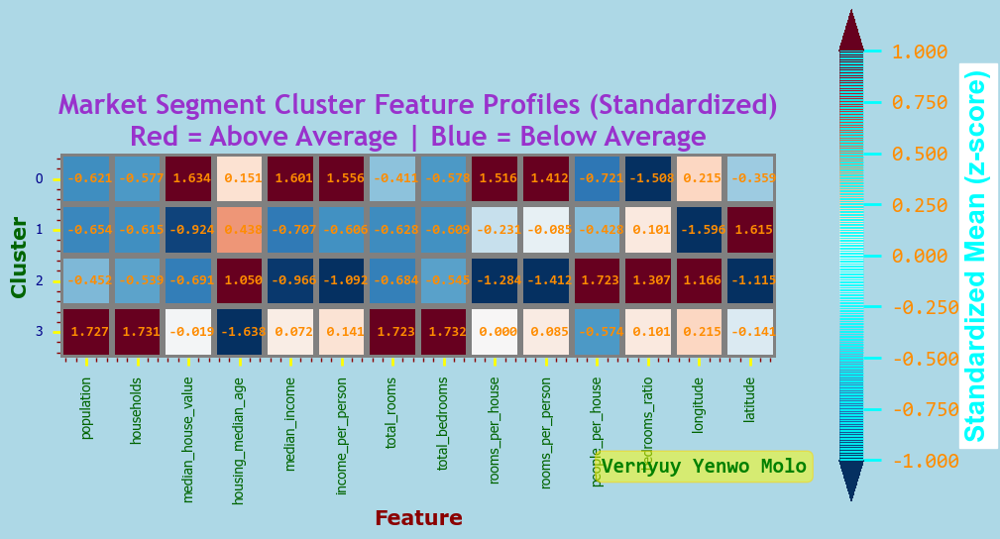

In [85]:
# Heatmap - Market Segment Cluster Feature Profiles (Standardized) Red = Above Average | Blue = Below Average

# Import library
from sklearn.preprocessing import StandardScaler

# Build profile (mean of each feature per cluster)

# Define numerical features
num_values = ['population', 'households', 'median_house_value', 'housing_median_age', 'median_income', 'income_per_person', 
            'total_rooms', 'total_bedrooms', 'rooms_per_house', 'rooms_per_person', 'people_per_house',  'bedrooms_ratio', 'longitude', 'latitude']

# Call numerical feautues under new name
profile_features = num_values

# Standardize the cluster means so we can compare on the same scale
scaler = StandardScaler()
heatmap_data = pd.DataFrame(
    scaler.fit_transform(cluster_profile_4[profile_features]),
    index=cluster_profile_4.index,
    columns=profile_features
)

#==#

# Figure properties
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(21,8),layout='constrained',facecolor='lightblue',dpi=100)

#==#

# Format colobar value
# fmt = lambda x,pos: ' £{:,.0f}'.format(x) # £
# fmt = lambda x,pos: ' ${:,.0f}'.format(x) # $
fmt = lambda x,pos: '{:,.3f}'.format(x) # Count

#==#

# Keyword arguements for plot appearance
annot_kws = dict(family='consolas',size=10,style='normal',weight='bold',color='darkorange',alpha=1,rotation=0,ha='center',va='center',) # backgroundcolor='pink')
cbar_kws = {"orientation":"vertical","shrink":0.5,'extend':'both','extendfrac':0.1,"drawedges":True,'label':'Standardized Mean (z-score)','format':fmt,}
kwargs = {'linewidths':4,'linecolor':'gray','linestyle':'dashed','alpha':1,}#'rasterized':True,'edgecolor':'pink',"capstyle":'projecting','linewidth':2}

#==#

# Create a mask using numpy's triu function
mask = np.triu(np.ones_like(heatmap_data, dtype=bool))

#==#

# Create heatmap of 'features' vs 'cluster' By 'mean'. ['copper_r',summer','Blues','Oranges,'pink_r','YlGn','YlOrBr','YlGnBu','hot_r','GnBu_r', 'RdBu_r]
ax = sns.heatmap(heatmap_data,vmin=-1,vmax=1,cmap='RdBu_r',center=None,robust=True,annot=True,fmt='.3f',annot_kws=annot_kws,
cbar=True,cbar_kws=cbar_kws,cbar_ax=None,square=True,xticklabels='auto',yticklabels='auto',mask=None,ax=ax,**kwargs) # fmt must be in string format. # centre=True (No gradient)#

#==#

# ax.figure.set_size_inches(40, 20)
# ax.figure.set_size_inches(21, 8) # cbar_kws("shrink":0.9)
# ax.figure.set_size_inches(15, 7.5)
ax.figure.set_size_inches(10, 10) # cbar_kws("shrink":0.5)
# ax.figure.set_size_inches(8, 11)
ax.set_title('Market Segment Cluster Feature Profiles (Standardized)\nRed = Above Average | Blue = Below Average', loc='center', fontdict=title_font)
ax.set_xlabel('Feature', loc='center', fontdict=x_label_font)
ax.set_ylabel('Cluster', loc='center', fontdict=y_label_font)
ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=90)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=10, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
ax.minorticks_on()
plt.tight_layout

#==#

# Change colobar font properties

# Use matplotlib.colorbar.Colorbar object
cbar = ax.collections[0].colorbar
# here to set the labelsize by 15
cbar.ax.tick_params(axis='y',length=13,width=2,color='cyan',direction='out',labelsize=15,labelcolor='darkorange',labelfontfamily='consolas',labelrotation=None)

# Change colobar label properties
ax.figure.axes[-1].yaxis.label.set_fontname('sans serif')
ax.figure.axes[-1].yaxis.label.set_fontsize(20)
ax.figure.axes[-1].yaxis.label.set_fontstyle('normal')
ax.figure.axes[-1].yaxis.label.set_fontweight('bold')
ax.figure.axes[-1].yaxis.label.set_color('cyan')
ax.figure.axes[-1].yaxis.label.set_backgroundcolor('white')

#==#

# Manually format the annotations with £/$/Count
for text in ax.texts:
    # text.set_text(f"£ {float(text.get_text()):,.0f}") # £
    # text.set_text(f" ${float(text.get_text()):,.0f}") # $
    text.set_text(f" {float(text.get_text()):,.3f}") # Count
    # text.set_fontsize(10)
    # text.set_fontweight('bold')

#==#

# Add signature to figure in bbox round format
ax.text(0.90, -0.58,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_14_Market_Segment_Cluster_Feature_Profiles_(Standardized)_Heatmap.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Display the plot
plt.show()

**`🧾 Display Housing Market Segment Cluster Summary (Mean Values Per Segment)`**.

In [86]:
# Define cluster names (Revised)
cluster_names = {
    0: '🏆 Affluent SoCal Coastal',   # MI: $5.6k, MHV: $296k,  $r = 1
    1: '🌊 Affordable SoCal Coastal', # MI: $3.2k, MHV: $153k , $r = 4
    2: '🏡 Inland NorCal Budget',     # MI: $2.9k, MHV: $166k,  $r = 3 
    3: '🏙️ Urban Mid-Range',          # MI: $4k,   MHV: $203k,  $r = 2
}

#==#

print("\n" + "=" * 80)
print("MARKET SEGMENT SUMMARY")
print("=" * 80)

# Display Market Segment Summary
for cluster_id, name in cluster_names.items():
    row = cluster_profile_4.loc[cluster_id]
    print(f"\n🏷️  Cluster {cluster_id}: {name}")
    print(f"   📊 Size: {int(row['count']):,} households ({row['pct_of_total']}% of market)")
    print(f"   💰 Median Income: ${row['median_income']:,.2f} (×\$10,000)")
    print(f"   🏠 Median Home Value: ${row['median_house_value']:,.0f}")
    print(f"   🏗️ Median Age: {row['housing_median_age']:,.0f} years")
    print(f"   👥 People per House: {row['people_per_house']:,.2f}")
    print(f"   🚪 Rooms per House: {row['rooms_per_house']:,.2f}")

print("\n" + "=" * 80)
print(f"TOTAL: {int(cluster_profile_4['count'].sum()):,} households across {len(cluster_profile_4)} segments")
print("=" * 80)


MARKET SEGMENT SUMMARY

🏷️  Cluster 0: 🏆 Affluent SoCal Coastal
   📊 Size: 4,210 households (24.1% of market)
   💰 Median Income: $5,672.18 (×\$10,000)
   🏠 Median Home Value: $295,274
   🏗️ Median Age: 25 years
   👥 People per House: 2.76
   🚪 Rooms per House: 6.74

🏷️  Cluster 1: 🌊 Affordable SoCal Coastal
   📊 Size: 5,435 households (31.1% of market)
   💰 Median Income: $3,250.21 (×\$10,000)
   🏠 Median Home Value: $153,716
   🏗️ Median Age: 27 years
   👥 People per House: 2.82
   🚪 Rooms per House: 5.38

🏷️  Cluster 2: 🏡 Inland NorCal Budget
   📊 Size: 6,588 households (37.7% of market)
   💰 Median Income: $2,977.59 (×\$10,000)
   🏠 Median Home Value: $166,632
   🏗️ Median Age: 30 years
   👥 People per House: 3.26
   🚪 Rooms per House: 4.56

🏷️  Cluster 3: 🏙️ Urban Mid-Range
   📊 Size: 1,250 households (7.1% of market)
   💰 Median Income: $4,067.74 (×\$10,000)
   🏠 Median Home Value: $203,814
   🏗️ Median Age: 15 years
   👥 People per House: 2.79
   🚪 Rooms per House: 5.56

TOTAL:

**`📊 Scatterplot - Four Faces Of The California Housing Market: From The LA Basin To The Sierra Nevada — A KMeans + PCA Story`**.

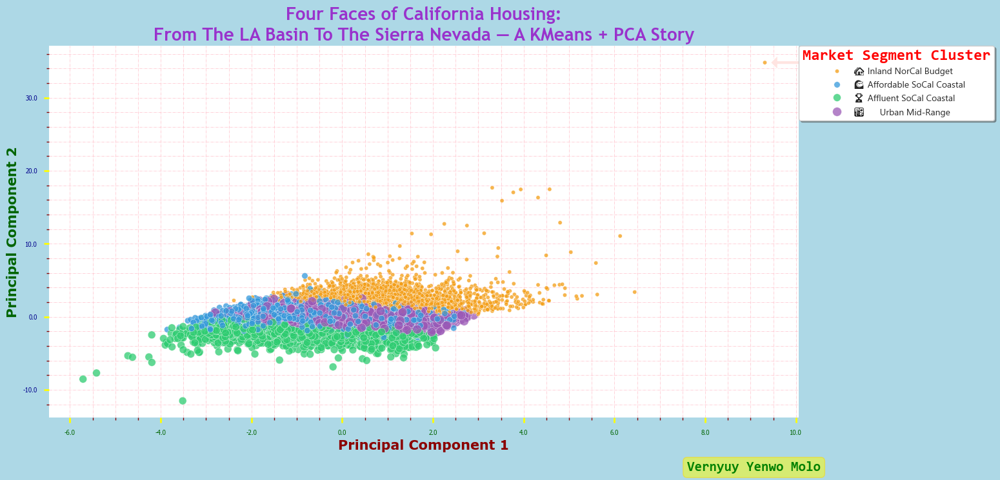

In [87]:
# Scatterplot - Four Faces Of The California Housing Market: From The LA Basin To The Sierra Nevada — A KMeans + PCA Story

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Step 1: Create a copy to preserve rfm_df
pca_df2 = cleaned_housing.copy()

#==#

# Step 2: Select only numerical features
num_features = pca_df2[['population', 'households', 'total_rooms', 'total_bedrooms', 'people_per_house', 'rooms_per_house', 'rooms_per_person', 
                        'income_per_person', 'bedrooms_ratio', 'housing_median_age', 'median_income', 'median_house_value', 'longitude', 'latitude']]
#==#

# Step 3: Standardise/Scale the data
scaler = StandardScaler()
pca_df2_scaled = scaler.fit_transform(num_features)

#==#

# Step 4: Apply/Fit KMeans with optimal k
optimal_k = 5  # New optimal k
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
pca_df2['market_segment_cluster'] = kmeans.fit_predict(pca_df2_scaled) # .astype(str)

#==#

# Step 5: Rename the cluster column to something intuitive (optional)
pca_df2['market_segment_cluster'] = pca_df2['market_segment_cluster'].astype(str)  # convert to string for plotting

#==#

# Step 6: Reduce marketing strategy features to 2D & visualize with PCA
pca_reducer = PCA(n_components=2)
market_strategy_pca = pca_reducer.fit_transform(pca_df2_scaled)
pca_df2['PCA1'] = market_strategy_pca[:, 0]
pca_df2['PCA2'] = market_strategy_pca[:, 1]

#==#

# Step 7: Define cluster names, custom palette , hue order, cluster order & market segment name

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Affluent SoCal Coastal',   # MI: $5.6k, MHV: $296k,  $r = 1
    '1': '🌊 Affordable SoCal Coastal', # MI: $3.2k, MHV: $153k , $r = 4
    '2': '🏡 Inland NorCal Budget',     # MI: $2.9k, MHV: $166k,  $r = 3
    '3': '🏙️ Urban Mid-Range',          # MI: $4k,   MHV: $203k,  $r = 2
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Affluent SoCal Coastal':     '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🌊 Affordable SoCal Coastal':   '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue
    '🏡 Inland NorCal Budget':       '#f39c12',    # Orange — inland warmth,  '#D68910',  # Mustard, '#F8C471',  # Peach 
    '🏙️ Urban Mid-Range':            '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender
}

# Define hue order (Revised)
hue_order = [
    '🏡 Inland NorCal Budget', # 1
    '🌊 Affordable SoCal Coastal', # 2
    '🏆 Affluent SoCal Coastal', # 3
    '🏙️ Urban Mid-Range', # 4
]

#==#

# Define cluster order
# cluster_order = ['0','1','2','3'] # hot_r
# cluster_order = ['1','0','2','3'] # hot_r
# cluster_order = ['3','2','0','1'] # Set1
cluster_order = [str(i) for i in range(optimal_k)]

# Define market segment name
pca_df2['market_segment_name'] = pca_df2['market_segment_cluster'].map(cluster_names)

#==#

# Step 8: Prepare plot
fig, pca2 = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

# Step 9: Plot 'PCA1' vs 'PCA2'
sns.scatterplot(data=pca_df2,x='PCA1',y='PCA2',hue='market_segment_name',size='market_segment_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(100,20),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=pca2,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety
# hue_order=list(cluster_names.values())

#==#

# Step 10: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
pca2.figure.set_size_inches(15, 7.5)
# pca2.figure.set_size_inches(20, 7.5)
pca2.set_title('Four Faces of California Housing:' + '\nFrom The LA Basin To The Sierra Nevada — A KMeans + PCA Story',loc='center',fontdict=title_font)
pca2.set_xlabel('Principal Component 1',loc='center',fontdict=x_label_font)
pca2.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
# pca2.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# pca2.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# pca2.set_xticks([,])
pca2.set_ylabel('Principal Component 2',loc='center',fontdict=y_label_font)
pca2.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
# pca2.yaxis.set_major_formatter(StrMethodFormatter(' £ {x:,}')) # £/$
# pca2.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# pca2.set_yticks([,])

# pca2.tick_params(axis='both',colors='chocolate',direction='out',length=13,width=5,labelsize='medium',labelcolor='darkblue',labelfontfamily='tahoma',labelrotation=None,grid_linewidth=1)
pca2.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
pca2.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
pca2.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
pca2.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

pca2.minorticks_on()

pca2.spines[['top','right']].set_visible(False)
pca2.spines[['bottom','left']].set_visible(False)

pca2.set_facecolor('white')

pca2.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# pca2.autoscale()
# pca2.axis('equal')
# pca2.set_xlim(left=0)
# pca2.set_ylim(bottom=0)
# pca2.set_xscale('log')
# pca2.set_yscale('log')
# pca2.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = pca2.legend(loc='best',bbox_to_anchor=(1, 1),borderaxespad=0,title='Market Segment Cluster',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 11: Automatically Annotate The Minumum & Maximum Value

# PCA1 and PCA2 Extraction
xvalues = pca_df2['PCA1'].values    # or use .iloc below
yvalues = pca_df2['PCA2'].values

# # Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
pca2.annotate(f'Min PCA: {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-3.0,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
pca2.annotate(f'Max PCA: {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+3.0,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 11: Add signature to figure in bbox round format
pca2.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=pca2.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_15_CAL_Housing_Segments_KMeans_PCA_Excluding_Anomalies_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display the plot
plt.show()


##### `🏡✨💰 California Housing: Market Segment Profiling`.

**`Define market_segment_cluster function`**.

In [88]:
# Define market_segment_cluster function (Revised)
def market_segment_cluster(row):
    if row['market_segment_cluster'] == 0:
        return '🏆 Affluent SoCal Coastal'
    elif row['market_segment_cluster'] == 1:
        return '🌊 Affordable SoCal Coastal'       
    elif row['market_segment_cluster'] == 2:
        return '🏡 Inland NorCal Budget'          
    elif row['market_segment_cluster'] == 3:
        return '🏙️ Urban Mid-Range'          
    else:
       return 'Unknown'

cleaned_housing['market_segment_cluster_name'] = cleaned_housing.apply(market_segment_cluster, axis=1)

#==#

# # Define market_segment_cluster function (Revised)
# def market_segment_cluster(row):
#     if row['market_segment_cluster'] == 0:
#         return '🏡 Inland NorCal Budget'        
#     elif row['market_segment_cluster'] == 1:
#         return '🌊 Affordable SoCal Coastal'       
#     elif row['market_segment_cluster'] == 2:
#         return '🏆 Affluent SoCal Coastal'         
#     elif row['market_segment_cluster'] == 3:
#         return '🏙️ Urban Mid-Range'          
#     elif row['market_segment_cluster'] == 4:
#         return '🌲 Sierra Nevada Resort'          # rooms_per_house = 31
#     else:
#        return 'Unknown'

# cleaned_housing['market_segment_cluster_name'] = cleaned_housing.apply(market_segment_cluster, axis=1)

#==#

# # Define market_segment_cluster function
# def market_segment_cluster(row):
#     if row['market_segment_cluster'] == 0:
#         return '🏆 Affluent SoCal Coastal'       
#     elif row['market_segment_cluster'] == 1:
#         return '🏙️ Urban Mid-Range'               
#     elif row['market_segment_cluster'] == 2:
#         return '🌊 Affordable SoCal Coastal'     
#     elif row['market_segment_cluster'] == 3:
#         return '🏡 Inland NorCal Budget'          
#     elif row['market_segment_cluster'] == 4:
#         return '🌲 Sierra Nevada Resort' 
#     else:
#         return 'Unknown'

# cleaned_housing['market_segment_cluster_name'] = cleaned_housing.apply(market_segment_cluster, axis=1)

#==#

# # Cluster name order
# cluster_names = {
#     0: '🏡 Inland NorCal Budget',     # MI: $2.9k, MHV: $165k,  $r = 4
#     1: '🌊 Affordable SoCal Coastal', # MI: $3.2k, MHV: $153k , $r = 5
#     2: '🏆 Affluent SoCal Coastal',   # MI: $5.6k, MHV: $296k,  $r = 1
#     3: '🏙️ Urban Mid-Range',          # MI: $4k,   MHV: $203k,  $r = 2
#     4: '🌲 Sierra Nevada Resort',     # MI: $3.4k, MHV: $166k,  $r = 3
# }

**`Display Dataframe Column Names`**.

In [89]:
# Display dataframe column names.
cleaned_housing.columns

Index(['longitude', 'latitude', 'population', 'households', 'total_rooms',
       'total_bedrooms', 'people_per_house', 'rooms_per_house',
       'rooms_per_person', 'income_per_person', 'bedrooms_ratio',
       'housing_median_age', 'median_income', 'median_house_value',
       'ocean_proximity', 'MHV_cluster', 'MHV_cluster_name', 'price_cluster',
       'price_cluster_name', 'wealth_cluster', 'wealth_cluster_name',
       'geo_cluster', 'geo_cluster_name', 'market_segment_cluster',
       'market_segment_cluster_name'],
      dtype='str')

**`Display First Two Rows`**.

In [90]:
# Display first two rows
cleaned_housing.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name,wealth_cluster,wealth_cluster_name,geo_cluster,geo_cluster_name,market_segment_cluster,market_segment_cluster_name
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget


##### `🏡✨🏦 California Housing: Cluster Investment Strategy Profiling`.

**`⧉ Copy Dataframe To Preserve Changes`**.

In [91]:
# Copy dataframe to preserve changes.
housing_strategy_df = cleaned_housing.copy()

**`Map Risk, Return & Best Strategy To Each Property Based On Housing Tier`**.

In [92]:
# Step 1: Define Investment Strategy & Risk Profile Mapping
strategy_map = {
    '🏆 Premium': {
        'Risk': 'Low',
        'Return': 'High',
        'Best Strategy': 'Premium Buy & Hold',

    },
    '🏡 Mid Range': {
        'Risk': 'Low-Medium',
        'Return': 'Medium',
        'Best Strategy': 'Volume Investment (Fix & Flip)',

    },
    '🏘️ Budget': {
        'Risk': 'Medium',
        'Return': 'Low-Medium',
        'Best Strategy': 'Affordable Development',

    },
}

# Step 2: Map Risk, Return & Best Strategy To Each Property Based On Housing Tier
housing_strategy_df['Risk'] = housing_strategy_df['MHV_cluster_name'].map(lambda x: strategy_map[x]['Risk'])
housing_strategy_df['Return'] = housing_strategy_df['MHV_cluster_name'].map(lambda x: strategy_map[x]['Return'])
housing_strategy_df['Best Strategy'] = housing_strategy_df['MHV_cluster_name'].map(lambda x: strategy_map[x]['Best Strategy'])
housing_strategy_df.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name,wealth_cluster,wealth_cluster_name,geo_cluster,geo_cluster_name,market_segment_cluster,market_segment_cluster_name,Risk,Return,Best Strategy
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget,Low,High,Premium Buy & Hold
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget,Low,High,Premium Buy & Hold


**`Display Dataframe Columns`**.

In [93]:
# Display dataframe columns
housing_strategy_df.columns

Index(['longitude', 'latitude', 'population', 'households', 'total_rooms',
       'total_bedrooms', 'people_per_house', 'rooms_per_house',
       'rooms_per_person', 'income_per_person', 'bedrooms_ratio',
       'housing_median_age', 'median_income', 'median_house_value',
       'ocean_proximity', 'MHV_cluster', 'MHV_cluster_name', 'price_cluster',
       'price_cluster_name', 'wealth_cluster', 'wealth_cluster_name',
       'geo_cluster', 'geo_cluster_name', 'market_segment_cluster',
       'market_segment_cluster_name', 'Risk', 'Return', 'Best Strategy'],
      dtype='str')

**`Display First Two Rows`**.

In [94]:
# Display first two rows.
housing_strategy_df.head(2)

,longitude,latitude,population,households,total_rooms,total_bedrooms,people_per_house,rooms_per_house,rooms_per_person,income_per_person,bedrooms_ratio,housing_median_age,median_income,median_house_value,ocean_proximity,MHV_cluster,MHV_cluster_name,price_cluster,price_cluster_name,wealth_cluster,wealth_cluster_name,geo_cluster,geo_cluster_name,market_segment_cluster,market_segment_cluster_name,Risk,Return,Best Strategy
0,-122.23,37.88,322.0,126.0,880.0,129.0,2.555556,6.984127,2.732919,3257.686957,0.146591,41.0,8325.2,452600.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget,Low,High,Premium Buy & Hold
1,-122.22,37.86,2401.0,1138.0,7099.0,1106.0,2.109842,6.238137,2.956685,3934.607747,0.155797,21.0,8301.4,358500.0,NEAR BAY,1,🏆 Premium,1,🏆 Affluent Districts,1,🏰 Luxury Zones,0,Northern California,2,🏡 Inland NorCal Budget,Low,High,Premium Buy & Hold


##### `📊 Histogram - Distribution Of California Housing Features (Excluding Anomalies)`.

In [95]:
# # ═══════════════════════════════════════════
# #   Global Cutoff 1 — Pre Training Pipeline
# # ═══════════════════════════════════════════

# # Step 1: Start With Raw Housing Data
# print(f"Original Dataset Size : {len(housing_strategy_df):,}")

# #==#

# # Step 2: Define Global Cutoff Bounds
# lower_cutoff = housing_strategy_df['median_house_value'].quantile(0.05)
# upper_cutoff = housing_strategy_df['median_house_value'].quantile(0.95)

# print(f"Lower Cutoff (5th pctl) : ${lower_cutoff:,.0f}")
# print(f"Upper Cutoff (95th pctl): ${upper_cutoff:,.0f}")

# #==#

# # Step 3: Apply Global Cutoff
# housing_clean_1 = housing_strategy_df[
#     (housing_strategy_df['median_house_value'] >= lower_cutoff) &
#     (housing_strategy_df['median_house_value'] <= upper_cutoff)
# ]

# #==#

# # Step 4: Summary
# print(f"""
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
#      Global Cutoff Summary
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Original Size  : {len(housing_strategy_df):,.0f}
# Clean Size     : {len(housing_clean_1):,}
# Rows Removed   : {len(housing_strategy_df) - len(housing_clean_1):,.0f}
# Lower Cutoff   : ${lower_cutoff:,.0f}
# Upper Cutoff   : ${upper_cutoff:,.0f}
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# """)

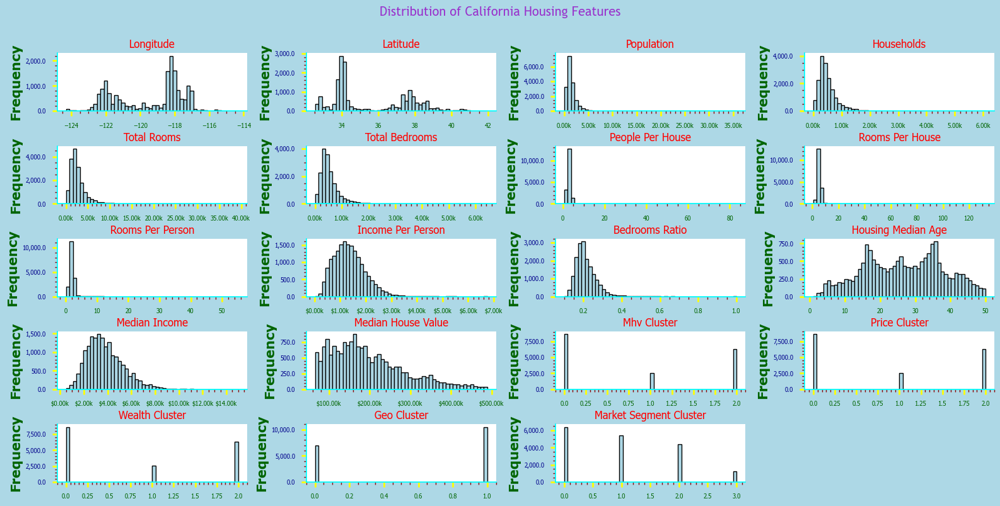

In [96]:
# Step 1: Plot histograms and capture the returned axes
axes = housing_strategy_df.hist(bins=50, figsize=(16, 8), color='lightblue', edgecolor='black')

# Step 2: Define $k formatter function
def dollar_k_formatter(x, pos):
    return f'${x/1000:,.2f}k'    # e.g. \$100k, \$200k

# Step 3: Define count k formatter function
def count_k_formatter(x, pos):
    return f'{x/1000:,.2f}k'    # e.g. \100k, \200k

# Step 4: Define count formatter function
def count_formatter(x, pos):
    return f'{x:,.2f}'  

# Step 5: Define specific columns and their formatters
currency_cols = ['median_income', 'median_house_value', 'income_per_person']   # $k format
# percent_cols  = [] # % format
non_currency_cols  = ['population', 'households', 'total_rooms', 'total_bedrooms'] # count k format
cluster_cols  = ['MHV_cluster', 'price_cluster', 'wealth_cluster', 'geo_clsuter', 'market_segment'] # count format

# Step 5: Add ylabel to each subplot
for hist3 in axes.flatten():
    col_name = hist3.get_title()  # 👈 Get column name from subplot title
    if hist3.has_data():
        hist3.set_title(col_name.replace('_', ' ').title(), family='tahoma', color='red') # .upper(), .lower()
        # hist3.set_xlabel(col_name.replace('_', ' ').title(), fontdict=x_label_font)
        hist3.set_ylabel('Frequency', fontdict=y_label_font)
        hist3.yaxis.set_major_formatter(StrMethodFormatter('{x:,}')) #
        hist3.minorticks_on()
        hist3.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
        hist3.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
        hist3.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
        hist3.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')
        # hist3.autoscale()
        # hist3.axis('equal')
        # hist3.set_xlim(left=0)
        # hist3.set_ylim(bottom=0)
        # hist3.set_xscale('log')
        # hist3.set_yscale('log')
        # hist3.set_yscale('linear')  # Try removing log scale
    
    # Step 7: Apply specific x-axis formatters based on column name
    if col_name in currency_cols:
            # hist3.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}'))   # $ format
            hist3.xaxis.set_major_formatter(FuncFormatter(dollar_k_formatter))  # $k format
    elif col_name in non_currency_cols:
            # hist3.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))     # count format
            hist3.xaxis.set_major_formatter(FuncFormatter(count_k_formatter))  # count k format
    elif col_name in cluster_cols:
        hist3.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))     # count format
        #hist3.xaxis.set_major_formatter(FuncFormatter(count_formatter))  # count format

# Step 8: Plot subplot title
plt.suptitle("Distribution of California Housing Features", fontdict=title_font, x=0.5, y=1.00) # Overview of Housing Dataset Variables, Statistical Distribution of Housing Attributes

# Step 9: Adjust subplot params
plt.tight_layout(pad=1, h_pad=0.3, w_pad=0.3, rect=None)

#==#

# Step 10: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_16_Distribution_Of_CAL_Housing_Features_Exclusing_Anomalies_Histplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 10: Display plot
plt.show()

##### `🧮 California Housing: Analysis Of Cluster Statistics`.

`MHV Cluster/Cluster Name Median House Value Statistics`.

In [97]:
# MHV Cluster/Cluster Name Median House Value Statistics.
housing_strategy_df.groupby(['MHV_cluster', 'MHV_cluster_name'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,MHV_cluster,MHV_cluster_name,min,max,median,mean,size,sum
0,1,🏆 Premium,296900.0,489800.0,353600.0,366273.48,2538,9.296021e+08
1,2,🏡 Mid Range,175700.0,296800.0,223900.0,226860.87,6318,1.433307e+09
2,0,🏘️ Budget,66200.0,175600.0,125000.0,123818.01,8627,1.068178e+09


`Price Cluster/Cluster Name Median House Value Statistics`.

In [98]:
# Price Cluster/Cluster Name Median House Value Statistics.
housing_strategy_df.groupby(['price_cluster', 'price_cluster_name'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,price_cluster,price_cluster_name,min,max,median,mean,size,sum
0,1,🏆 Affluent Districts,296600.0,489800.0,353600.0,366109.36,2544,9.313822e+08
1,2,🏡 Middle Class Suburbs,175400.0,296400.0,223800.0,226697.11,6324,1.433632e+09
2,0,🏘️ Affordable Neighborhoods,66200.0,175300.0,125000.0,123746.07,8615,1.066072e+09


`Wealth Cluster/Cluster Name Median House Value Statistics`.

In [99]:
# Wealth Cluster/Cluster Name Median House Value Statistics.
housing_strategy_df.groupby(['wealth_cluster', 'wealth_cluster_name'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,wealth_cluster,wealth_cluster_name,min,max,median,mean,size,sum
0,1,🏰 Luxury Zones,296600.0,489800.0,353600.0,366109.36,2544,9.313822e+08
1,2,🏠 Comfortable Living,175400.0,296400.0,223800.0,226697.11,6324,1.433632e+09
2,0,🏘️ Budget Communities,66200.0,175300.0,125000.0,123746.07,8615,1.066072e+09


`Geo Cluster/Cluster Name Median House Value Statistics`.

In [100]:
# Geo Cluster/Cluster Name Median House Value Statistics.
housing_strategy_df.groupby(['geo_cluster', 'geo_cluster_name'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
.sort_values(by='median', ascending=False).round(2).reset_index()

,geo_cluster,geo_cluster_name,min,max,median,mean,size,sum
0,1,Southern California,66200.0,489800.0,183200.0,201569.36,10510,2.118494e+09
1,0,Northern California,66200.0,489600.0,164600.0,188239.37,6973,1.312593e+09


`Market Segment Cluster/Cluster Name Median House Value Statistics`.

In [101]:
# Market Segment Cluster/Cluster Name Median House Value Statistics.
housing_strategy_df.groupby(['market_segment_cluster', 'market_segment_cluster_name'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
.sort_values(by='median', ascending=False).round(2).reset_index()

,market_segment_cluster,market_segment_cluster_name,min,max,median,mean,size,sum
0,2,🏡 Inland NorCal Budget,67500.0,489800.0,284950.0,293244.53,4368,1.280892e+09
1,3,🏙️ Urban Mid-Range,66600.0,483300.0,189800.0,204260.78,1257,2.567558e+08
2,0,🏆 Affluent SoCal Coastal,66300.0,475000.0,159500.0,164786.19,6415,1.057103e+09
3,1,🌊 Affordable SoCal Coastal,66200.0,489600.0,138500.0,153653.46,5443,8.363358e+08


`MHV Cluster/Cluster Name and Ocean Proximity Median House Value Statistics`.

In [102]:
# MHV Cluster/Cluster Name and Ocean Proximity Median House Value Statistics.
housing_strategy_df.groupby(['MHV_cluster', 'MHV_cluster_name', 'ocean_proximity'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,MHV_cluster,MHV_cluster_name,ocean_proximity,min,max,median,mean,size,sum
0,1,🏆 Premium,NEAR OCEAN,297700.0,488900.0,362300.0,370545.66,519,192313200.0
1,1,🏆 Premium,NEAR BAY,297300.0,489600.0,358800.0,371032.39,355,131716500.0
2,1,🏆 Premium,<1H OCEAN,297100.0,489800.0,350900.0,364073.15,1490,542469000.0
3,1,🏆 Premium,INLAND,296900.0,486800.0,350350.0,362663.22,174,63103400.0
4,2,🏡 Mid Range,NEAR OCEAN,175700.0,296600.0,236500.0,236359.69,913,215796400.0
5,2,🏡 Mid Range,<1H OCEAN,175700.0,296800.0,223400.0,226439.91,4009,907797600.0
6,2,🏡 Mid Range,NEAR BAY,175900.0,295300.0,220200.0,226192.64,625,141370400.0
7,2,🏡 Mid Range,INLAND,175700.0,295500.0,213300.0,218343.19,771,168342600.0
8,0,🏘️ Budget,<1H OCEAN,67500.0,175600.0,147700.0,140777.96,2768,389673400.0
9,0,🏘️ Budget,NEAR BAY,67500.0,175500.0,136200.0,130715.02,566,73984700.0


`Price Cluster/Cluster Name and Ocean Proximity Median House Value Statistics`.

In [103]:
# Price Cluster/Cluster Name and Ocean Proximity Median House Value Statistics.
housing_strategy_df.groupby(['price_cluster', 'price_cluster_name', 'ocean_proximity'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,price_cluster,price_cluster_name,ocean_proximity,min,max,median,mean,size,sum
0,1,🏆 Affluent Districts,NEAR OCEAN,296600.0,488900.0,362200.0,370403.46,520,192609800.0
1,1,🏆 Affluent Districts,NEAR BAY,297300.0,489600.0,358800.0,371032.39,355,131716500.0
2,1,🏆 Affluent Districts,<1H OCEAN,296600.0,489800.0,350600.0,363847.83,1495,543952500.0
3,1,🏆 Affluent Districts,INLAND,296900.0,486800.0,350350.0,362663.22,174,63103400.0
4,2,🏡 Middle Class Suburbs,NEAR OCEAN,175500.0,296300.0,236200.0,236160.72,914,215850900.0
5,2,🏡 Middle Class Suburbs,<1H OCEAN,175400.0,296400.0,223250.0,226276.03,4010,907366900.0
6,2,🏡 Middle Class Suburbs,NEAR BAY,175400.0,295300.0,220100.0,226030.78,627,141721300.0
7,2,🏡 Middle Class Suburbs,INLAND,175400.0,295500.0,213200.0,218232.08,773,168693400.0
8,0,🏘️ Affordable Neighborhoods,<1H OCEAN,67500.0,175300.0,147550.0,140702.61,2762,388620600.0
9,0,🏘️ Affordable Neighborhoods,NEAR BAY,67500.0,175200.0,136000.0,130556.38,564,73633800.0


`Wealth Cluster/Cluster Name and Ocean Proximity Median House Value Statistics`.

In [104]:
# Wealth Cluster/Cluster Name and Ocean Proximity Median House Value Statistics.
housing_strategy_df.groupby(['wealth_cluster', 'wealth_cluster_name', 'ocean_proximity'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,wealth_cluster,wealth_cluster_name,ocean_proximity,min,max,median,mean,size,sum
0,1,🏰 Luxury Zones,NEAR OCEAN,296600.0,488900.0,362200.0,370403.46,520,192609800.0
1,1,🏰 Luxury Zones,NEAR BAY,297300.0,489600.0,358800.0,371032.39,355,131716500.0
2,1,🏰 Luxury Zones,<1H OCEAN,296600.0,489800.0,350600.0,363847.83,1495,543952500.0
3,1,🏰 Luxury Zones,INLAND,296900.0,486800.0,350350.0,362663.22,174,63103400.0
4,2,🏠 Comfortable Living,NEAR OCEAN,175500.0,296300.0,236200.0,236160.72,914,215850900.0
5,2,🏠 Comfortable Living,<1H OCEAN,175400.0,296400.0,223250.0,226276.03,4010,907366900.0
6,2,🏠 Comfortable Living,NEAR BAY,175400.0,295300.0,220100.0,226030.78,627,141721300.0
7,2,🏠 Comfortable Living,INLAND,175400.0,295500.0,213200.0,218232.08,773,168693400.0
8,0,🏘️ Budget Communities,<1H OCEAN,67500.0,175300.0,147550.0,140702.61,2762,388620600.0
9,0,🏘️ Budget Communities,NEAR BAY,67500.0,175200.0,136000.0,130556.38,564,73633800.0


`Geo Cluster/Cluster Name and Ocean Proximity Median House Value Statistics`.

In [105]:
# Geo Cluster/Cluster Name and Ocean Proximity Median House Value Statistics.
housing_strategy_df.groupby(['geo_cluster', 'geo_cluster_name', 'ocean_proximity'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
.sort_values(by='median', ascending=False).round(2).reset_index()

,geo_cluster,geo_cluster_name,ocean_proximity,min,max,median,mean,size,sum
0,0,Northern California,NEAR OCEAN,66800.0,487100.0,267350.0,264996.21,712,1.886773e+08
1,0,Northern California,<1H OCEAN,67500.0,485300.0,234500.0,238297.68,1467,3.495827e+08
2,0,Northern California,NEAR BAY,67500.0,489600.0,204800.0,224496.51,1546,3.470716e+08
3,1,Southern California,<1H OCEAN,67500.0,489800.0,200000.0,219170.19,6800,1.490357e+09
4,1,Southern California,NEAR OCEAN,67500.0,488900.0,183000.0,208563.49,1583,3.301560e+08
5,1,Southern California,INLAND,66200.0,486800.0,119900.0,140094.36,2127,2.979807e+08
6,0,Northern California,INLAND,66200.0,485400.0,116950.0,131546.03,3248,4.272615e+08


`Market Segment Cluster/Cluster Name and Ocean Proximity Median House Value Statistics`.

In [106]:
# Market Segment Cluster/Cluster Name and Ocean Proximity Median House Value Statistics.
housing_strategy_df.groupby(['market_segment_cluster', 'market_segment_cluster_name', 'ocean_proximity'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
.sort_values(by='median', ascending=False).round(2).reset_index()

,market_segment_cluster,market_segment_cluster_name,ocean_proximity,min,max,median,mean,size,sum
0,2,🏡 Inland NorCal Budget,NEAR BAY,166300.0,489000.0,345000.0,343937.54,349,120034200.0
1,2,🏡 Inland NorCal Budget,NEAR OCEAN,87500.0,488900.0,329400.0,325013.93,639,207683900.0
2,2,🏡 Inland NorCal Budget,<1H OCEAN,110000.0,489800.0,283400.0,295365.42,2710,800440300.0
3,3,🏙️ Urban Mid-Range,NEAR OCEAN,88300.0,450400.0,247800.0,255936.19,105,26873300.0
4,3,🏙️ Urban Mid-Range,NEAR BAY,102700.0,441100.0,240300.0,247100.93,107,26439800.0
5,1,🌊 Affordable SoCal Coastal,NEAR OCEAN,66800.0,457700.0,238000.0,221362.08,501,110902400.0
6,3,🏙️ Urban Mid-Range,<1H OCEAN,70000.0,483300.0,227500.0,235790.74,551,129920700.0
7,0,🏆 Affluent SoCal Coastal,NEAR BAY,225000.0,225000.0,225000.0,225000.00,2,450000.0
8,2,🏡 Inland NorCal Budget,INLAND,67500.0,486800.0,214550.0,227960.75,670,152733700.0
9,1,🌊 Affordable SoCal Coastal,<1H OCEAN,67500.0,450000.0,190900.0,193721.46,876,169700000.0


`MHV Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity`.

In [107]:
# MHV Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.
mhv = pd.crosstab(
    index=[housing_strategy_df['MHV_cluster'], housing_strategy_df['MHV_cluster_name']], # index=housing_strategy_df['MHV_cluster'],
    columns=housing_strategy_df['ocean_proximity'], 
    values=housing_strategy_df['median_house_value'],
    aggfunc='median',
    margins=True,
    margins_name='% TOTAL',
    normalize=True
).rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)

# Separate, sort, reattach
perc_tot_sorted_1 = (
    mhv.drop('% TOTAL')                              # Exclude margins row
     .sort_values(by='% TOTAL', ascending=False)     # Sort data rows only
     .pipe(lambda x: pd.concat([x, mhv.loc[['% TOTAL']]]))  # Reattach at bottom
)

perc_tot_sorted_1

,,<1H OCEAN,INLAND,NEAR BAY,NEAR OCEAN,% TOTAL
MHV_cluster,MHV_cluster_name,,,,,
1,🏆 Premium,0.12,0.12,0.13,0.13,0.50
2,🏡 Mid Range,0.08,0.08,0.08,0.08,0.32
0,🏘️ Budget,0.05,0.04,0.05,0.05,0.18
% TOTAL,,0.28,0.16,0.27,0.29,1.00


`Price Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity`.

In [108]:
# Price Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.
pc = pd.crosstab(
    index=[housing_strategy_df['price_cluster'], housing_strategy_df['price_cluster_name']], # index=housing_strategy_df['price_cluster'],
    columns=housing_strategy_df['ocean_proximity'],
    values=housing_strategy_df['median_house_value'],
    aggfunc='median',
    margins=True,
    margins_name='% TOTAL',
    normalize=True
).rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)

# Separate, sort, reattach
perc_tot_sorted_2 = (
    pc.drop('% TOTAL')                              # Exclude margins row
     .sort_values(by='% TOTAL', ascending=False)     # Sort data rows only
     .pipe(lambda x: pd.concat([x, pc.loc[['% TOTAL']]]))  # Reattach at bottom
)

perc_tot_sorted_2

#==#

# pd.crosstab(index=housing_clustering_3['price_cluster'],
# columns=housing_clustering_3['ocean_proximity'],
# values=housing_clustering_3['median_house_value'],
# aggfunc='median',
# margins=True,
# margins_name='% TOTAL',
# normalize=True)\
# .sort_values(by=['% TOTAL'],ascending=[True])\
#     .rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)
# # .sort_values(by=['price_cluster', '% TOTAL'],ascending=[True, False])\
# #     .rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)
# # .reset_index()\
# #.rename_axis(None, axis=1)\
# #.rename_axis(None, axis='columns')\
# #.rename_axis(None, axis=0)\
# #.rename_axis(None, axis='index')\

,,<1H OCEAN,INLAND,NEAR BAY,NEAR OCEAN,% TOTAL
price_cluster,price_cluster_name,,,,,
1,🏆 Affluent Districts,0.12,0.12,0.13,0.13,0.50
2,🏡 Middle Class Suburbs,0.08,0.08,0.08,0.08,0.32
0,🏘️ Affordable Neighborhoods,0.05,0.04,0.05,0.05,0.18
% TOTAL,,0.28,0.16,0.27,0.29,1.00


`Wealth Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity`.

In [109]:
# Wealth Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.
wc = pd.crosstab(
    index=[housing_strategy_df['wealth_cluster'], housing_strategy_df['wealth_cluster_name']], # index=housing_strategy_df['wealth_cluster'],
    columns=housing_strategy_df['ocean_proximity'],
    values=housing_strategy_df['median_house_value'],
    aggfunc='median',
    margins=True,
    margins_name='% TOTAL',
    normalize=True
).rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)

# Separate, sort, reattach
perc_tot_sorted_3 = (
    wc.drop('% TOTAL')                              # Exclude margins row
     .sort_values(by='% TOTAL', ascending=False)     # Sort data rows only
     .pipe(lambda x: pd.concat([x, wc.loc[['% TOTAL']]]))  # Reattach at bottom
)

perc_tot_sorted_3

,,<1H OCEAN,INLAND,NEAR BAY,NEAR OCEAN,% TOTAL
wealth_cluster,wealth_cluster_name,,,,,
1,🏰 Luxury Zones,0.12,0.12,0.13,0.13,0.50
2,🏠 Comfortable Living,0.08,0.08,0.08,0.08,0.32
0,🏘️ Budget Communities,0.05,0.04,0.05,0.05,0.18
% TOTAL,,0.28,0.16,0.27,0.29,1.00


`Geo Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity`.

In [110]:
# Geo Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.
gc = pd.crosstab(
    index=[housing_strategy_df['geo_cluster'], housing_strategy_df['geo_cluster_name']], # index=housing_strategy_df['geo_cluster'],
    columns=housing_strategy_df['ocean_proximity'],
    values=housing_strategy_df['median_house_value'],
    aggfunc='median',
    margins=True,
    margins_name='% TOTAL',
    normalize=True
).rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)

# Separate, sort, reattach
perc_tot_sorted_4 = (
    gc.drop('% TOTAL')                              # Exclude margins row
     .sort_values(by='% TOTAL', ascending=False)     # Sort data rows only
     .pipe(lambda x: pd.concat([x, gc.loc[['% TOTAL']]]))  # Reattach at bottom
)

perc_tot_sorted_4

,,<1H OCEAN,INLAND,NEAR BAY,NEAR OCEAN,% TOTAL
geo_cluster,geo_cluster_name,,,,,
1,Southern California,0.15,0.09,0.00,0.14,0.53
0,Northern California,0.18,0.09,0.15,0.20,0.47
% TOTAL,,0.28,0.16,0.27,0.29,1.00


`Market Segment Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.`.

In [111]:
# Geo Cluster/Cluster Name and Median House Value Distribution by Ocean Proximity.
gc = pd.crosstab(
    index=[housing_strategy_df['market_segment_cluster'], housing_strategy_df['market_segment_cluster_name']], # index=housing_strategy_df['market_segment_cluster'],
    columns=housing_strategy_df['ocean_proximity'],
    values=housing_strategy_df['median_house_value'],
    aggfunc='median',
    margins=True,
    margins_name='% TOTAL',
    normalize=True
).rename_axis(None, axis=1).round(2) # (1/'columns' - Remove ocean_proximity label), (0/'index - remove cluster label)

# Separate, sort, reattach
perc_tot_sorted_5 = (
    gc.drop('% TOTAL')                              # Exclude margins row
     .sort_values(by='% TOTAL', ascending=False)     # Sort data rows only
     .pipe(lambda x: pd.concat([x, gc.loc[['% TOTAL']]]))  # Reattach at bottom
)

perc_tot_sorted_5

,,<1H OCEAN,INLAND,NEAR BAY,NEAR OCEAN,% TOTAL
market_segment_cluster,market_segment_cluster_name,,,,,
2,🏡 Inland NorCal Budget,0.08,0.06,0.10,0.10,0.37
3,🏙️ Urban Mid-Range,0.07,0.04,0.07,0.07,0.25
0,🏆 Affluent SoCal Coastal,0.05,0.03,0.07,0.05,0.21
1,🌊 Affordable SoCal Coastal,0.06,0.03,0.05,0.07,0.18
% TOTAL,,0.28,0.16,0.27,0.29,1.00


`Risk, Return and Best Strategy Median House Value Statistics`.

In [112]:
# Risk, Return and Best Strategy Median House Value Statistics.
housing_strategy_df.groupby(['Risk', 'Return', 'Best Strategy'])['median_house_value'].agg(['min', 'max', 'median', 'mean', 'size', 'sum'])\
    .sort_values(by='median', ascending=False).round(2).reset_index()

,Risk,Return,Best Strategy,min,max,median,mean,size,sum
0,Low,High,Premium Buy & Hold,296900.0,489800.0,353600.0,366273.48,2538,9.296021e+08
1,Low-Medium,Medium,Volume Investment (Fix & Flip),175700.0,296800.0,223900.0,226860.87,6318,1.433307e+09
2,Medium,Low-Medium,Affordable Development,66200.0,175600.0,125000.0,123818.01,8627,1.068178e+09


##### `⧉ Copy Dataframe To Preserve Changes`.

In [113]:
# Copy dataframe to preserve changes
final = housing_strategy_df.copy()

##### `📊 Scatterplot - KMeans Cluster Visualisation`.

**`MHV Cluster Names - Income Per Person Vs Median House Value`**.

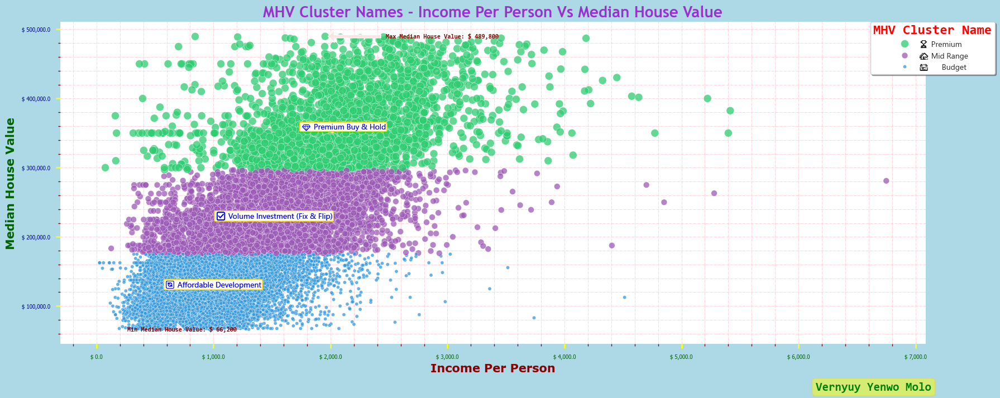

In [114]:
# Scatterplot - MHV Cluster Names - Income Per Person Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_1 = housing_cluster_df.groupby('MHV_cluster_name')[['income_per_person', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_1 = centroids_1.merge(final[['MHV_cluster_name', 'Annotated Summary']], on='MHV_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Premium',                  # High wealth — High income per person, High value
    '1': '🏡 Mid Range',                # Mid wealth — Mid income per person, Mid value
    '2': '🏘️ Budget'                    # Low wealth — Low income per person, Low value
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Premium':         '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🏡 Mid Range':       '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender
    '🏘️ Budget':          '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue  
}

# Define hue order (Revised)
hue_order = [
    '🏆 Premium',
    '🏡 Mid Range',
    '🏘️ Budget',  
]

#==#

# Step 7: Plot 'income_per_person' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='income_per_person',y='median_house_value',hue='MHV_cluster_name',size='MHV_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('MHV Cluster Names - Income Per Person Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('Income Per Person',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.08, 1),borderaxespad=0,title='MHV Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# income_per_person and median_house_value Extraction
xvalues = housing_cluster_df['income_per_person'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_1.iterrows():
    plt.text(row['income_per_person'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold'))
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_17_MHV_Cluster_Names_IPP_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 12: Display plot
plt.show()

**`MHV Cluster Names - Median Income Vs Median House Value`**.

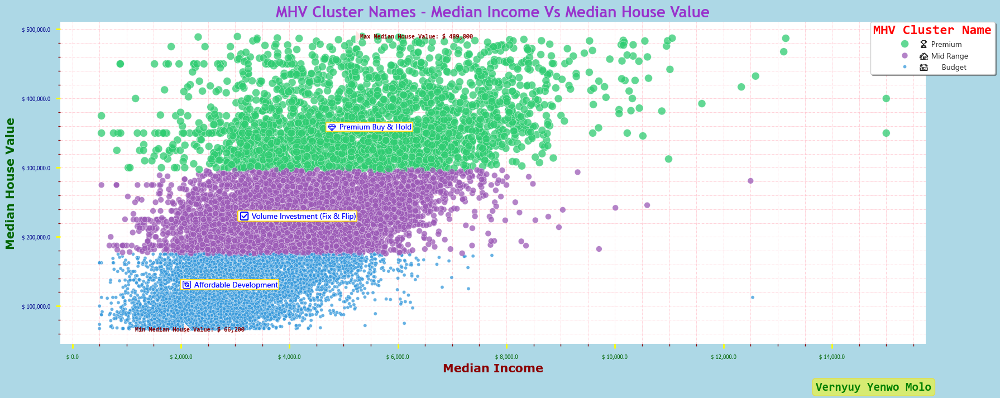

In [115]:
# Scatterplot - MHV Cluster Names - Median Income Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_2 = housing_cluster_df.groupby('MHV_cluster_name')[['median_income', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_2 = centroids_2.merge(final[['MHV_cluster_name', 'Annotated Summary']], on='MHV_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Premium',                  # High wealth — High income per person, High value
    '1': '🏡 Mid Range',                # Mid wealth — Mid income per person, Mid value
    '2': '🏘️ Budget'                    # Low wealth — Low income per person, Low value
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Premium':         '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🏡 Mid Range':       '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender
    '🏘️ Budget':          '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue  
}

# Define hue order (Revised)
hue_order = [
    '🏆 Premium',
    '🏡 Mid Range',
    '🏘️ Budget',  
]

#==#

# Step 7: Plot 'median_income' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='median_income',y='median_house_value',hue='MHV_cluster_name',size='MHV_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('MHV Cluster Names - Median Income Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('Median Income',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.08, 1),borderaxespad=0,title='MHV Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# median_income and median_house_value Extraction
xvalues = housing_cluster_df['median_income'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_2.iterrows():
    plt.text(row['median_income'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold') )
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_18_MHV_Cluster_Names_Median_Income_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display plot
plt.show()

**`Wealth Cluster Mames - Income Per Person Vs Median House Value`**.

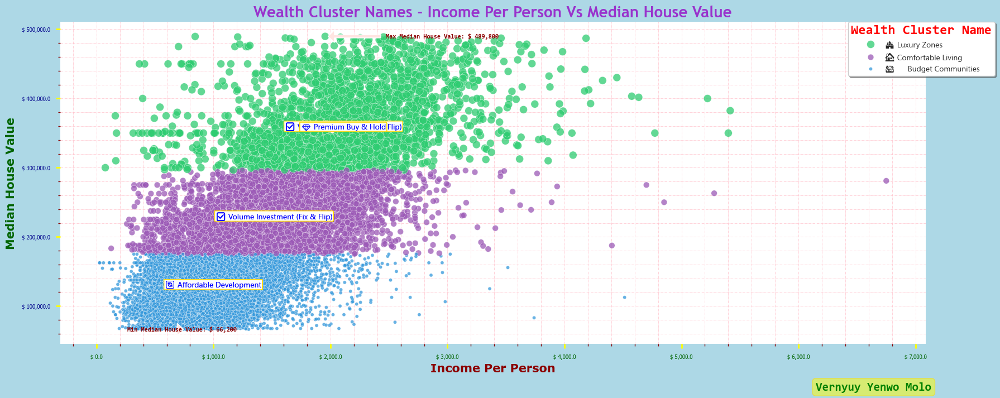

In [116]:
# Scatterplot - Wealth Cluster Names - Income Per Person Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_3 = housing_cluster_df.groupby('wealth_cluster_name')[['income_per_person', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_3 = centroids_3.merge(final[['wealth_cluster_name', 'Annotated Summary']], on='wealth_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏰 Luxury Zones',            # High wealth — High income per person, High value
    '1': '🏠 Comfortable Living',      # Mid wealth — Mid income per person, Mid value
    '2': '🏘️ Budget Communities'       # Low wealth — Low income per person, Low value
}

# Define custom palette (Revised)
custom_palette = {
    '🏰 Luxury Zones':               '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🏠 Comfortable Living':         '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender
    '🏘️ Budget Communities':         '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue  
}

# Define hue order (Revised)
hue_order = [
    '🏰 Luxury Zones',
    '🏠 Comfortable Living',
    '🏘️ Budget Communities',  
]

#==#

# Step 7: Plot 'income_per_person' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='income_per_person',y='median_house_value',hue='wealth_cluster_name',size='wealth_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('Wealth Cluster Names - Income Per Person Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('Income Per Person',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.08, 1),borderaxespad=0,title='Wealth Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# income_per_person and median_house_value Extraction
xvalues = housing_cluster_df['income_per_person'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_3.iterrows():
    plt.text(row['income_per_person'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold') )
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_19_Wealth_Cluster_Names_IPP_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display plot
plt.show()

**`Price Cluster Names - Median Income Vs Median House Value`**.

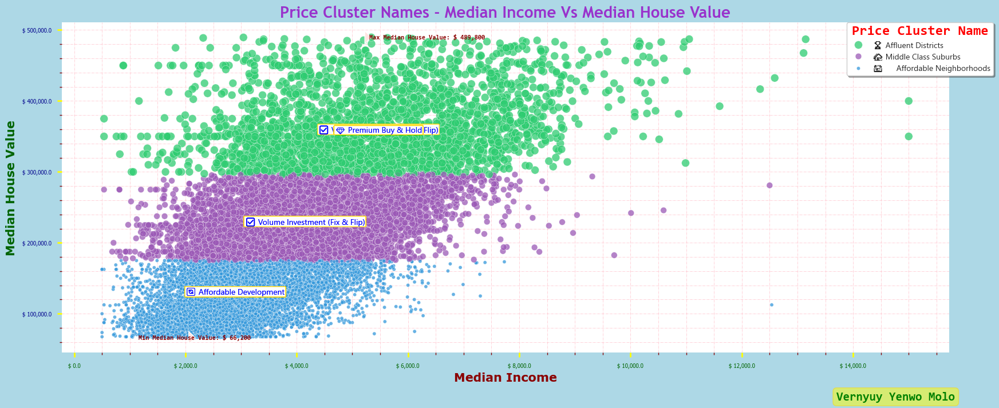

In [117]:
# Scatterplot - Price Cluster Names - Median Income Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_4 = housing_cluster_df.groupby('price_cluster_name')[['median_income', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_4 = centroids_4.merge(final[['price_cluster_name', 'Annotated Summary']], on='price_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Affluent Districts',        # Premium - High (income + house value)
    '1': '🏡 Middle Class Suburbs',      # Mid Range - Mid (income + house value)
    '2': '🏘️ Affordable Neighborhoods'   # Budget - Low (income + house value)
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Affluent Districts':         '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🏡 Middle Class Suburbs':       '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender
    '🏘️ Affordable Neighborhoods':   '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue  
}

# Define hue order (Revised)
hue_order = [
    '🏆 Affluent Districts',
    '🏡 Middle Class Suburbs',
    '🏘️ Affordable Neighborhoods',  
]

#==#

# Step 7: Plot 'median_income' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='median_income',y='median_house_value',hue='price_cluster_name',size='price_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('Price Cluster Names - Median Income Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('Median Income',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.05, 1),borderaxespad=0,title='Price Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# median_income and median_house_value Extraction
xvalues = housing_cluster_df['median_income'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_4.iterrows():
    plt.text(row['median_income'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold') )
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_20_Price_Cluster_Names_IPP_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display plot
plt.show()

**`Market Segment Cluster Names - Median Income Vs Median House Value`**.

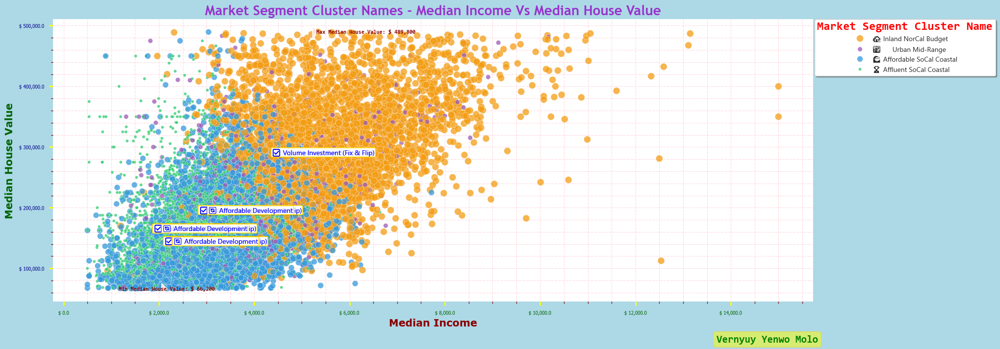

In [118]:
# Scatterplot - Market Segment Cluster Names - Median Income Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_5 = housing_cluster_df.groupby('market_segment_cluster_name')[['median_income', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_5 = centroids_5.merge(final[['market_segment_cluster_name', 'Annotated Summary']], on='market_segment_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Affluent SoCal Coastal',   # MI: $5.6k, MHV: $296k,  $r = 1
    '1': '🌊 Affordable SoCal Coastal', # MI: $3.2k, MHV: $153k , $r = 4
    '2': '🏡 Inland NorCal Budget',     # MI: $2.9k, MHV: $166k,  $r = 3 
    '3': '🏙️ Urban Mid-Range',          # MI: $4k,   MHV: $203k,  $r = 2
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Affluent SoCal Coastal':     '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🌊 Affordable SoCal Coastal':   '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue
    '🏡 Inland NorCal Budget':       '#f39c12',    # Orange — inland warmth,  '#D68910',  # Mustard, '#F8C471',  # Peach
    '🏙️ Urban Mid-Range':            '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender  
}

# Define hue order (Revised)
hue_order = [
    '🏡 Inland NorCal Budget', # 1
    '🏙️ Urban Mid-Range', # 2
    '🌊 Affordable SoCal Coastal', # 3
    '🏆 Affluent SoCal Coastal', # 4   
]

#==#

# Step 7: Plot 'median_income' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='median_income',y='median_house_value',hue='market_segment_cluster_name',size='market_segment_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('Market Segment Cluster Names - Median Income Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('Median Income',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.24, 1),borderaxespad=0,title='Market Segment Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# median_income and median_house_value Extraction
xvalues = housing_cluster_df['median_income'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_5.iterrows():
    plt.text(row['median_income'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold') )
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_21_Market_Segment_Cluster_Names_MI_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display plot
plt.show()

**`Market Segment Cluster Names - Income Per Person Vs Median House Value`**.

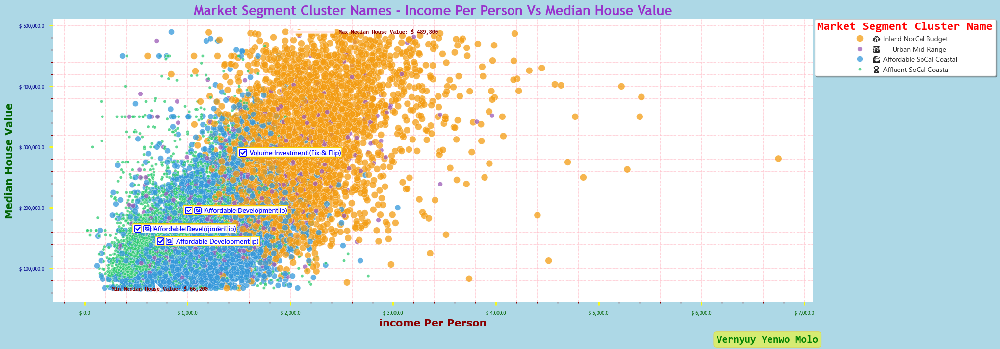

In [119]:
# Scatterplot - Market Segment Cluster Names - Income Per Person Vs Median House Value.

# Step 1: Create a copy to preserve final
housing_cluster_df = final.copy()

#==#

# Step 2: Get cluster centroids for positioning labels
centroids_6 = housing_cluster_df.groupby('market_segment_cluster_name')[['income_per_person', 'median_house_value']].median().round(2).reset_index()

#==#

# Step 3: Merge Annotated Summary (and emoji) from final
emoji_map = {
    
    'Premium Buy & Hold': '💎',
    'Volume Investment (Fix & Flip)': '✅',
    'Affordable Development': '🔄',
    #'At-Risk / Churned': '❗',
    #'Lost / Inactive': '❌',
    }

final['Annotated Summary'] = final['Best Strategy'].map(emoji_map) + " " + final['Best Strategy']
centroids_6 = centroids_6.merge(final[['market_segment_cluster_name', 'Annotated Summary']], on='market_segment_cluster_name', how='left')


#==#

# Step 4: Prepare plot
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=(12,6),layout=None,facecolor='lightblue',dpi=100)

#==#

# # Step 5: Optional: add cluster centers if available
# centers = kmeans_model.cluster_centers_[:, [0, 1]]
# plt.scatter(centers[:, 0], centers[:, 1], s=250, c='black', marker='X', label='Centroids')

#==#

# Step 6: Define cluster names, custom palette  & hue order

# Define cluster names (Revised)
cluster_names = {
    '0': '🏆 Affluent SoCal Coastal',   # MI: $5.6k, MHV: $296k,  $r = 1
    '1': '🌊 Affordable SoCal Coastal', # MI: $3.2k, MHV: $153k , $r = 4
    '2': '🏡 Inland NorCal Budget',     # MI: $2.9k, MHV: $166k,  $r = 3 
    '3': '🏙️ Urban Mid-Range',          # MI: $4k,   MHV: $203k,  $r = 2
}

# Define custom palette (Revised)
custom_palette = {
    '🏆 Affluent SoCal Coastal':     '#2ecc71',    # Green — wealth, '#1B5E20',  # Deep emerald, '#82E0AA',  # Mint, 
    '🌊 Affordable SoCal Coastal':   '#3498db',    # Blue — coastal,  # Sky blue, '#7FB3D5',  # Soft blue
    '🏡 Inland NorCal Budget':       '#f39c12',    # Orange — inland warmth,  '#D68910',  # Mustard, '#F8C471',  # Peach
    '🏙️ Urban Mid-Range':            '#9b59b6',    # Purple — urban, '#6C3483'   # Royal purple, '#BB8FCE'   # Lavender  
}

# Define hue order (Revised)
hue_order = [
    '🏡 Inland NorCal Budget', # 1
    '🏙️ Urban Mid-Range', # 2
    '🌊 Affordable SoCal Coastal', # 3
    '🏆 Affluent SoCal Coastal', # 4   
]

#==#

# Step 7: Plot 'income_per_person' vs 'median_house_value'
scatterplot = sns.scatterplot(data=housing_cluster_df,x='income_per_person',y='median_house_value',hue='market_segment_cluster_name',size='market_segment_cluster_name',style=None,palette=custom_palette,
hue_order=hue_order,hue_norm=None,sizes=(20,100),size_order=None,size_norm=None,marker='o',style_order=None,legend=True,ax=ax,
alpha=0.75,edgecolor='white') # legend='full' # legend='brief, # palette: cool, coolwarm, spring, summer, autumn, winter display big data with more visual variety

#==#

# Step 8: Set figure size, title, labels, formatter, ticks, spines, facecolor, grid & legend
scatterplot.figure.set_size_inches(20, 7.5)
ax.set_title('Market Segment Cluster Names - Income Per Person Vs Median House Value',loc='center',fontdict=title_font)
ax.set_xlabel('income Per Person',loc='center',fontdict=x_label_font)
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.xaxis.set_major_formatter(StrMethodFormatter('$ {x:,}')) # £/$
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_xticks([,])
ax.set_ylabel('Median House Value',loc='center',fontdict=y_label_font)
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,}'))
ax.yaxis.set_major_formatter(StrMethodFormatter(' $ {x:,}')) # £/$
# ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.1%}')) # %
# ax.set_yticks([,])

ax.tick_params(axis='x', bottom=True, top=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkgreen', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='y', left=True, right=False, length=6, width=2, color='yellow', direction='out', labelsize=7, labelcolor='darkblue', labelfontfamily='tahoma', labelrotation=None)
ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=3, width=1, color='darkred')
ax.tick_params(axis='y', which='minor', left=True, right=False,  length=3, width=1, color='darkred')

ax.minorticks_on()

ax.spines[['top','right']].set_visible(False)
ax.spines[['bottom','left']].set_visible(False)

ax.set_facecolor('white')

ax.grid(which='both',linestyle='dashdot',color='pink',linewidth=0.5)

# ax.autoscale()
# ax.axis('equal')
# ax.set_xlim(left=0)
# ax.set_ylim(bottom=0)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_yscale('linear')  # Try removing log scale

# legend_properties = {'family':'consolas','style':'normal','weight':'bold','size':13}
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',prop=legend_properties,frameon=True,shadow=True,fancybox=True)
title_props=dict(family='consolas',style='normal',weight='bold',size='x-large')
legend_props=dict(family='Segoe UI Emoji',style='normal',weight='bold',size='small')
# sns.move_legend(ax,"best",bbox_to_anchor=(1, 1),borderaxespad=0,title='Day',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend = ax.legend(loc='best',bbox_to_anchor=(1.24, 1),borderaxespad=0,title='Market Segment Cluster Name',title_fontproperties=title_props,prop=legend_props,frameon=True,shadow=True,fancybox=True)
legend.get_title().set_color("red")

#==#

# Step 9: Automatically Annotate The Minumum & Maximum Value

# income_per_person and median_house_value Extraction
xvalues = housing_cluster_df['income_per_person'].reset_index(drop=True)  # ← Reset index!
yvalues = housing_cluster_df['median_house_value'].reset_index(drop=True)  # ← Reset index!

# Find index of minumum value
min_index=np.argmin(yvalues)
# Get the x and y values at the minimum index
min_x = xvalues[min_index]
min_y = yvalues[min_index]

# Find index of maximun value
max_index=np.argmax(yvalues)
# Get the x and y values at the maximum index
max_x = xvalues[max_index]
max_y = yvalues[max_index]

# Annotate the minimum value in the plot
ax.annotate(f'Min Median House Value: $ {min_y:,.0f}',xy=(min_x,min_y),xytext=(min_x-10,min_y-0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

# Annotate the maximum value in the plot
ax.annotate(f'Max Median House Value: $ {max_y:,.0f}',xy=(max_x,max_y),xytext=(max_x+1000,max_y+0.00),
ha='center',va='center',family='consolas',fontstyle='normal',fontsize=8,fontweight='bold',color='darkred',rotation=0,
arrowprops=dict(facecolor='mistyrose',headwidth=16,headlength=8,width=4,shrink=0.05))

#==#

# Step 10: Annotate each cluster centroid
for _, row in centroids_6.iterrows():
    plt.text(row['income_per_person'] + 2, row['median_house_value'] + 2, row['Annotated Summary'],ha='center',va='bottom',color='blue',family='Segoe UI Emoji',fontsize=10,fontstyle='normal',fontweight='bold',rotation=0,
        bbox=dict(boxstyle="round",pad=0.1,facecolor='white',alpha=0.45,edgecolor='gold') )
    
#==#

# Step 11: Add signature to figure in bbox round format
ax.text(0.94, -0.15,'Vernyuy Yenwo Molo',ha='center',va='bottom',transform=ax.transAxes,  # Use axes coords (0 to 1)
        family='consolas',fontstyle='normal',
        fontsize=15,fontweight='bold',color='green',rotation=0,
        bbox=dict(boxstyle='round',facecolor='yellow',alpha=0.5,edgecolor='gold'))

#==#

# Step 12: Save plot as png
my_path = r"\Users\tailb\Data Science\GH_Projects\Python_Projects\California_Housing_Market_Data_Analysis\2_Unsupervised_Learning\Assets_MHV_Price_Clustering"
plt.savefig(my_path + '/Py_22_Market_Segment_Cluster_Names_IPP_Vs_MHV_Scatterplot.png',transparent=None,dpi='figure',format=None,metadata=None,bbox_inches='tight',pad_inches=0.1,facecolor='auto',edgecolor='yellow',backend=None)

#==#

# Step 13: Display plot
plt.show()

### `💾 Save Modified DataFrame To Python Docs Folder`.

**`To CSV Files Folder`**

In [120]:
# 📁 Define base CSV directory
csv_files_dir = os.path.expanduser("~/Python-Documents/os/CSV Files")

# 🧱 Create directory if it doesn't exist
os.makedirs(csv_files_dir, exist_ok=True)

# 📄 Define full CSV file path
csv_path = os.path.join(csv_files_dir, "California_Housing_Market_Data_Analysis_modified_3.csv")

# 💾 Save modified dataset to CSV file
final.to_csv(csv_path, index=False)

# print("Modified CSV file saved to:", csv_path)